In [2]:
#https://pingouin-stats.org/generated/pingouin.pairwise_ttests.html
#http://localhost:8888/notebooks/4_pipeline_train_evaluate.ipynb -> friedman + critical difference
# https://www.dmcdougall.co.uk/publication-ready-the-first-time-beautiful-reproducible-plots-with-matplotlib 

# General imports

In [33]:
import regex as re
import numpy as np
import pandas as pd
import matplotlib
%matplotlib inline
from matplotlib import pyplot as plt
import seaborn as sns
sns.set(color_codes=True)
sns.set_style('white')
sns.set_context("paper", font_scale = 2)
# plt.rcParams['figure.figsize'] = [12, 8]
# plt.rcParams['figure.dpi'] = 100

markers = ["o"]*2 + ["D"] + ["X"]*2 + ["v"]*2 + ["^"]*2 + ["*", ".", "D", "X", "X", "v", "v", "^", "^"] 
palette = sns.color_palette("viridis", 9) + sns.color_palette("magma", 9)
ROOT = "/mnt/lerna/models/"


ds = []
for d in "CLINC150|20news|imdb|Reuters_multilabel|AAPD".split("|"): 
    df = pd.read_excel(ROOT+d+"_benchmark_M.xlsx")
    df = df.groupby(["ref","dataset"],as_index=False).mean()#.reset_index()
    df.replace(str(np.NaN),np.NaN, inplace=True)
    df.replace(np.NaN,"", inplace=True)
    ds.append(df)
    
df = pd.concat(tuple(ds), axis=0)
print(df.head())

refs = ["Unregularized",
"Regularized",
"MC Dropout",
"Heteroscedastic",
"MC Heteroscedastic",
"Concrete Dropout",
"MC Concrete Dropout",
"Heteroscedastic Concrete Dropout",
"MC Heteroscedastic Concrete Dropout",
"Deep Ensemble",
"Deep Ensemble Regularized",
"MC Ensemble",
"Concrete Dropout Ensemble",
"MC Concrete Dropout Ensemble",
"Heteroscedastic Ensemble",
"MC Heteroscedastic Ensemble",
"Heteroscedastic Concrete Dropout Ensemble",
"MC Heteroscedastic Concrete Dropout Ensemble"]


order = {"20news":0, "imdb":1, "CLINC150":2, "Reuters_multilabel":3, "AAPD":4}
df["order"] = df["dataset"].apply(lambda x: order[x])
df["methodref"] = df["ref"].apply(lambda x: refs.index(x))
df = df.sort_values(by=["order", "methodref"],ascending=True)

df.columns = [col.replace("(↓)","") for col in df.columns]
#df["use_aleatorics"]
# df["concrete_dropout"]
# df["ensemble"]
# df["base"]

                         ref   dataset       Acc      MSE(↓)   F1(m)  \
0           Concrete Dropout  CLINC150  0.899233  146.232250  0.8992   
1  Concrete Dropout Ensemble  CLINC150  0.915200  103.854000  0.9151   
2              Deep Ensemble  CLINC150  0.897500  147.985900  0.8979   
3  Deep Ensemble Regularized  CLINC150  0.907300  133.789200  0.9068   
4            Heteroscedastic  CLINC150  0.893700  159.013967  0.8932   

      F1(M)    NLL(↓)    ECE(↓)  Brier(↓)       AUC  ...     UoF@5   FP@5(↓)  \
0  0.894900  0.398317  0.016950  0.147133  0.992600  ...  0.902867  0.049483   
1  0.909100  0.336300  0.033500  0.128100  0.996200  ...  0.936200  0.049200   
2  0.892500  0.403700  0.022800  0.153200  0.994400  ...  0.891900  0.050000   
3  0.902100  0.394300  0.065200  0.146300  0.996500  ...  0.915500  0.049200   
4  0.888917  0.436633  0.034483  0.161250  0.993717  ...  0.882267  0.049433   

          T>  use_aleatorics concrete_dropout  ensemble    ood  num_layers  \
0  57.66

# Ablation: diversity

In [70]:
import ast 

measure = "KL(µ)"
ds = []
for d in "CLINC150|20news|imdb|Reuters_multilabel|AAPD".split("|"): 
    df = pd.read_excel(ROOT+d+"_benchmarkraw_Mlevel.xlsx") #_m
    #df = df.groupby(["ref","dataset"]).mean().reset_index()
    df["accuracies"] = df["accuracies"].apply(lambda x: ast.literal_eval(x))
    df["accuracies"] = df["accuracies"].apply(lambda x: np.array(x))
    df["diversities"] = df["diversities"].apply(lambda x: ast.literal_eval(x) if x != 0 else [])
    df["diversities"] = df["diversities"].apply(lambda x: np.array(x))
    df.replace(str(np.NaN),np.NaN, inplace=True)
    df.replace(np.NaN,0, inplace=True)
    ds.append(df)
    
df = pd.concat(tuple(ds), axis=0)

order = {"20news":0, "imdb":1, "CLINC150":2, "Reuters_multilabel":3, "AAPD":4}
df["order"] = df["dataset"].apply(lambda x: order[x])
df["methodref"] = df["ref"].apply(lambda x: refs.index(x))
df = df.sort_values(by=["order", "methodref"],ascending=True)
df.columns = [col.replace("(↓)","") for col in df.columns]

df.columns
#print(df.head())
# plt.rcParams['figure.figsize'] = [12, 8]
# sns.catplot(x="dataset",y=measure, data=df, hue="ref",kind="bar")

/home/jordy/.virtualenvs/arkham/lib/python3.6/site-packages/pandas/core/missing.py:49: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask = arr == x


Index(['version', 'accuracies', 'diversities', 'unopened_field', 'Acc', 'MSE',
       'F1(m)', 'F1(M)', 'NLL', 'ECE', 'Brier', 'AUC', 'Softmax(μ)',
       'Entropy(μ)', 'MU(μ)', 'DU(μ)', 'KL(µ)', 'AUB', 'UoF@5', 'FP@5', 'T>',
       'dataset', 'base', 'sampling', 'use_aleatorics', 'concrete_dropout',
       'ensemble', 'ood', 'arx', 'ref', 'num_layers', 'distribution',
       'event_shape', 'sigma_scaler', 'hamming', 'order', 'methodref'],
      dtype='object')

/home/jordy/.virtualenvs/arkham/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/home/jordy/.virtualenvs/arkham/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/home/jordy/.virtualenvs/arkham/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the 

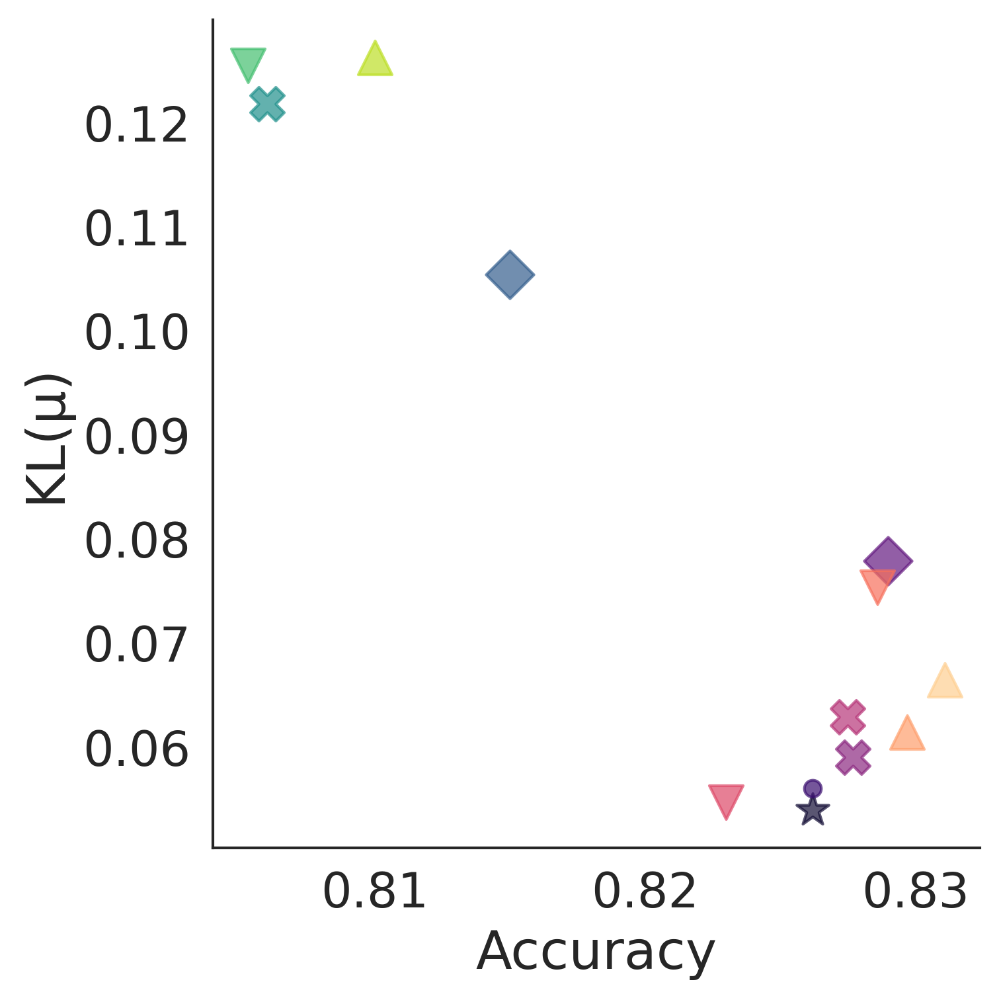

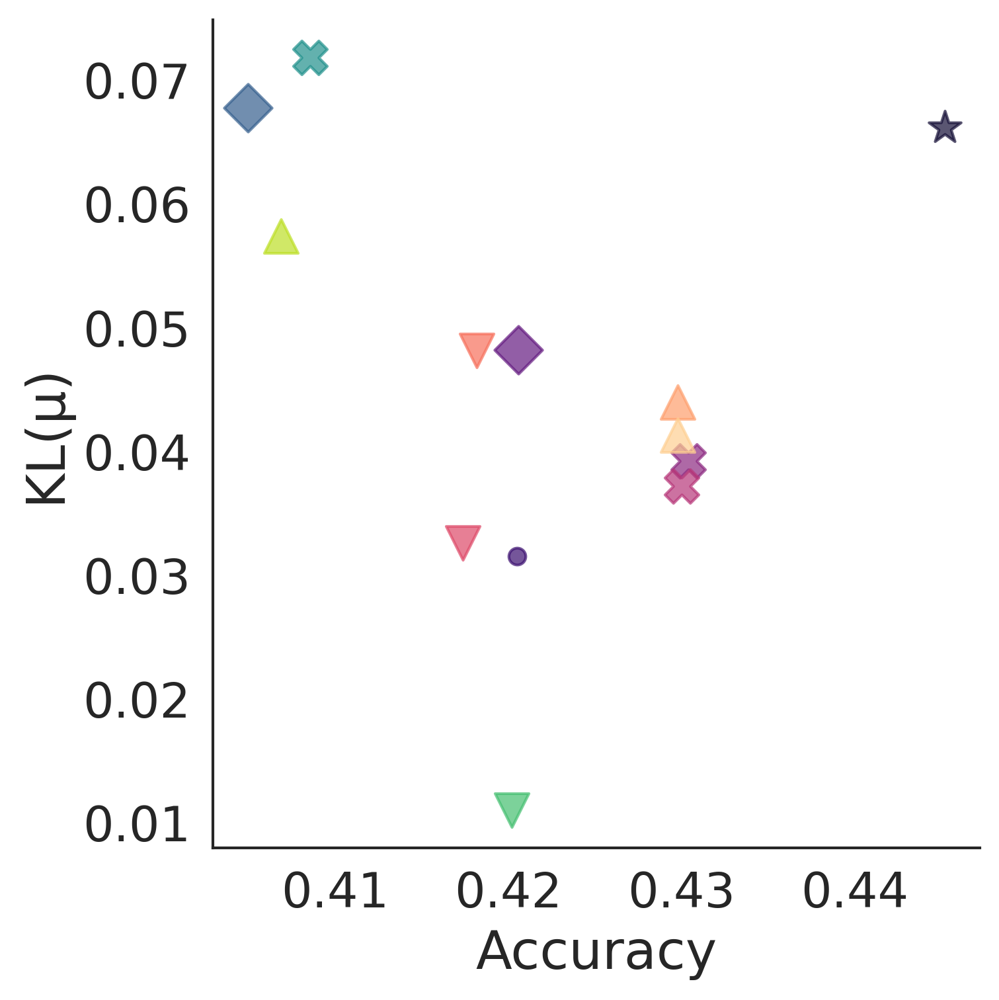

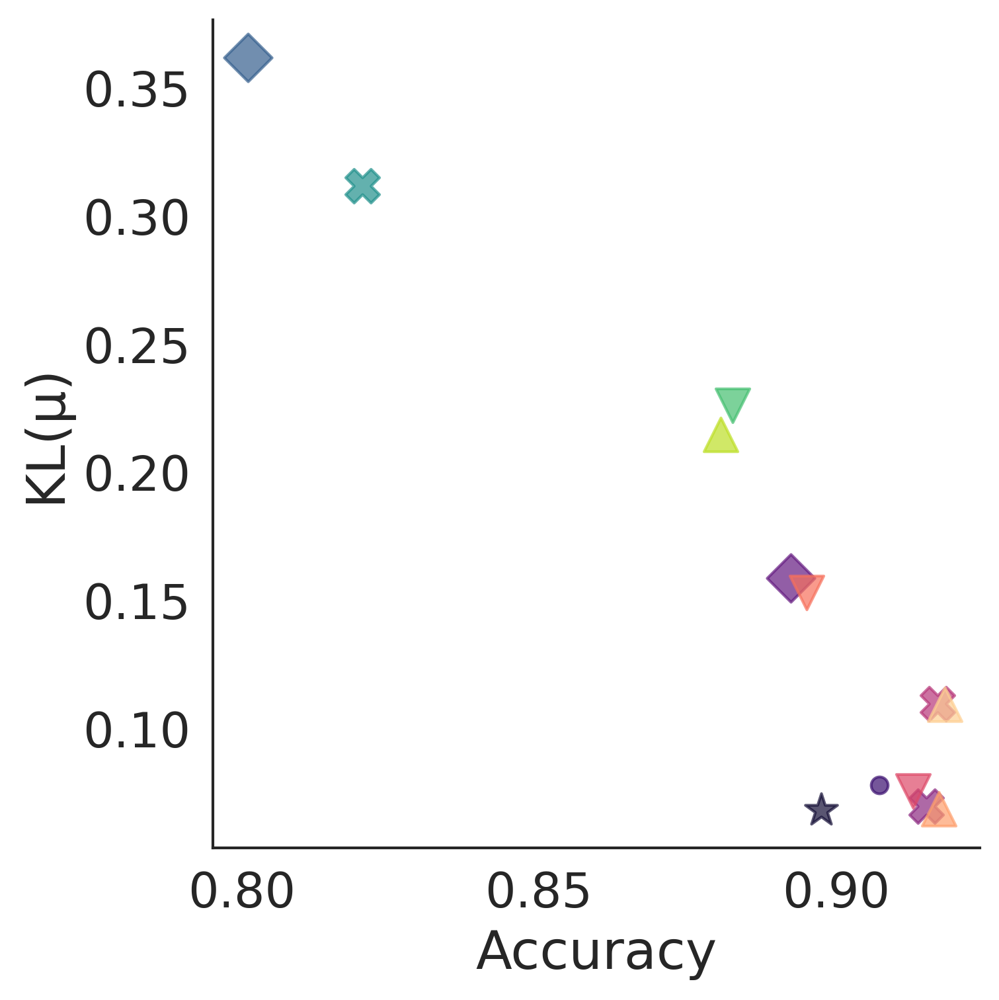

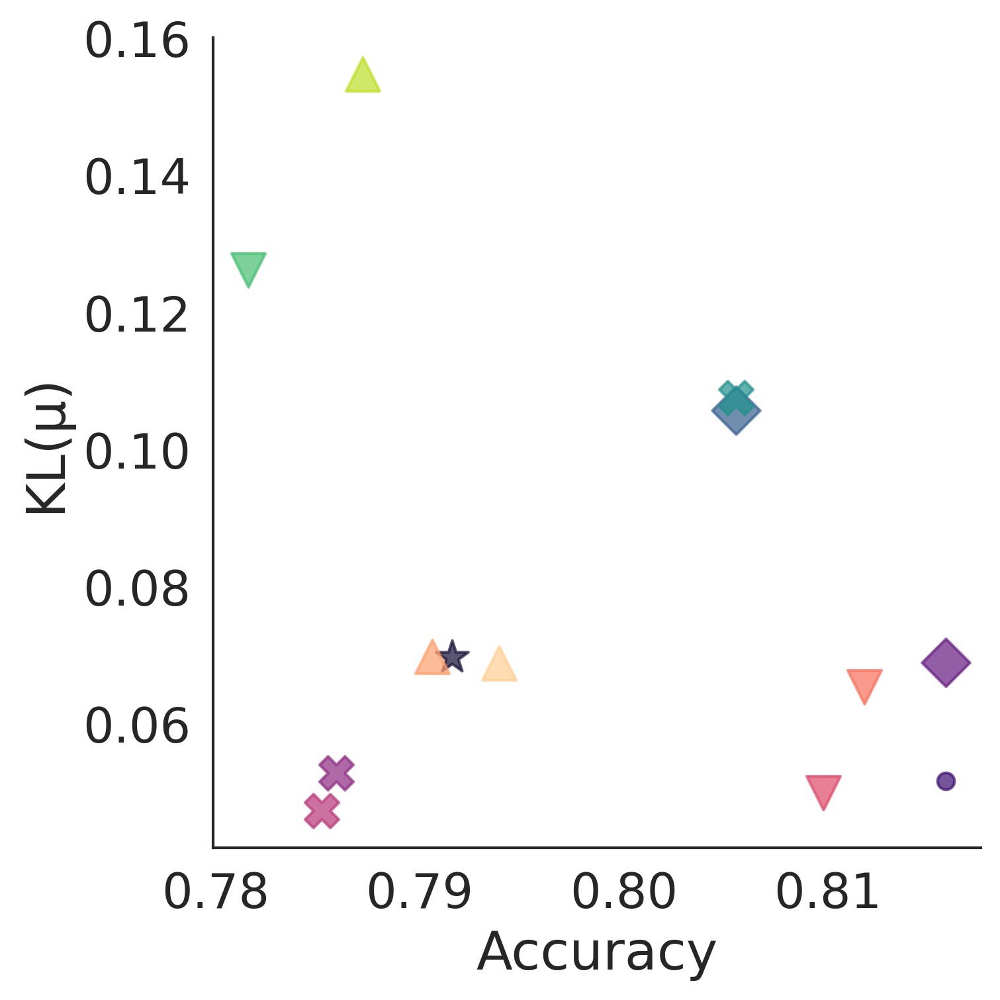

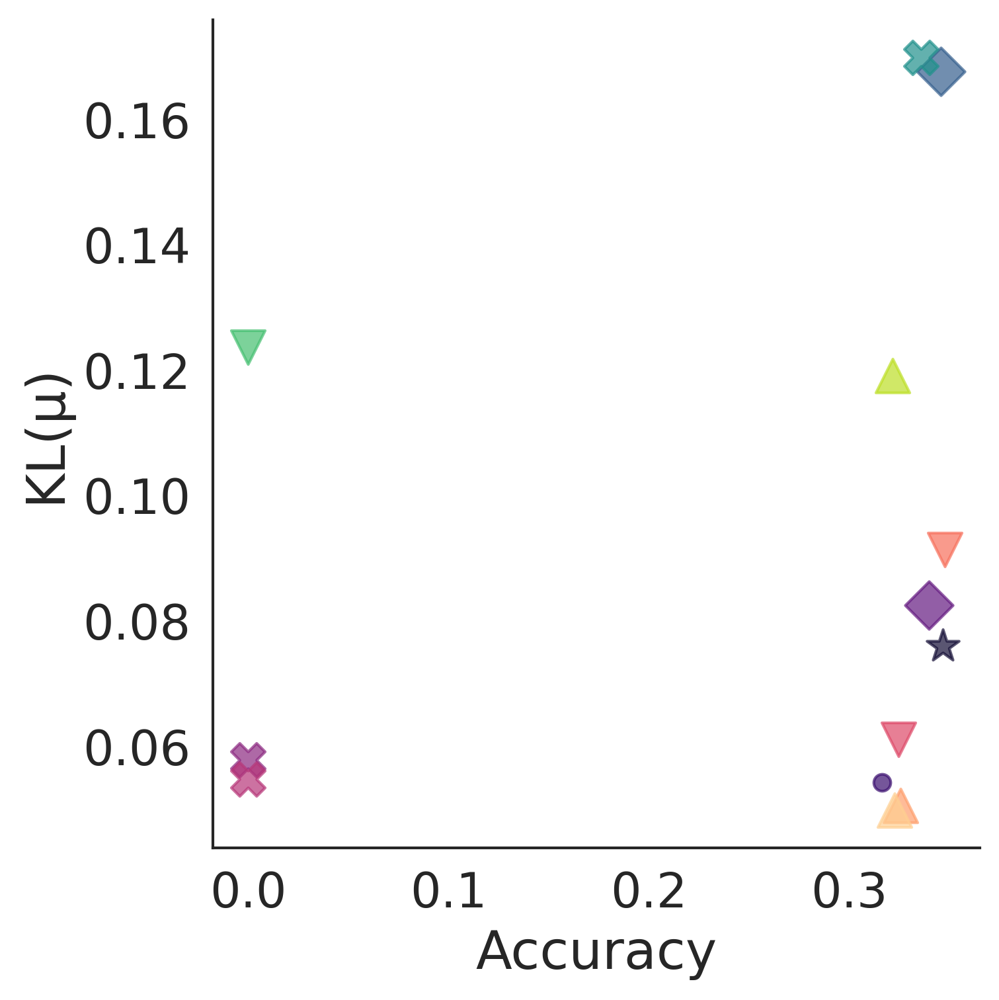

In [101]:
measure = "Accuracy"
plt.rcParams['figure.dpi'] = 300
for i, dataset in enumerate("20news|imdb|CLINC150|Reuters_multilabel|AAPD".split("|")):
    mini_df= df[(df["dataset"] == dataset)] # & (df["KL(µ)"] > 0)
    mini_df["x"]  = np.arange(len(mini_df))
    mini_df = mini_df.loc[mini_df["KL(µ)"]!=0]
    idx = mini_df.index
    m = [x for i,x in enumerate(markers) if i in idx]
    p = [x for i,x in enumerate(palette) if i in idx]
    mini_df["Accuracy"] = mini_df["Acc"]
    lm = sns.lmplot(data=mini_df[["Accuracy",'KL(µ)','ref']],x=measure, y="KL(µ)", hue="ref", markers=m,palette=p, scatter=True,legend=False,scatter_kws={"s": 150, "alpha":0.7})
    # Access the figure
    fig = lm.fig 
    #plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False)
    # Add a title to the Figure
    #fig.suptitle(dataset, fontsize=14)
    #fig.tight_layout(h_pad=1.5,pad=1.02)
    #plt.tight_layout()
    #break
    plt.tight_layout(pad=0.3)
    plt.savefig(dataset+"_"+measure+"_KL.png")

/media/hdd/.virtualenvs/calibration/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


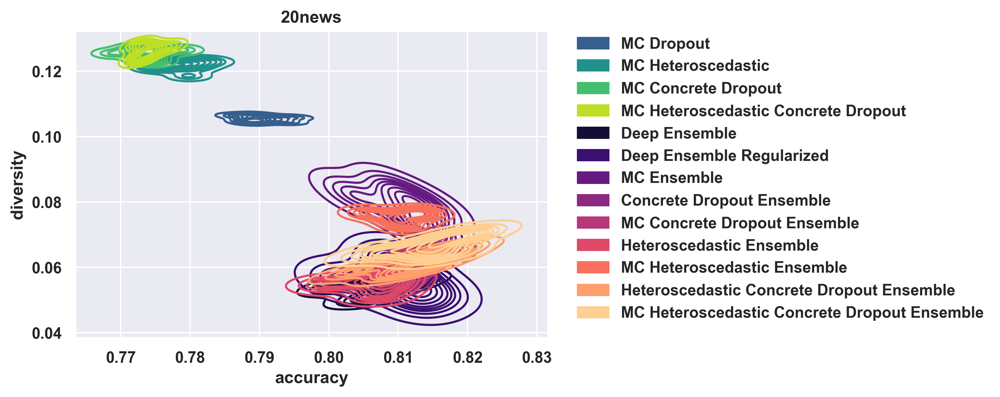

/media/hdd/.virtualenvs/calibration/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/media/hdd/.virtualenvs/calibration/lib/python3.6/site-packages/seaborn/distributions.py:1077: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


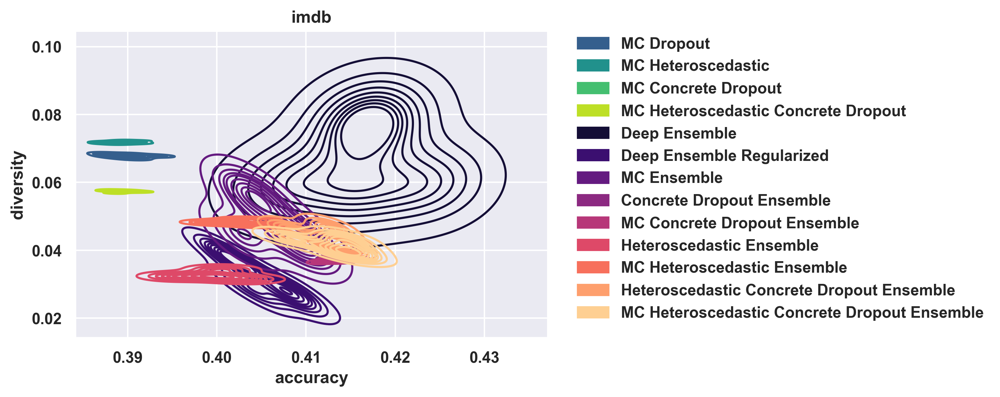

/media/hdd/.virtualenvs/calibration/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


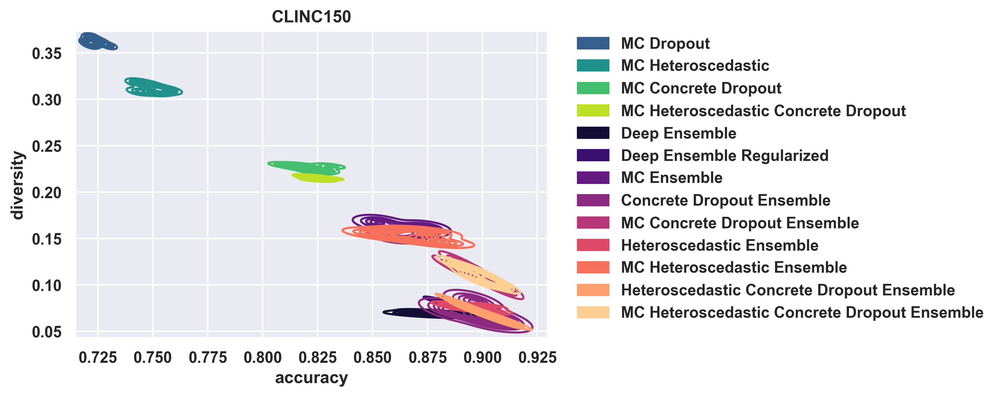

/media/hdd/.virtualenvs/calibration/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


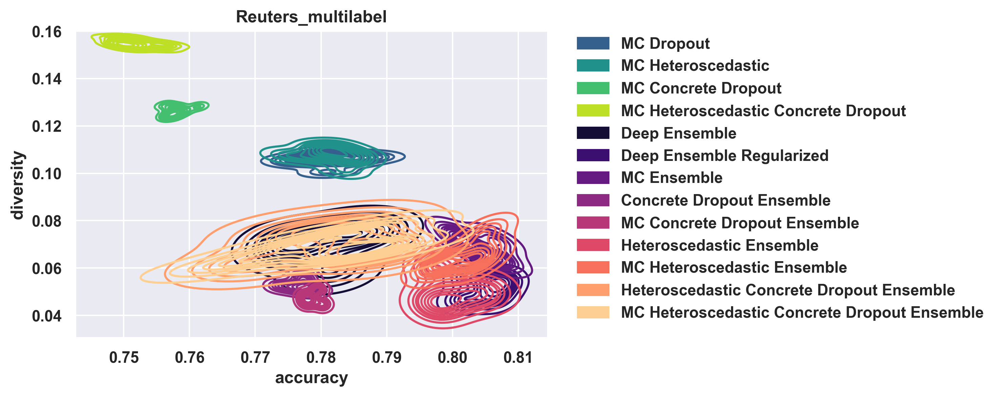

/media/hdd/.virtualenvs/calibration/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/media/hdd/.virtualenvs/calibration/lib/python3.6/site-packages/seaborn/distributions.py:1077: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/media/hdd/.virtualenvs/calibration/lib/python3.6/site-packages/seaborn/distributions.py:1077: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/media/hdd/.virtualenvs/calibration/lib/python3.6/site-packages/seaborn/distributions.py:1077: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


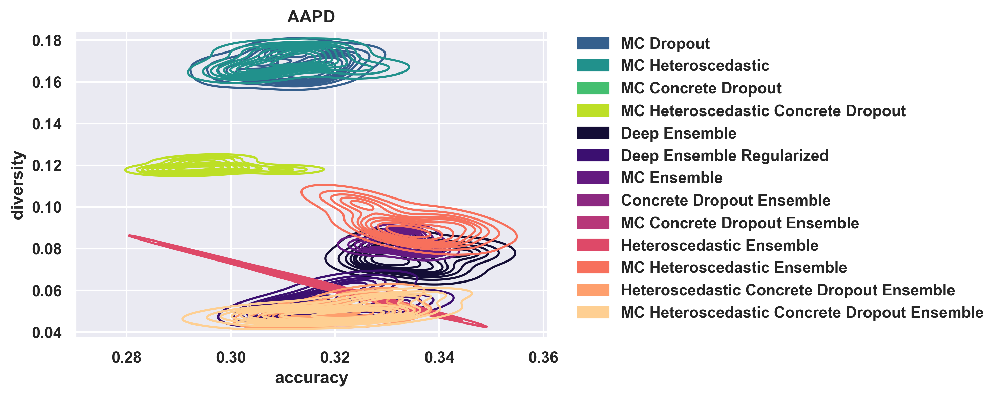

In [22]:
#accuracies vs. diversities
plt.rcParams['figure.dpi'] = 300
import matplotlib.patches as mpatches
for i, dataset in enumerate("20news|imdb|CLINC150|Reuters_multilabel|AAPD".split("|")):
    mini_df= df[(df["dataset"] == dataset)] # & (df["KL(µ)"] > 0)
    mini_df["x"]  = np.arange(len(mini_df))
    mini_df = mini_df.loc[mini_df["KL(µ)"]!=0]
    label_patches = []
    for j, ref in enumerate(refs):
        ref_df = mini_df[(mini_df["ref"] == ref)]#.reset_index(drop=True)
        if len(ref_df) == 0:
            continue
        #print(ref, ref_df["accuracies"].item())
        #sns.scatterplot(x=ref_df["accuracies"].item(), y=ref_df["diversities"].item(),color=palette[j],legend=True)#,kde=True,multiple="stack")
        g = sns.kdeplot(x=ref_df["accuracies"].item(), y=ref_df["diversities"].item(),color=palette[j],legend=False)#,kde=True,multiple="stack")
        label_patch = mpatches.Patch(
            color=palette[j],
            label=ref)
        label_patches.append(label_patch)
        g.set(ylabel="diversity", xlabel = "accuracy")
    plt.title(dataset)
    plt.legend(handles=label_patches, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False)
    #plt.savefig("CLINC150_epistemics_BERT.png")
    """

        label_patch = mpatches.Patch(
        color=sns.color_palette(cmaps[i])[2],
        label=label)
    label_patches.append(label_patch)

    """
    plt.show()

# Ablation: BERT

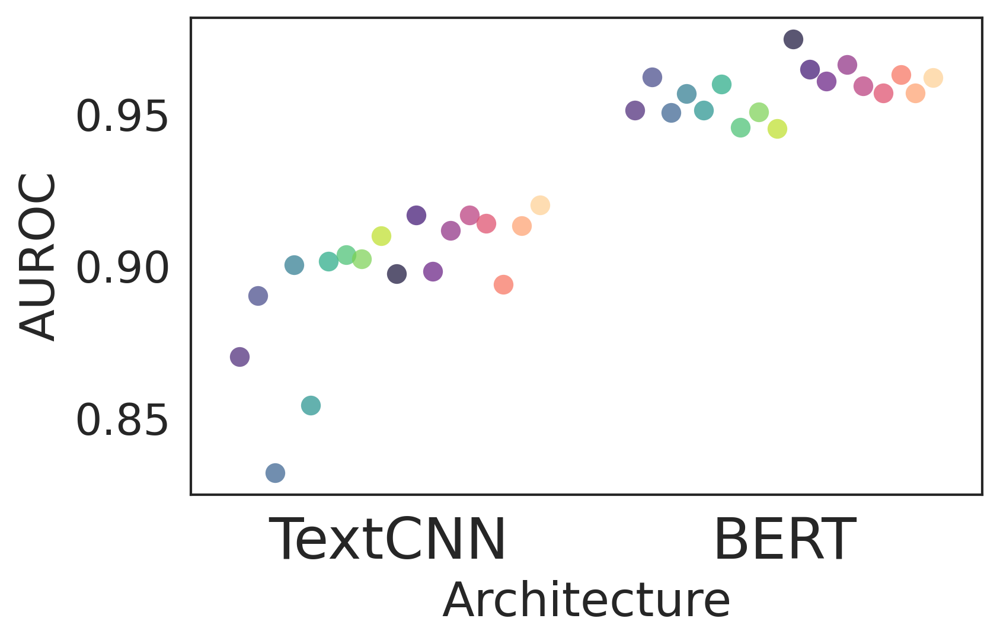

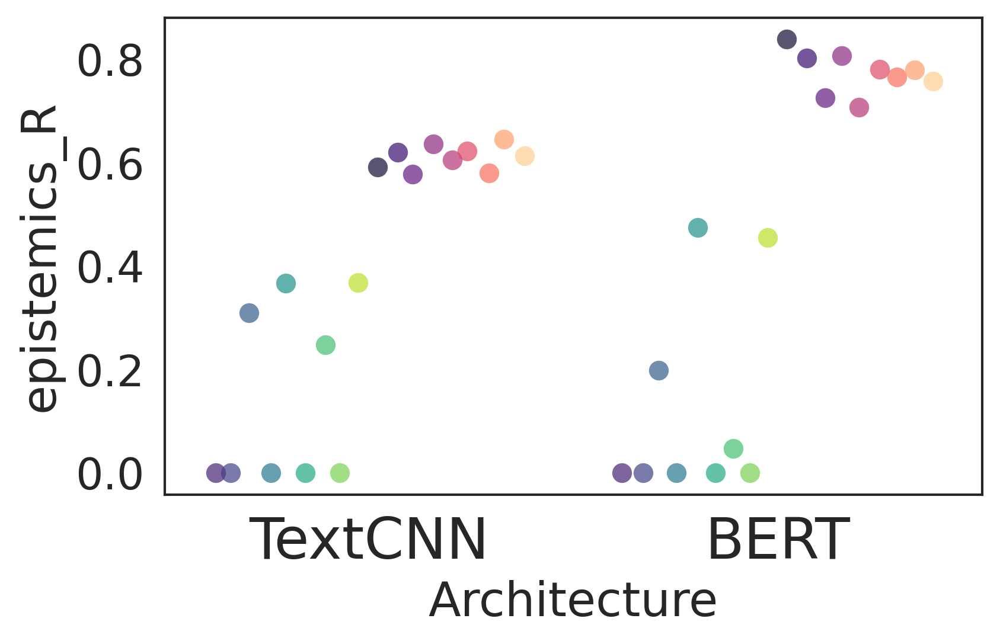

In [103]:
bertf = pd.read_excel("/mnt/lerna/models/CLINC150_BERT_ood.xlsx")
cnnf = pd.read_excel("/mnt/lerna/models/CLINC150_benchmark_ood.xlsx")
#cnnf = cnnf.groupby(["ref","dataset"]).mean().reset_index()
arxf = pd.concat((cnnf,bertf), axis=0)

#print(arxf["arx"])

arxf.replace({"TextClassificationCNN_simple":"TextCNN", "BERT_dense":"BERT"},inplace=True)
arxf["Architecture"] = arxf["arx"]
#plt.rcParams['figure.figsize'] = [8, 6]
g = sns.stripplot(data=arxf,x="Architecture", y="AUROC", hue="ref",dodge=True,palette=palette, alpha=0.7,size=8)
g.legend_.remove()
g.tick_params(axis="x",labelsize="large")
# handles, labels = g.get_legend_handles_labels()
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False)
plt.tight_layout()
plt.savefig("CLINC150_AUROC_BERT.png")
plt.show()
g = sns.stripplot(data=arxf,x="Architecture", y="epistemics_R", hue="ref",dodge=True,palette=palette, alpha=0.7,size=8)
g.legend_.remove()
g.tick_params(axis="x",labelsize="large")
# handles, labels = g.get_legend_handles_labels()
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False)
plt.tight_layout()
plt.savefig("CLINC150_epistemics_BERT.png")

In [21]:
dataset = "Reuters_multilabel"

bertf = pd.read_excel("/mnt/lerna/models/"+dataset+"_BERT_ood.xlsx")
cnnf = pd.read_excel("/mnt/lerna/models/"+dataset+"_benchmark_ood.xlsx")
#cnnf = cnnf.groupby(["ref","dataset"]).mean().reset_index()
arxf = pd.concat((cnnf,bertf), axis=0)

#print(arxf["arx"])

arxf.replace({"TextClassificationCNN_simple":"TextCNN", "BERT_dense":"BERT", "arx":"Architecture"},inplace=True)
arxf["Architecture"] = arxf["arx"]
arxf["In-Domain Accuracy"] = arxf["Acc_IID"]


#plt.rcParams['figure.figsize'] = [8, 6]
# g = sns.stripplot(data=arxf,x="Architecture", y="AUROC", hue="ref",dodge=True,palette=palette, alpha=0.7,size=8)
# g.legend_.remove()
# g.tick_params(axis="x",labelsize="large")
# # handles, labels = g.get_legend_handles_labels()
# # plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False)
# plt.tight_layout()
# plt.savefig(dataset+"_AUROC_BERT.png")
# plt.show()
# g = sns.stripplot(data=arxf,x="Architecture", y="epistemics_R", hue="ref",dodge=True,palette=palette, alpha=0.7,size=8)
# g.legend_.remove()
# g.tick_params(axis="x",labelsize="large")
# # handles, labels = g.get_legend_handles_labels()
# # plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False)
# plt.tight_layout()
# plt.savefig(dataset+"_epistemics_BERT.png")
# plt.show()
# g = sns.stripplot(data=arxf,x="Architecture", y="entropy_R", hue="ref",dodge=True,palette=palette, alpha=0.7,size=8)
# g.legend_.remove()
# g.tick_params(axis="x",labelsize="large")
# # handles, labels = g.get_legend_handles_labels()
# # plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False)
# plt.tight_layout()
# plt.savefig(dataset+"_entropy_BERT.png")
# plt.show()
# #Acc_IID
# g = sns.stripplot(data=arxf,x="Architecture", y="In-Domain Accuracy", hue="ref",dodge=True,palette=palette, alpha=0.7,size=8)
# #g.legend_.remove()
# g.tick_params(axis="x",labelsize="large")
# handles, labels = g.get_legend_handles_labels()
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False)
# #plt.tight_layout()
# plt.savefig(dataset+"_AccIID_BERT.png")

In [12]:
ds = [] #|AAPD
for d in "CLINC150|20news|imdb|Reuters_multilabel".split("|"): 
    df = pd.read_excel(ROOT+d+"_BERT_ood.xlsx")
    if d == "20news":
        df = df[~df["ref"].isin(["Concrete Dropout","MC Concrete Dropout", "Regularized", "MC Dropout","Heteroscedastic","MC Heteroscedastic"])].reset_index(drop=True)
    #df = df.groupby(["ref","dataset"],as_index=False).mean()#.reset_index()
    df.replace(str(np.NaN),np.NaN, inplace=True)
    df.replace(np.NaN,"", inplace=True)
    ds.append(df)
    
df = pd.concat(tuple(ds), axis=0)
print(" ".join(df["version"].apply(lambda x: re.sub("_(nonbayesian|mc)","", x)).unique().tolist()))

CLINC150_aleatorics_BERT_M5_ood CLINC150_aleatorics_BERT_ood CLINC150_aleatorics_concrete_BERT_M5_ood CLINC150_aleatorics_concrete_BERT_ood CLINC150_baseline_BERT_M5_ood CLINC150_baseline_BERT_ood CLINC150_baseline_concrete_BERT_M5_ood CLINC150_baseline_concrete_BERT_ood CLINC150_nodropout_BERT_M5_ood CLINC150_nodropout_BERT_ood 20news_aleatorics_concrete_BERT_M5_ood 20news_aleatorics_concrete_BERT_ood 20news_nodropout_BERT_M5_ood 20news_nodropout_BERT_ood imdb_aleatorics_concrete_BERT_M5_ood imdb_aleatorics_concrete_BERT_ood imdb_nodropout_BERT_M5_ood imdb_nodropout_BERT_ood Reuters_multilabel_aleatorics_concrete_BERT_M5_ood Reuters_multilabel_aleatorics_concrete_BERT_ood Reuters_multilabel_nodropout_BERT_M5_ood Reuters_multilabel_nodropout_BERT_ood


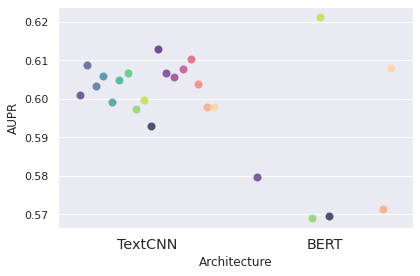

In [4]:
g = sns.stripplot(data=arxf,x="Architecture", y="AUPR", hue="ref",dodge=True,palette=palette, alpha=0.7,size=8)
g.tick_params(axis="x",labelsize="large")
handles, labels = g.get_legend_handles_labels()
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False,fontsize="large")
g.legend_.remove()
plt.tight_layout()
plt.savefig(dataset+"_AUPR_BERT.png")
plt.show()

In [12]:
# lm = sns.lmplot(data=arxf[["Architecture","AUROC","ref"]],x="Architecture", y="AUROC", hue="ref",        
#                 markers=markers,palette=palette, scatter=True,legend=False,scatter_kws={"s": 150, "alpha":0.7})
print(arxf[["Architecture","Acc_IID"
      ,"AUROC","epistemics_R","ref"]].to_latex())

\begin{tabular}{llrrrl}
\toprule
{} & Architecture &   Acc\_IID &     AUROC &  epistemics\_R &                                           ref \\
\midrule
0  &      TextCNN &  0.436145 &  0.639103 &      0.000000 &                                 Unregularized \\
1  &      TextCNN &  0.426007 &  0.656362 &      0.000000 &                                   Regularized \\
2  &      TextCNN &  0.426071 &  0.644557 &      0.069705 &                                    MC Dropout \\
3  &      TextCNN &  0.424477 &  0.650957 &      0.000000 &                               Heteroscedastic \\
4  &      TextCNN &  0.429004 &  0.634338 &      0.056707 &                            MC Heteroscedastic \\
5  &      TextCNN &  0.437835 &  0.647039 &      0.000000 &                              Concrete Dropout \\
6  &      TextCNN &  0.438313 &  0.651443 &      0.052752 &                           MC Concrete Dropout \\
7  &      TextCNN &  0.446251 &  0.630638 &      0.000000 &              Heterosceda

In [109]:
dataset = "AAPD"

bertf = pd.read_excel("/mnt/lerna/models/"+dataset+"_BERT_ood.xlsx")

print(bertf)
if dataset == "20news":
    bertf = bertf[~bertf["ref"].isin(["Concrete Dropout","MC Concrete Dropout", "Regularized", "MC Dropout","Heteroscedastic","MC Heteroscedastic"])].reset_index(drop=True)
print(bertf)
cnnf = pd.read_excel("/mnt/lerna/models/"+dataset+"_benchmark_ood.xlsx")
#cnnf = cnnf.groupby(["ref","dataset"]).mean().reset_index()
arxf = pd.concat((cnnf,bertf), axis=0)

if dataset == "Reuters_multilabel":
    dataset = "Reuters"

#print(arxf["arx"])

arxf.replace({"TextClassificationCNN_simple":"TextCNN", "BERT_dense":"BERT", "arx":"Architecture"},inplace=True)
arxf["Architecture"] = arxf["arx"]
arxf["In-Domain Accuracy"] = arxf["Acc_IID"]

#dataset = "Reuters"
#plt.rcParams['figure.figsize'] = [6.4, 4.8]
plt.rcParams['figure.dpi'] = 300
g = sns.barplot(data=arxf,x="Architecture", y="AUROC", hue="ref",dodge=True,palette=palette)
g.legend_.remove()
g.tick_params(axis="x",labelsize="large")
plt.title(dataset)
# handles, labels = g.get_legend_handles_labels()
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False)
plt.tight_layout(pad=0.5)
plt.savefig(dataset+"_AUROC_BERT.png")
plt.show()
g = sns.barplot(data=arxf,x="Architecture", y="epistemics_R", hue="ref",dodge=True,palette=palette)#, alpha=0.7,size=8)
g.legend_.remove()
g.tick_params(axis="x",labelsize="large")
plt.title(dataset)
# handles, labels = g.get_legend_handles_labels()
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False)
plt.tight_layout(pad=0.5)
plt.savefig(dataset+"_epistemics_BERT.png")
plt.show()
g = sns.barplot(data=arxf,x="Architecture", y="In-Domain Accuracy", hue="ref",dodge=True,palette=palette)#, alpha=0.7,size=8)
g.legend_.remove()
g.tick_params(axis="x",labelsize="large")
plt.title(dataset)
# handles, labels = g.get_legend_handles_labels()
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False)
plt.tight_layout(pad=0.5)
plt.savefig(dataset+"_AccIID_BERT.png")
plt.show()

g = sns.barplot(data=arxf,x="Architecture", y="AUPR", hue="ref",dodge=True,palette=palette)
g.legend_.remove()
g.tick_params(axis="x",labelsize="large")
plt.title(dataset)
# handles, labels = g.get_legend_handles_labels()
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False)
plt.tight_layout(pad=0.5)
plt.savefig(dataset+"_AUPR_BERT.png")
plt.show()

g = sns.barplot(data=arxf,x="Architecture", y="entropy_R", hue="ref",dodge=True,palette=palette)
#g.legend_.remove()
g.tick_params(axis="x",labelsize="large")
plt.title(dataset)
handles, labels = g.get_legend_handles_labels()
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False)
plt.tight_layout(pad=0.5)
plt.savefig(dataset+"_entropy_R_BERT.png")
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '/mnt/lerna/models/AAPD_BERT_ood.xlsx'

# Ablation: ensemble size $M$


In [110]:
ood_ensembles = ["/mnt/lerna/models/20news_aleatorics_M5_concrete_ood","/mnt/lerna/models/20news_aleatorics_M5_ood","/mnt/lerna/models/20news_baseline_M5_concrete_ood","/mnt/lerna/models/20news_baseline_M5_ood","/mnt/lerna/models/20news_nodropout_M5_ood","/mnt/lerna/models/CLINC150_aleatorics_M5_concrete_ood","/mnt/lerna/models/CLINC150_aleatorics_M5_ood","/mnt/lerna/models/CLINC150_baseline_M5_concrete_ood","/mnt/lerna/models/CLINC150_baseline_M5_ood","/mnt/lerna/models/CLINC150_nodropout_M5_ood","/mnt/lerna/models/imdb_aleatorics_M5_concrete_ood","/mnt/lerna/models/imdb_aleatorics_M5_ood","/mnt/lerna/models/imdb_baseline_M5_concrete_ood","/mnt/lerna/models/imdb_baseline_M5_ood","/mnt/lerna/models/imdb_nodropout_M5_ood","/mnt/lerna/models/Reuters_multilabel_aleatorics_M5_concrete_ood","/mnt/lerna/models/Reuters_multilabel_aleatorics_M5_ood","/mnt/lerna/models/Reuters_multilabel_baseline_M5_concrete_ood","/mnt/lerna/models/Reuters_multilabel_baseline_M5_ood","/mnt/lerna/models/Reuters_multilabel_nodropout_M5_ood","/mnt/lerna/models/AAPD_aleatorics_M5_concrete_ood","/mnt/lerna/models/AAPD_aleatorics_M5_ood","/mnt/lerna/models/AAPD_baseline_M5_concrete_ood","/mnt/lerna/models/AAPD_baseline_M5_ood","/mnt/lerna/models/AAPD_nodropout_M5_ood"]

abls = []
for ens in ood_ensembles:
    abl = pd.read_excel(ens+"/"+'ensemble_ablation.xlsx')
    abls.append(abl)
    
ab = pd.concat(tuple(abls), axis=0)
order = {"20news":0, "imdb":1, "CLINC150":2, "Reuters_multilabel":3, "AAPD":4}
ab["order"] = ab["dataset"].apply(lambda x: order[x])
ab["methodref"] = ab["ref"].apply(lambda x: refs.index(x))
ab = ab.sort_values(by=["order", "methodref"],ascending=True)

ab.replace({"nonbayesian":"single"},inplace=True)

/home/jordy/.virtualenvs/arkham/lib/python3.6/site-packages/ipykernel_launcher.py:15: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  from ipykernel import kernelapp as app


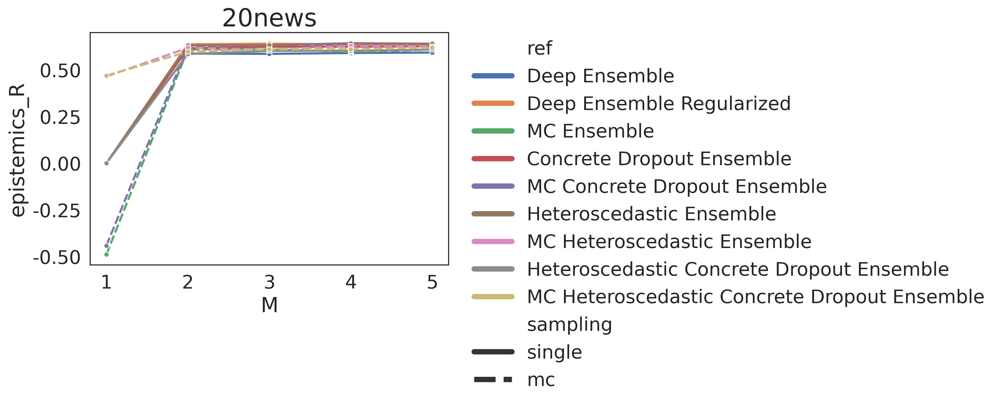

In [124]:
new_markers = markers[9:]*5
new_palette = palette[9:]*5
plt.rcParams['axes.unicode_minus'] = False
plt.rcParams['figure.dpi'] = 300

for measure in ["epistemics_R", "entropy_R", "mutual_information_R", "AUROC"]:
    for i, dataset in enumerate("20news|imdb|CLINC150|Reuters_multilabel|AAPD".split("|")):
        mini_df = ab[ab["dataset"] == dataset]
        lm = sns.lineplot(data=mini_df, x="M", y=measure, hue="ref",style="sampling", marker="o", legend="full",linewidth=2)#s=new_markers, palette=new_palette)
        plt.title(dataset, fontsize="large")
        plt.xticks([1,2,3,4,5])
        leg = plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False,markerscale=2)
        for legobj in leg.legendHandles:
            legobj.set_linewidth(5.0)
        plt.tight_layout(pad=0.5)
        plt.savefig("/home/jordy/Downloads/novel-domain_"+measure+"_"+dataset+".png")
        plt.show()
        break
    break


# Ablation: Concrete Dropout

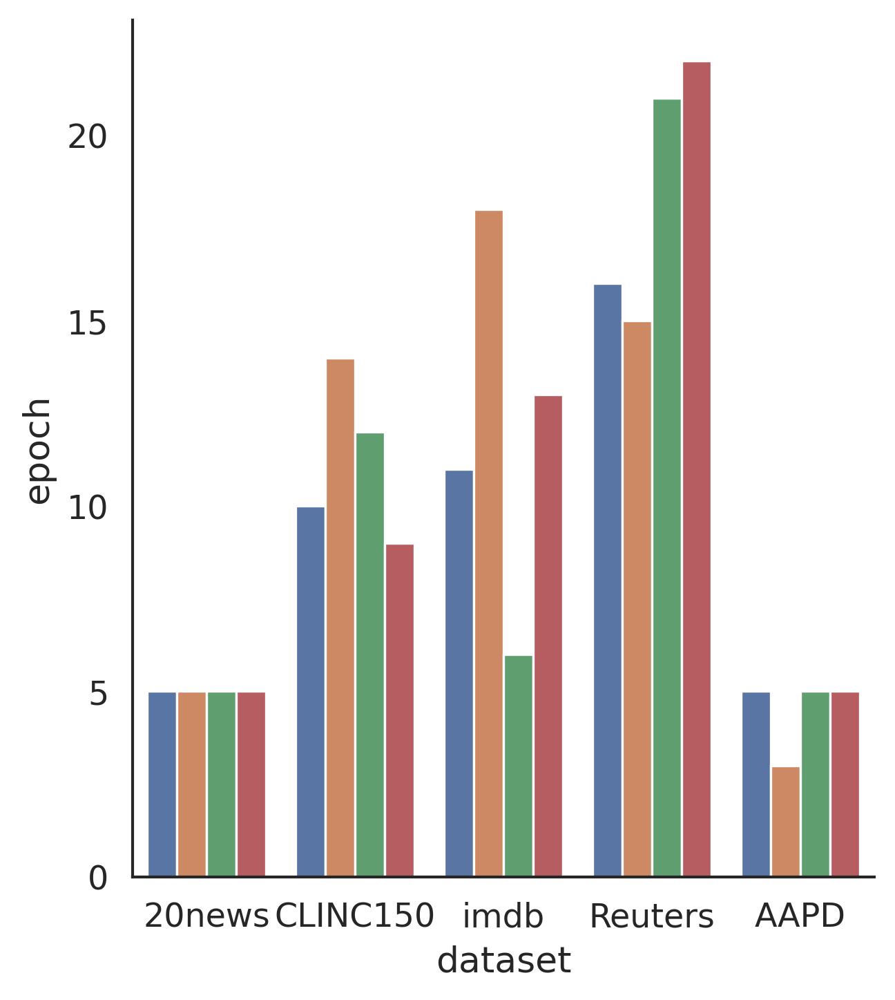

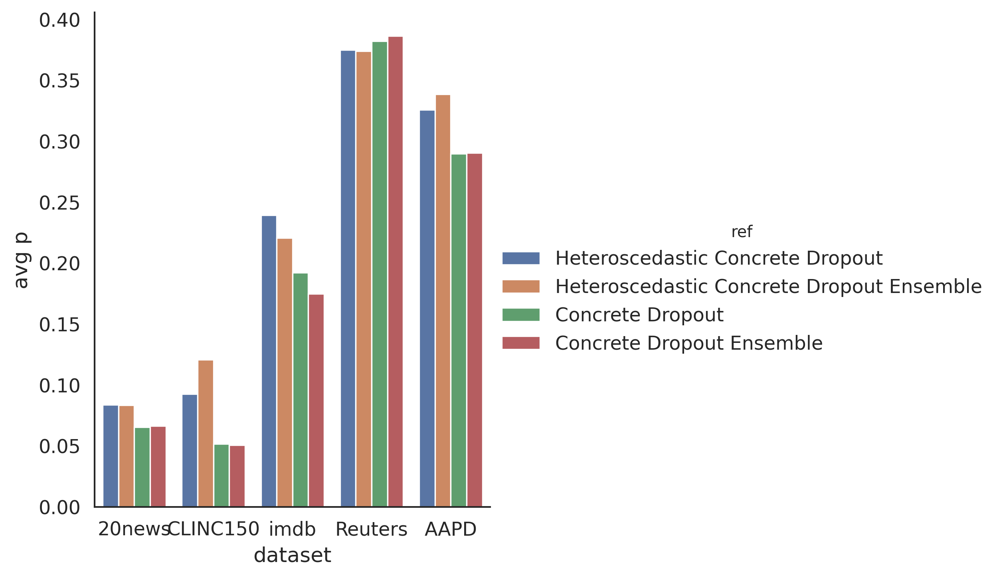

In [8]:
data = pd.read_excel("/mnt/lerna/models/concretedrop.xlsx")
data.head()
data.fillna(0,inplace=True)

plt.rcParams['figure.dpi'] = 300
#sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set_context("paper", rc={'figure.figsize':(11.7,8.27)}, font_scale=1.3)
#plt.rcParams['figure.figsize'] = [80, 60]

#plt.rcParams['figure.figsize'] = [8, 6]
g = sns.catplot(x="dataset", y="epoch", hue="ref", data=data,kind="bar")
g._legend.remove()
#plt.tight_layout(pad=0.5)

#g.add_legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False,fontsize="large")
#g.ax.tick_params(axis='x', labelrotation=90)
data["avg p"] = data["avg"]
g = sns.catplot(x="dataset", y="avg p", hue="ref", data=data,kind="bar")
#g._legend.remove()

#g.add_legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False)
#plt.tight_layout(pad=0.5)
#plt.legend([],[], frameon=False)
# g.add_legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False)
# g.ax.tick_params(axis='x', labelrotation=90)


In [42]:
data

,model,K1,K2,K3,µ,sigma,avg,ref,dataset,epoch,avg p
0,20news_aleatorics_concrete,0.058342,0.059115,0.054758,0.088746,0.156952,0.083583,Heteroscedastic Concrete Dropout,20news,5,0.083583
1,20news_aleatorics_M5_concrete,0.060757,0.057718,0.055002,0.082986,0.160552,0.083403,Heteroscedastic Concrete Dropout Ensemble,20news,5,0.083403
2,20news_baseline_concrete,0.058609,0.058499,0.056612,0.088398,0.000000,0.065530,Concrete Dropout,20news,5,0.065530
3,20news_baseline_M5_concrete,0.062470,0.058576,0.056811,0.087336,0.000000,0.066298,Concrete Dropout Ensemble,20news,5,0.066298
4,CLINC150_aleatorics_concrete,0.045128,0.044994,0.044162,0.066767,0.262012,0.092613,Heteroscedastic Concrete Dropout,CLINC150,10,0.092613
5,CLINC150_aleatorics_M5_concrete,0.047088,0.047280,0.046225,0.068967,0.394950,0.120902,Heteroscedastic Concrete Dropout Ensemble,CLINC150,14,0.120902
6,CLINC150_baseline_concrete,0.047881,0.046562,0.044045,0.067860,0.000000,0.051587,Concrete Dropout,CLINC150,12,0.051587
7,CLINC150_baseline_M5_concrete,0.045825,0.044140,0.045637,0.067662,0.000000,0.050816,Concrete Dropout Ensemble,CLINC150,9,0.050816
8,imdb_aleatorics_concrete,0.227756,0.218833,0.184871,0.080286,0.485418,0.239433,Heteroscedastic Concrete Dropout,imdb,11,0.239433
9,imdb_aleatorics_M5_concrete,0.215049,0.194566,0.157614,0.079599,0.456340,0.220634,Heteroscedastic Concrete Dropout Ensemble,imdb,18,0.220634


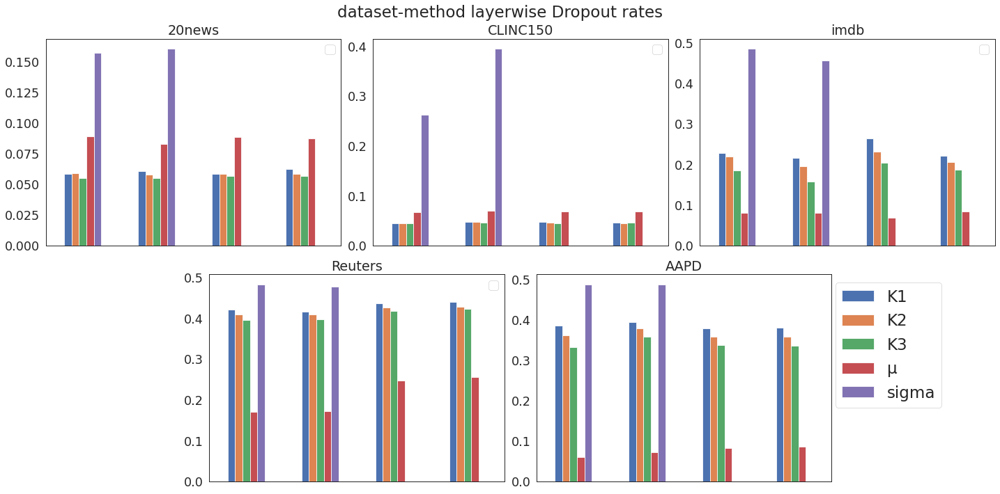

In [41]:
#fig = plt.figure(figsize=(10,5))
fig = plt.figure(figsize=(20,10))

#sns.set_context("")
#fig, ax = plt.subplots(3,2, figsize=(20, 10))
ax1 = plt.subplot2grid(shape=(2,6), loc=(0,0), colspan=2)
ax2 = plt.subplot2grid((2,6), (0,2), colspan=2)
ax3 = plt.subplot2grid((2,6), (0,4), colspan=2)
ax4 = plt.subplot2grid((2,6), (1,1), colspan=2)
ax5 = plt.subplot2grid((2,6), (1,3), colspan=2)

#Understanding the difference between regplot() and lmplot() can be a bit tricky. In fact, they are closely related, as lmplot() uses regplot() internally and takes most of its parameters. However, regplot() is an axes-level function, so it draws directly onto an axes (either the currently active axes or the one provided by the ax parameter), while lmplot() is a figure-level function and creates its own figure, which is managed through a FacetGrid.
# https://stackoverflow.com/questions/16748577/matplotlib-combine-different-figures-and-put-them-in-a-single-subplot-sharing-a 

fig.suptitle('dataset-method layerwise Dropout rates')
for i, dataset in enumerate(["20news","CLINC150","imdb", "Reuters", "AAPD"]):
        ax = ax1 if i == 0 else ax2 if i == 1 else ax3 if i == 2 else ax4 if i == 3 else ax5
        ax.title.set_text(str(dataset))
        #ax.set_ylim(0, 1)
        mini_df = data[data["dataset"] == dataset]
        g = mini_df.plot(y=["K1","K2","K3","µ", "sigma"],ax=ax,kind="bar") #, data=data,legend_out=False,kind="bar")
        g.set_xticklabels([])
        plt.tight_layout(pad=0.5)

        if i == 4:
            pass
            ax.legend(bbox_to_anchor=(1.4, 1.), loc='upper right', fontsize="large")
            #g.add_legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False)
        else:
            ax.legend([])
#         g = sns.scatterplot(data=mini_df[['NLL','Brier','ref']],x="Brier", y="NLL", hue="ref", markers=markers,palette=palette, ax=ax,legend=False)


# g = sns.catplot(x=, y=["K1","K2","K3","µ", "sigma"], hue="ref", data=data,legend_out=True,kind="bar")


### Question 1: 

In [ ]:
measure = 'Acc'
ref_dict = {"Unregularized":0,
"Regularized":1,
"MC Dropout":1,
"Heteroscedastic":1,
"MC Heteroscedastic":2,
"Concrete Dropout":1,
"MC Concrete Dropout":2,
"Heteroscedastic Concrete Dropout":2,
"MC Heteroscedastic Concrete Dropout":3, #ensemble is +5?
"Deep Ensemble":1,
"Deep Ensemble Regularized":2,
"MC Ensemble":2,
"Concrete Dropout Ensemble":2,
"MC Concrete Dropout Ensemble":3,
"Heteroscedastic Ensemble":2,
"MC Heteroscedastic Ensemble":3,
"Heteroscedastic Concrete Dropout Ensemble":3,
"MC Heteroscedastic Concrete Dropout Ensemble":4
}
# for k,v in ref_dict.items():
#     if "Ensemble" in k:
#         ref_dict[k] += 5
    
df["combo"] = df["ref"].apply(lambda x: ref_dict[x])
from scipy.stats import pointbiserialr, pearsonr
correlation, p = pointbiserialr(df[measure], df["combo"])
print(f"combo {correlation} {p}")

### Question 2: 

In [ ]:
"""
y = 'NLL(↓)'#'Acc'
x = "ref"

ds = []
for d in "CLINC150|20news|imdb|Reuters_multilabel|AAPD".split("|"): 
    df = pd.read_excel(ROOT+d+"_benchmark_M.xlsx")
    df.replace(str(np.NaN),np.NaN, inplace=True)
    df.replace(np.NaN,"", inplace=True)
    ds.append(df)
    
df = pd.concat(tuple(ds), axis=0)

print(df.groupby("ref").aggregate("mean"))
markers = ["o"]*2 + ["D"] + ["X"]*2 + ["v"]*2 + ["^"]*2 + ["*", ".", "D", "X", "X", "v", "v", "^", "^"] 
palette = sns.color_palette("viridis", 9) + sns.color_palette("magma", 9)

#.sort_values(by=[y, x],ascending=True)
g = sns.catplot(x=x, y=y, hue="ref", data=df,legend_out=False,kind="point")
g.add_legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False)
g.ax.tick_params(axis='x', labelrotation=90)
"""

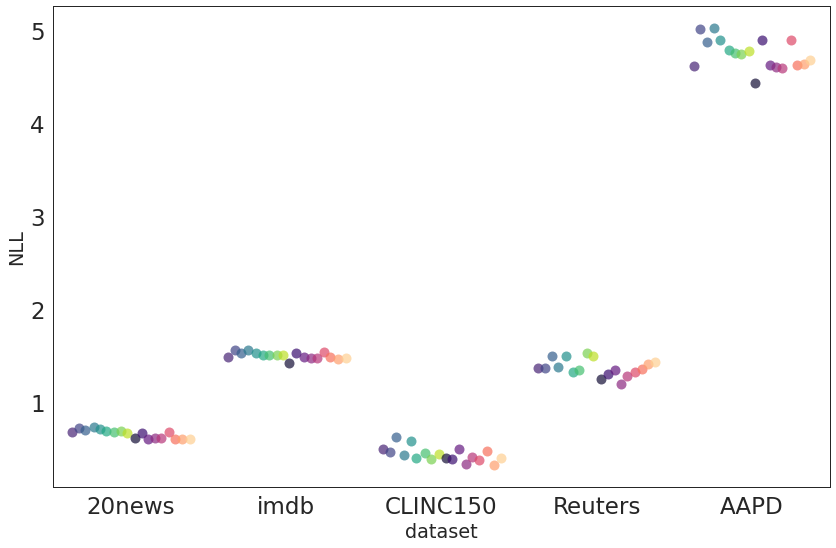

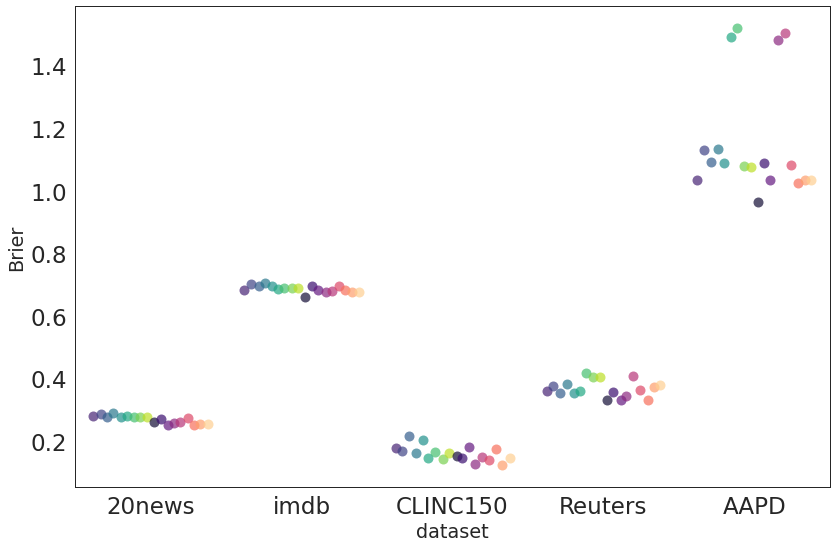

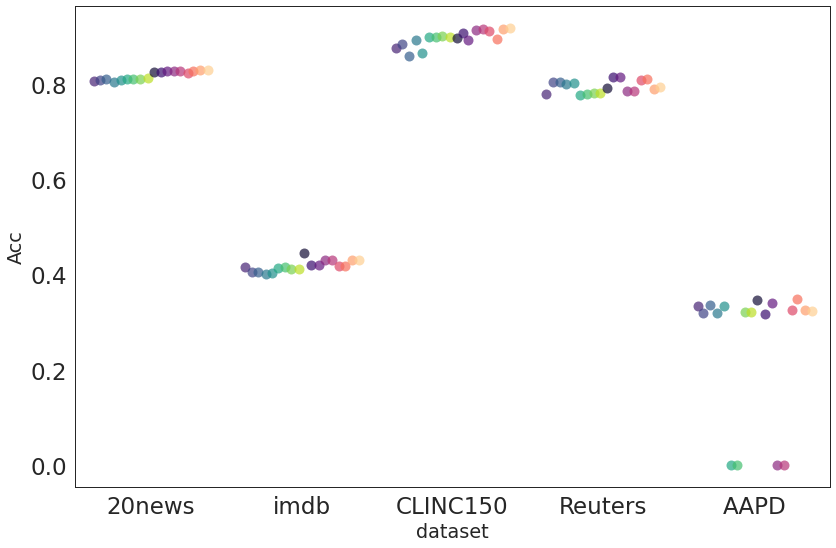

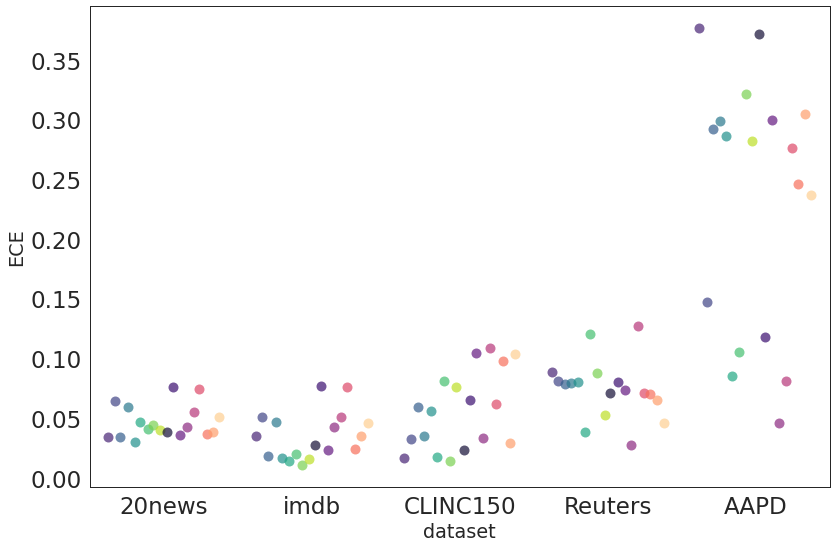

In [363]:
df.replace({"Reuters_multilabel":"Reuters"},inplace=True)
plt.rcParams['figure.figsize'] = [12, 8]
for measure in ["NLL", "Brier","Acc","ECE"]:
    g = sns.stripplot(x="dataset", y=measure, data=df, hue="ref", dodge=True, palette=palette, alpha=0.7,size=10) #,markers=markers)#, palette=palette)
    g.legend_.remove()
    g.tick_params(axis="x",labelsize="large")
    g.tick_params(axis="y",labelsize="large")
    #     handles, labels = g.get_legend_handles_labels()
#     plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False,fontsize="large")
    plt.tight_layout()
    plt.savefig("/home/jordy/Downloads/in-domain"+measure+"_datasets.png")
    plt.show()
    


#sns.despine()

In [ ]:
for i, dataset in enumerate(df["dataset"].unique()):
    mini_df= df[df["dataset"] == dataset]
    sns.lmplot(data=mini_df[['NLL','Brier','ref']],x="Brier", y="NLL", hue="ref", markers=markers,palette=palette, legend=True,scatter_kws={"s": 150, "alpha":0.7})
    #plt.savefig("/home/jordy/Downloads/in-domainBS-NLL_"+dataset+".png")
plt.gca().set_axis_off()

In [ ]:
plt.figure(figsize=(20,10))
#fig, ax = plt.subplots(3,2, figsize=(20, 10))
ax1 = plt.subplot2grid(shape=(2,6), loc=(0,0), colspan=2)
ax2 = plt.subplot2grid((2,6), (0,2), colspan=2)
ax3 = plt.subplot2grid((2,6), (0,4), colspan=2)
ax4 = plt.subplot2grid((2,6), (1,1), colspan=2)
ax5 = plt.subplot2grid((2,6), (1,3), colspan=2)

#Understanding the difference between regplot() and lmplot() can be a bit tricky. In fact, they are closely related, as lmplot() uses regplot() internally and takes most of its parameters. However, regplot() is an axes-level function, so it draws directly onto an axes (either the currently active axes or the one provided by the ax parameter), while lmplot() is a figure-level function and creates its own figure, which is managed through a FacetGrid.
# https://stackoverflow.com/questions/16748577/matplotlib-combine-different-figures-and-put-them-in-a-single-subplot-sharing-a 

fig.suptitle('dataset specific results')
for i, dataset in enumerate(df["dataset"].unique()):
        ax = ax1 if i == 1 else ax2 if i == 2 else ax3 if i == 3 else ax4 if i == 4 else ax5
        ax.title.set_text(str(dataset))
        #ax.set_ylim(0, 1)
        mini_df= df[df["dataset"] == dataset]
        g = sns.scatterplot(data=mini_df[['NLL','Brier','ref']],x="Brier", y="NLL", hue="ref", markers=markers,palette=palette, ax=ax,legend=False)

# Wins-draw-losses (vs. baseline nodrop)

In [ ]:
#compare against 1 OR pairwise comparison?
from collections import Counter
wins = []
draws = []
losses = []
baseline = "Unregularized"
metric = 'NLL(↓)'

#singular?

# print(df[df["dataset"] == "Reuters_multilabel"]["version"])
for dataset in df["dataset"].unique():
    vs = df[(df["dataset"] == dataset) & (df["ref"] == baseline)][metric]
    vs = vs.item()
    for ref in df["ref"].unique():
        condition = (df["dataset"] == dataset) & (df["ref"] == ref)
        v = df[condition][metric]
        if len(v) == 1:
            v = v.item()
        else:
            print(vs, ref, dataset)
            continue
        if v < vs: 
            wins.append(ref)
        elif v == vs:
            draws.append(ref)
        else:
            losses.append(ref)  
print(Counter(wins))
print(Counter(draws))
print(Counter(losses))

In [ ]:
for dataset in df["dataset"].unique():
    print(len(df[df["dataset"] == dataset]["ref"]))

In [ ]:
# could also for 1 ref collect all metric over datasets
# then compare against other refs? -> simple rank? 
#compare against 1 OR pairwise comparison?
from collections import Counter
wins = []
draws = []
losses = []
baseline = "Unregularized"

refs = ["Unregularized",
"Regularized",
"MC Dropout",
"Heteroscedastic",
"MC Heteroscedastic",
"Concrete Dropout",
"MC Concrete Dropout",
"Heteroscedastic Concrete Dropout",
"MC Heteroscedastic Concrete Dropout",
"Deep Ensemble",
"Deep Ensemble Regularized",
"MC Ensemble",
"Concrete Dropout Ensemble",
"MC Concrete Dropout Ensemble",
"Heteroscedastic Ensemble",
"MC Heteroscedastic Ensemble",
"Heteroscedastic Concrete Dropout Ensemble",
"MC Heteroscedastic Concrete Dropout Ensemble"]

#print(df[df["dataset"] == "Reuters_multilabel"]["ref"])
for metric in ['NLL','Brier', 'ECE']:
    for dataset in df["dataset"].unique():
        vs = df[(df["dataset"] == dataset) & (df["ref"] == baseline)][metric]
        vs = vs.item()
        for ref in df["ref"].unique():
            condition = (df["dataset"] == dataset) & (df["ref"] == ref)
            v = df[condition][metric]
            if len(v) == 1:
                v = v.item()
            else:
                print(vs, ref, dataset)
                continue
            if v < vs: 
                wins.append(ref)
            elif v == vs:
                draws.append(ref)
            else:
                losses.append(ref)

cw = Counter(wins)
cd = Counter(draws)
cl = Counter(losses)

new_df = pd.DataFrame(refs, columns=["ref"]) #need to fix imdb
new_df["wins"] = [cw.get(ref, 0) for ref in refs]
new_df["draws"] = [cd.get(ref, 0) for ref in refs]
new_df["losses"] = [cl.get(ref, 0) for ref in refs]
scores = new_df.sort_values(by=["wins", "draws","ref"], ascending=False)
print(scores)

print(scores.to_latex())



In [ ]:
print(" ".join(df["version"].apply(lambda x: re.split("_(nonbayesian|mc)", x)[0]).unique()))

In [ ]:
df["ref"].value_counts()

## Pairwise comparison!

In [ ]:
# could also for 1 ref collect all metric over datasets
# then compare against other refs? -> simple rank? 
#compare against 1 OR pairwise comparison?
from collections import Counter
wins = []
draws = []
losses = []
#baseline = "Unregularized"

refs = ["Unregularized",
"Regularized",
"MC Dropout",
"Heteroscedastic",
"MC Heteroscedastic",
"Concrete Dropout",
"MC Concrete Dropout",
"Heteroscedastic Concrete Dropout",
"MC Heteroscedastic Concrete Dropout",
"Deep Ensemble",
"Deep Ensemble Regularized",
"MC Ensemble",
"Concrete Dropout Ensemble",
"MC Concrete Dropout Ensemble",
"Heteroscedastic Ensemble",
"MC Heteroscedastic Ensemble",
"Heteroscedastic Concrete Dropout Ensemble",
"MC Heteroscedastic Concrete Dropout Ensemble"]

#print(df[df["dataset"] == "Reuters_multilabel"]["ref"])
for metric in ["Acc"]: #, 'ECE(↓)'
    for dataset in df["dataset"].unique():
        for baseline in df["ref"].unique():
            vs = df[(df["dataset"] == dataset) & (df["ref"] == baseline)][metric]
            vs = vs.item()
            vs = np.round(vs,3)
            for ref in df["ref"].unique():
                if ref == baseline:
                    continue
                condition = (df["dataset"] == dataset) & (df["ref"] == ref)
                v = df[condition][metric]
                
                if len(v) == 1:
                    v = v.item()
                    v = np.round(v,3)
                else:
                    print(vs, ref, dataset)
                    continue
                if v > vs: 
                    wins.append(ref)
                elif v == vs:
                    draws.append(ref)
                else:
                    losses.append(ref)

cw = Counter(wins)
cd = Counter(draws)
cl = Counter(losses)
#wrongly
new_df = pd.DataFrame(refs, columns=["ref"]) #need to fix imdb
new_df["wins"] = [cw.get(ref, 0) for ref in refs]
new_df["draws"] = [cd.get(ref, 0) for ref in refs]
new_df["losses"] = [cl.get(ref, 0) for ref in refs]
scores = new_df.sort_values(by=["wins", "draws","ref"], ascending=False)
#print(scores)
#woef

print("\n".join([
"\\begin{table}[h]",
"\\resizebox{1\columnwidth}{!}{",
    scores.to_latex(),
    "}\caption{}",
    "\end{table}"
]))


In [ ]:
#print(" ".join(df["version"].apply(lambda x: re.split("_(nonbayesian|mc)", x)[0]).unique()))

# Statistical critical difference IID

In [ ]:
from pycalib.stats import compute_friedmanchisquare
from scipy.stats import rankdata
measure = ['NLL']
#condition = df["dataset"].isin(["20news", "CLINC150", "imdb"]) #df["dataset"].isin(["Reuters_multilabel", "AAPD"])
#[~condition]
table = df.pivot_table(index=['dataset'], columns=["ref"], values=measure, aggfunc=np.mean)
#table *= -1
ranking_table = table.apply(rankdata, axis=1).mean()
# print(ranking_table)

# print(table)

ftest = compute_friedmanchisquare(table)
print(ftest)

from pycalib.stats import plot_critical_difference

#plt.rcParams["figure.figsize"] = (50,100)
_ = plot_critical_difference(avranks=ranking_table,
                           num_datasets=table.shape[0],
                           names=table.columns.levels[1],
                           title='{}            (p-value = {:.2e})'.format(measure[0], 
                                                                        ftest.pvalue))
#maybe repeated measures by not np.mean? 
#plot by average rank? #, #D = {}; , table.shape[0]

In [ ]:
import Orange

#test='bonferroni-dunn'
test = 'nemenyi'
print(table.shape[0])

#ranking is computed with scipy

cd = Orange.evaluation.compute_CD(ranking_table, 5, alpha='0.05',
                                  test=test)
print(cd)
Orange.evaluation.graph_ranks(ranking_table, table.columns.levels[1], cd=cd, width=6,
                              textspace=1.5)
fig = plt.gcf()
fig.suptitle("title", horizontalalignment='left')

def compute_CD(avranks, n, alpha="0.05", test="nemenyi"):
    """
    Returns critical difference for Nemenyi or Bonferroni-Dunn test
    according to given alpha (either alpha="0.05" or alpha="0.1") for average
    ranks and number of tested datasets N. Test can be either "nemenyi" for
    for Nemenyi two tailed test or "bonferroni-dunn" for Bonferroni-Dunn test.
    """
    k = len(avranks)
    d = {("nemenyi", "0.05"): [0, 0, 1.959964, 2.343701, 2.569032, 2.727774,
                               2.849705, 2.94832, 3.030879, 3.101730, 3.163684,
                               3.218654, 3.268004, 3.312739, 3.353618, 3.39123,
                               3.426041, 3.458425, 3.488685, 3.517073,
                               3.543799],
         ("nemenyi", "0.1"): [0, 0, 1.644854, 2.052293, 2.291341, 2.459516,
                              2.588521, 2.692732, 2.779884, 2.854606, 2.919889,
                              2.977768, 3.029694, 3.076733, 3.119693, 3.159199,
                              3.195743, 3.229723, 3.261461, 3.291224, 3.319233],
         ("bonferroni-dunn", "0.05"): [0, 0, 1.960, 2.241, 2.394, 2.498, 2.576,
                                       2.638, 2.690, 2.724, 2.773],
         ("bonferroni-dunn", "0.1"): [0, 0, 1.645, 1.960, 2.128, 2.241, 2.326,
                                      2.394, 2.450, 2.498, 2.539]}
    q = d[(test, alpha)]
    cd = q[k] * (k * (k + 1) / (6.0 * n)) ** 0.5
    return cd

# _ = plot_critical_difference(avranks=ranking_table,
#                            num_datasets=table.shape[0],
#                            names=table.columns.levels[1], 

In [ ]:
import scipy.stats as ss
import scikit_posthocs as sp
import statsmodels.api as sa
d = table.T.values
print(table.shape)
print(table.shape[0])
# ss.friedmanchisquare(*table.values) 
pc = sp.posthoc_nemenyi_friedman(df.pivot_table(index=['dataset'], columns=["ref"], values="NLL", aggfunc=np.mean).values)

#pc = sp.posthoc_quade(df, y_col='NLL', block_col='dataset', group_col='ref', melted=True)  #p-values from pairwise comparison
heatmap_args = {'linewidths': 0.25, 'linecolor': '0.5', 'clip_on': False, 'square': True, 'cbar_ax_bbox': [0.80, 0.35, 0.04, 0.3]}
sp.sign_plot(pc, **heatmap_args)


#2d 
# table.T.shape
# table.T
#sp.posthoc_nemenyi_friedman(data)


In [ ]:
import operator
from scipy.stats import friedmanchisquare
from scipy.stats import wilcoxon

from pycalib.visualisations.wilcoxon_holm import wilcoxon_holm, graph_ranks,draw_cd_diagram

draw_cd_diagram(df,algorithms="ref", datasets="dataset", metric="NLL", ascending=False, title=None, labels=False)

In [ ]:
from pycalib.stats import compute_friedmanchisquare, ranksums
from scipy.stats import rankdata
# for measure in ["Brier", "NLL"]
measure = 'Brier(↓)'
df = pd.read_excel(ROOT+"20news_benchmark_M.xlsx")
#print(df.groupby("ref").aggregate("mean"))
df.replace(str(np.NaN),np.NaN, inplace=True)
df.replace(np.NaN,"", inplace=True)
table = df.pivot_table(index=['dataset'],
                           columns=["ref"],#["base","concrete_dropout", "ensemble"],
                           values=[measure],
                           aggfunc=np.mean)
ranking_table = table.apply(rankdata, axis=1).mean()
print(ranking_table)
print(table)
ftest = compute_friedmanchisquare(table)
print(ftest)
from pycalib.stats import plot_critical_difference

#plt.rcParams["figure.figsize"] = (50,100)
_ = plot_critical_difference(avranks=ranking_table,
                           num_datasets=table.shape[0],
                           names=table.columns.levels[1],
                           title='{} (p-value = {:.2e}, #D = {})'.format("iid", 
                                                                        ftest.pvalue, table.shape[0]))

In [ ]:
df = pd.read_excel(ROOT+"20news_benchmark_M.xlsx")
#print(df.groupby("ref").aggregate("mean"))

In [ ]:
df.groupby("ref").aggregate("std").sort_values(by=["Brier(↓)"])

In [ ]:
measure = 'NLL(↓)'
table = df.pivot_table(index=['dataset'],
                           columns=['ref'],
                           values=[measure],
                           aggfunc=np.mean)
table
#table = table[~table.isna().any(axis=1)]
#if max_is_better:
#    table *= -1

In [ ]:
#We first compute the average rank of every method
from scipy.stats import rankdata
ranking_table = table.apply(rankdata, axis=1).mean()
print(ranking_table)

In [ ]:
from pycalib.stats import compute_friedmanchisquare

ftest = compute_friedmanchisquare(table)
print(ftest) #barely significant

In [ ]:
"""
The average rankings are then compared with a One-tailed Bonferroni-Dunn test. 
However, if the number of compared methods is larger than 10, the Nemenyi test is used instead.
"""
from pycalib.stats import plot_critical_difference

#plt.rcParams["figure.figsize"] = (50,100)
_ = plot_critical_difference(avranks=ranking_table,
                           num_datasets=table.shape[0],
                           names=table.columns.levels[1],
                           title='{} (p-value = {:.2e}, #D = {})'.format("TextCNN", 
                                                                        ftest.pvalue, table.shape[0])) #5datasets

# OOD 

In [30]:
ROOT = "/mnt/lerna/models/"

ds = []
for d in "CLINC150|20news|Reuters_multilabel|imdb|AAPD".split("|"): #imdb|
    f = pd.read_excel(ROOT+d+"_benchmark_M_ood.xlsx")
    f = f.groupby(["ref","dataset"]).mean().reset_index()
    f.replace(str(np.NaN),np.NaN, inplace=True)
    f.replace(np.NaN,"", inplace=True)
    ds.append(f)
    
oodf = pd.concat(tuple(ds), axis=0)
print(oodf)

oodf["order"] = oodf["dataset"].apply(lambda x: order[x])
oodf["methodref"] = oodf["ref"].apply(lambda x: refs.index(x))
oodf = oodf.sort_values(by=["order", "methodref"],ascending=True)


                                             ref   dataset      AUPR  \
0                               Concrete Dropout  CLINC150  0.677250   
1                      Concrete Dropout Ensemble  CLINC150  0.678287   
2                                  Deep Ensemble  CLINC150  0.678974   
3                      Deep Ensemble Regularized  CLINC150  0.679520   
4                                Heteroscedastic  CLINC150  0.677457   
..                                           ...       ...       ...   
13           MC Heteroscedastic Concrete Dropout      AAPD  0.573485   
14  MC Heteroscedastic Concrete Dropout Ensemble      AAPD  0.579824   
15                   MC Heteroscedastic Ensemble      AAPD  0.588743   
16                                   Regularized      AAPD  0.575604   
17                                 Unregularized      AAPD  0.584584   

       AUROC   Acc_IID  confidence_R  aleatorics_R  epistemics_R  entropy_R  \
0   0.899807  0.874917      0.612362      0.000000      

        abs   metric  rank   dataset                    version
0  0.627140  entropy  58.0  CLINC150           Concrete Dropout
1  0.612362  softmax  48.0  CLINC150           Concrete Dropout
2  0.644936  entropy  65.0  CLINC150  Concrete Dropout Ensemble
3  0.636946  softmax  64.0  CLINC150  Concrete Dropout Ensemble
4  0.636063       MU  61.0  CLINC150  Concrete Dropout Ensemble

        abs   metric  rank dataset                    version
0  0.593220  entropy  43.0  20news           Concrete Dropout
1  0.565212  softmax  30.0  20news           Concrete Dropout
2  0.620787  entropy  58.0  20news  Concrete Dropout Ensemble
3  0.599190  softmax  47.0  20news  Concrete Dropout Ensemble
4  0.625765       MU  65.0  20news  Concrete Dropout Ensemble

        abs   metric  rank             dataset                    version
0  0.514953  entropy  62.0  Reuters_multilabel           Concrete Dropout
1  0.432393  softmax  40.0  Reuters_multilabel           Concrete Dropout
2  0.527879  entropy

'\nCLINC150\nHeteroscedastic Concrete Dropout Ensemble\n/home/jordy/best_CLINC_confidence_aleatoric_mc.png\n\nDeep Ensemble\n/home/jordy/middle_epistemics_nodropout_nonbayesian.png\n\nMC Dropout\n~then decide to do it for the others...\n--------------\n20news\nHeteroscedastic Ensemble\n\nMC Ensemble\n\nDeep Ensemble Regularized\n--------------\nimdb\nHeteroscedastic Ensemble\n\nConcrete Dropout\n\nMC Concrete Dropout\n--------------\nReuters_multilabel\nMC Concrete Dropout Ensemble\n\nConcrete Dropout Ensemble\n\nDeep Ensemble\n--------------\nWAIT\nXXX\n \nAAPD\nDeep Ensemble\n\nHeteroscedastic Ensemble\n\n\n\n'

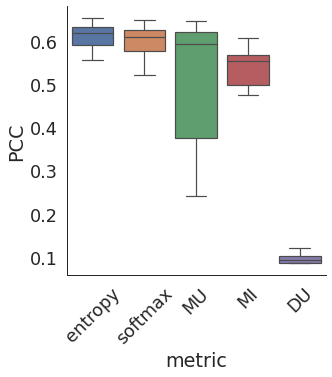

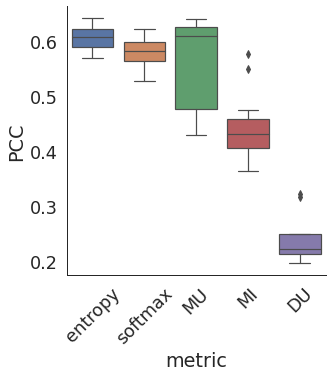

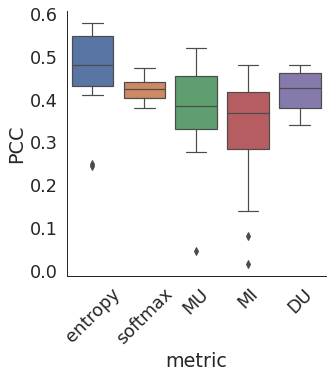

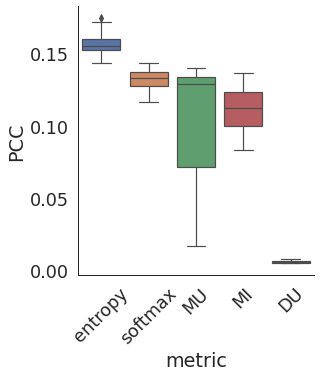

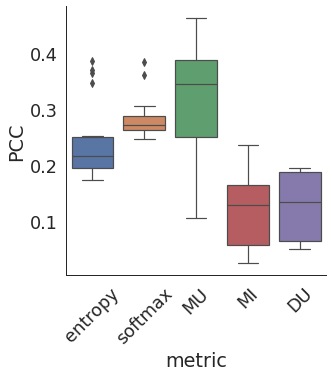

In [10]:
from scipy.stats import rankdata
from collections import OrderedDict

replacer = {"entropy_R":"entropy", "confidence_R": "softmax", "aleatorics_R":"DU", "epistemics_R":"MU", "mutual_information_R":"MI"}

def ranker(df):
    metrics = [x + "_R" for x in ["entropy","confidence", "aleatorics", "epistemics", "mutual_information"]]
    ranks = OrderedDict()
    metricz = []
    version = []
    for i,row in df.iterrows():
        for metric in metrics:
            v = abs(row[metric])
            if not v:
                continue
            ranks[row["ref"] + "_" + metric] = v
            metricz.append(metric)
            version.append(row["ref"])
    
    new = pd.DataFrame(list(ranks.values()),columns=["abs"])
    new["metric"] = [replacer[x] for x in metricz]
    new["rank"] = rankdata(new["abs"])
    new["dataset"] = df["dataset"].unique()[0]
    new["version"] = version
    return new
    

for i,f in enumerate(ds):
    ranked = ranker(f)#.sort_values(by=["abs"],ascending=False)
    #if ranked["dataset"].unique()[0] != "AAPD":
    #    continue
    ranked.to_csv(ranked["dataset"].unique()[0] + "_ranks.csv",index=False)
    print(ranked.head())
    print()
    ranked["PCC"] = ranked["abs"]
    g = sns.catplot(x="metric",y="PCC",data=ranked,kind="box")
    g.ax.tick_params(axis='x', labelrotation=45)
    dataset = ranked["dataset"].unique()[0]
    identifier = f"novel-domain_{dataset}_PCC.png"
    plt.savefig(identifier)
    #catplot kind=boxen

"""
CLINC150
Heteroscedastic Concrete Dropout Ensemble
/home/jordy/best_CLINC_confidence_aleatoric_mc.png

Deep Ensemble
/home/jordy/middle_epistemics_nodropout_nonbayesian.png

MC Dropout
~then decide to do it for the others...
--------------
20news
Heteroscedastic Ensemble

MC Ensemble

Deep Ensemble Regularized
--------------
imdb
Heteroscedastic Ensemble

Concrete Dropout

MC Concrete Dropout
--------------
Reuters_multilabel
MC Concrete Dropout Ensemble

Concrete Dropout Ensemble

Deep Ensemble
--------------
WAIT
XXX
 
AAPD
Deep Ensemble

Heteroscedastic Ensemble



"""
    
    

In [ ]:
for dataset in oodf["dataset"].unique():
    print(len(oodf[oodf["dataset"] == dataset]["ref"]))

### Question 1:

In [ ]:
measure = 'AUPR'
ref_dict = {"Unregularized":0,
"Regularized":1,
"MC Dropout":1,
"Heteroscedastic":1,
"MC Heteroscedastic":2,
"Concrete Dropout":1,
"MC Concrete Dropout":2,
"Heteroscedastic Concrete Dropout":2,
"MC Heteroscedastic Concrete Dropout":3, #ensemble is +5?
"Deep Ensemble":1,
"Deep Ensemble Regularized":2,
"MC Ensemble":2,
"Concrete Dropout Ensemble":2,
"MC Concrete Dropout Ensemble":3,
"Heteroscedastic Ensemble":2,
"MC Heteroscedastic Ensemble":3,
"Heteroscedastic Concrete Dropout Ensemble":3,
"MC Heteroscedastic Concrete Dropout Ensemble":4
}
for k,v in ref_dict.items():
    if "Ensemble" in k:
        ref_dict[k] += 5
    
oodf["combo"] = oodf["ref"].apply(lambda x: ref_dict[x])
from scipy.stats import pointbiserialr, pearsonr
correlation, p = pointbiserialr(oodf[measure], oodf["combo"])
print(f"combo {correlation} {p}")

In [ ]:
# could also for 1 ref collect all metric over datasets
# then compare against other refs? -> simple rank? 
#compare against 1 OR pairwise comparison?
from collections import Counter
wins = []
draws = []
losses = []

#print(oodf[oodf["dataset"] == "Reuters_multilabel"]["ref"])
for metric in ['AUROC','AUPR']: #, 'ECE(↓)'
    for dataset in oodf["dataset"].unique():
        for baseline in oodf["ref"].unique():
            vs = oodf[(oodf["dataset"] == dataset) & (oodf["ref"] == baseline)][metric]
            vs = vs.item()
            vs = np.round(vs,4)
            for ref in oodf["ref"].unique():
                if ref == baseline:
                    continue
                condition = (oodf["dataset"] == dataset) & (oodf["ref"] == ref)
                v = oodf[condition][metric]
                v = np.round(v,4)
                if len(v) == 1:
                    v = v.item()
                else:
                    print(vs, len(v), ref, dataset)
                    continue
                if v > vs: 
                    wins.append(ref)
                elif v == vs:
                    draws.append(ref)
                else:
                    losses.append(ref)

cw = Counter(wins)
cd = Counter(draws)
cl = Counter(losses)

new_oodf = pd.DataFrame(refs, columns=["ref"]) #need to fix imdb
new_oodf["wins"] = [cw.get(ref, 0) for ref in refs]
new_oodf["draws"] = [cd.get(ref, 0) for ref in refs]
new_oodf["losses"] = [cl.get(ref, 0) for ref in refs]
scores = new_oodf.sort_values(by=["wins", "draws","ref"], ascending=False)
print(scores)

print(scores.to_latex())
#sns.pairplot(penguins, hue="species")

# statistical tests

In [ ]:
oodf.columns

[12.2  9.8  9.6  4.2 10.6 14.8 10.2  4.4  8.6  4.8 13.2  7.8 12.2 12.6
  7.6  7.  10.2 11.2]
FriedmanchisquareResult(statistic=28.228070175438575, pvalue=0.04234283547961689)
Forcing Nemenyi Critical difference


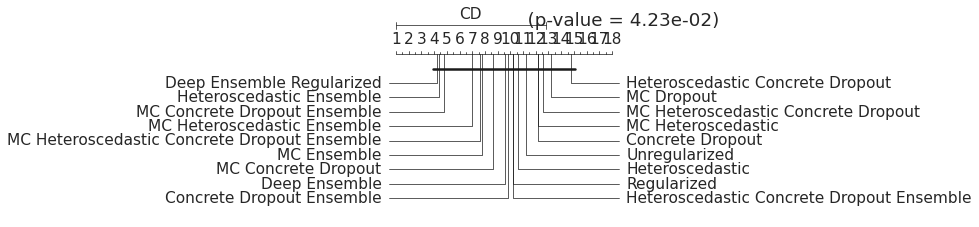

In [29]:
measure = 'AUROC'
sns.set_context("paper",font_scale=1.6)

#oodf = oodf[~oodf["dataset"].isin(["20news", "CLINC150", "imdb"])]
table = oodf.pivot_table(index=['dataset'],
                           columns=['ref'],
                           values=[measure],
                           aggfunc=np.mean)
table
#table = table[~table.isna().any(axis=1)]
#if max_is_better:
table *= -1

#condition = df["dataset"].isin(["20news", "CLINC150", "imdb"])

#We first compute the average rank of every method
from scipy.stats import rankdata
ranking_table = table.apply(rankdata, axis=1).mean()
print(ranking_table)

from pycalib.stats import compute_friedmanchisquare

ftest = compute_friedmanchisquare(table)
print(ftest) #barely significant

"""
The average rankings are then compared with a One-tailed Bonferroni-Dunn test. 
However, if the number of compared methods is larger than 10, the Nemenyi test is used instead.
"""
from pycalib.visualisations import plot_critical_difference

_ = plot_critical_difference(avranks=ranking_table,
                           num_datasets=table.shape[0],
                           names=table.columns.levels[1],
                           title='{}    (p-value = {:.2e})'.format("", 
                                                                        ftest.pvalue)) #5datasets
# not significant -> cannot compare

In [ ]:

def compute_ranksums(table):
    return paired_test(table, stats_func=ranksums)


def compute_mannwhitneyu(table):
    return paired_test(table, stats_func=partial(mannwhitneyu,
                                                 alternative='less'))


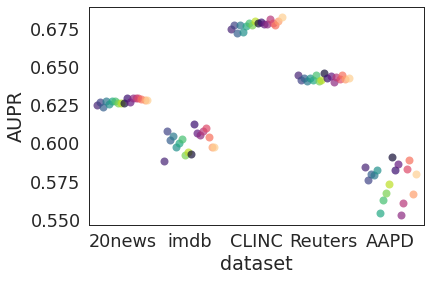

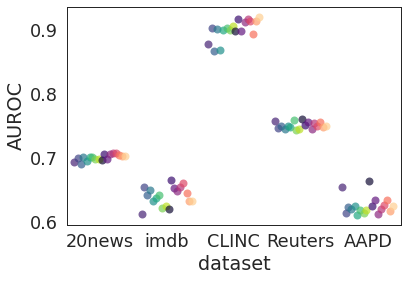

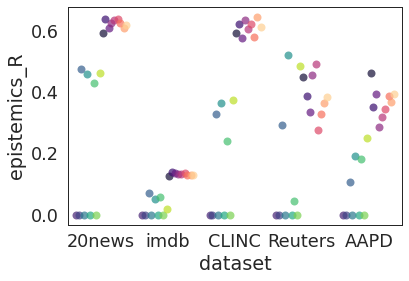

In [51]:
sns.set_context("paper", font_scale=2)
oodf.replace({"Reuters_multilabel": "Reuters", "CLINC150":"CLINC"},inplace=True)
for measure in ["AUPR","AUROC","epistemics_R"]:
    g = sns.stripplot(x="dataset", y=measure, data=oodf, hue="ref", dodge=True, palette=palette, alpha=0.7,size=8) #,markers=markers)#, palette=palette)
    #g.legend_.remove()
    handles, labels = g.get_legend_handles_labels()
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False,markerscale=2.)
    plt.show()
    #plt.tight_layout()
    #plt.savefig("/home/jordy/Downloads/novel-domain_"+measure+"_datasets.png")

In [ ]:
plt.rcParams['figure.figsize'] = [8, 6]
g = sns.stripplot(data=oodf,x="dataset", y="epistemics_R", hue="ref",dodge=True,palette=palette, alpha=0.7,size=8)
#g.legend_.remove()
handles, labels = g.get_legend_handles_labels()
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False)

In [ ]:
for i, dataset in enumerate(oodf["dataset"].unique()):
    print(dataset)
    mini_df= oodf[oodf["dataset"] == dataset]
    sns.lmplot(data=mini_df[['AUPR','AUROC','ref',"epistemics_R"]],x="epistemics_R", y="AUROC", hue="ref", markers=markers,palette=palette, scatter=True,legend=True,scatter_kws={"s": 150, "alpha":0.7})
    #plt.savefig("/home/jordy/Downloads/novel-domainAUPR-AUROC_"+dataset+".png")
    #continue
    #+_ood
    best = {
    "20news":"20news_aleatorics_M5", #aleatorics [non concrete] OR heteroscedastic ensemble
    "imdb":"imdb_baseline_M5", #YET MC  
    "CLINC150":"CLINC150_aleatorics_M5_concrete", #full combination
    "Reuters_multilabel":"Reuters_baseline_M5_concrete", 
    "AAPD":"AAPD_nodropout_M5"
}
    
print(" ".join(best.values()))

In [ ]:
metrics = [x + "_R" for x in ["entropy","confidence", "aleatorics", "epistemics", "mutual_information"]]
for i, dataset in enumerate(oodf["dataset"].unique()):
    mini_df= oodf[oodf["dataset"] == dataset]
    for metric in metrics:
        rankdata = v = abs(row[metric])
    
    
    ranks = OrderedDict()
            ranks[row["ref"] + "_" + metric] = v
    sorting = sorted(list(ranks.values()), reverse=True)

In [ ]:
y = 'AUROC'#'Acc'
x = "ref"

g = sns.catplot(x=x, y=y, hue="ref", data=oodf.sort_values(by=[y],ascending=True),legend_out=False,kind="boxen")
g.add_legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False)
g.ax.tick_params(axis='x', labelrotation=90)


p = sns.color_palette("Paired",18)
from cycler import cycler
ls_cycle = cycler(marker_style=['.','o','v','x',"*", "+"])


markers = ["."]*2 + ["o"] + ["x"]*2 + ["v"]*2 + ["+"]*2 + ["*", ".", "o", "v", "v", "x", "x", "+", "+"] 
palette = sns.color_palette("Paired",9)
#. = normal
#o = MC dropout
#x = heteroscedastic
#v = concrete
#* = ensemble
#+ = hetero concrete

In [ ]:
from scipy.stats import rankdata
from pycalib.stats import compute_friedmanchisquare

def ranker(df):
    metrics = [x + "_R" for x in ["confidence", "aleatorics", "epistemics", "entropy", "mutual_information"]]
    ranks = OrderedDict()
    for i, row in df.iterrows():
        for metric in metrics:
            v = abs(row[metric])
            ranks[row["ref"] + "_" + metric] = v
    sorting = sorted(list(ranks.values()), reverse=True)
    
metrics = [x + "_R" for x in ["confidence", "aleatorics", "epistemics", "entropy", "mutual_information"]]
metrics += ["AUROC", "AUPR"]
for measure in metrics:
    table = oodf.pivot_table(index=['dataset'],
                           columns=['ref'],
                           values=[measure],
                           aggfunc=np.mean)
    table *= -1
    
    ranking_table = table.apply(rankdata, axis=1).mean()
    print(ranking_table)

    ftest = compute_friedmanchisquare(table)
    print(ftest) #barely significant

    """
    The average rankings are then compared with a One-tailed Bonferroni-Dunn test. 
    However, if the number of compared methods is larger than 10, the Nemenyi test is used instead.
    """
    from pycalib.stats import plot_critical_difference

    _ = plot_critical_difference(avranks=ranking_table,
                               num_datasets=table.shape[0],
                               names=table.columns.levels[1],
                               title='{}    (p-value = {:.2e})'.format(measure, 
                                                                            ftest.pvalue)) 
    #plt.savefig("/home/jordy/Downloads/"+measure+".png")

In [ ]:
from scipy.stats import rankdata 
from pycalib.stats import compute_friedmanchisquare

measure = "AUROC"

table = oodf.pivot_table(index=['dataset'],
                       columns=['ref'],
                       values=[measure],
                       aggfunc=np.mean)
table *= -1

ranking_table = table.apply(rankdata, axis=1).mean()
print(ranking_table)

ftest = compute_friedmanchisquare(table)
print(ftest) #barely significant

"""
The average rankings are then compared with a One-tailed Bonferroni-Dunn test. 
However, if the number of compared methods is larger than 10, the Nemenyi test is used instead.
"""
from pycalib.stats import plot_critical_difference

_ = plot_critical_difference(avranks=ranking_table,
                           num_datasets=table.shape[0],
                           names=table.columns.levels[1],
                           title='{}    (p-value = {:.2e})'.format(measure, 
                                                                        ftest.pvalue)) 

In [ ]:

#https://stackoverflow.com/questions/8409095/set-markers-for-individual-points-on-a-line-in-matplotlib
y = 'AUROC'#'Acc'
x = "ref"

import matplotlib._color_data as mcd
from cycler import cycler
#cycle = sns.color_palette("Paired",18)
# color_cycle = cycler(color=sns.color_palette("hls", 6))
# ls_cycle = cycler(marker_style=['.','o','v','x',"*", "+"])
# cc = color_cycle * ls_cycle

filled_markers = ('o', 'v', '^', '<', '>', '8', 's', 'p', '*', 'h', 'H', 'D', 'd', 'P', 'X')
markers = ["o"]*2 + ["D"] + ["X"]*2 + ["v"]*2 + ["^"]*2 + ["*", ".", "D", "X", "X", "v", "v", "^", "^"] 
palette = sns.color_palette("viridis", 9) + sns.color_palette("magma", 9)  



#g = sns.scatterplot(x="dataset", y=y, data=oodf, hue="ref",style="ref", legend="auto", x_jitter=True, markers=markers)

#palette=palette, markers=markers
#. = normal
#o = MC dropout
#x = heteroscedastic
#v = concrete
#* = ensemble
#+ = hetero concrete

#stripplot per dataset

# g = sns.catplot(x="dataset", y=y, data=oodf, hue="ref", jitter=0.25)#, palette=palette)

g = sns.stripplot(x="dataset", y=y, data=oodf, hue="ref", dodge=True) #,markers=markers)#, palette=palette)
handles, labels = g.get_legend_handles_labels()
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False)


#g = sns.stripplot(x="dataset", y=y, data=oodf, hue="ref", dodge=True) #,markers=markers)#, palette=palette)



#condition = df["dataset"].isin(["20news", "CLINC150", "imdb"])
#.ax.tick_params(axis='x', labelrotation=90)

#g = sns.catplot(x="dataset", y=y, data=oodf, hue="ref", kind="strip", jitter=True)

# g = sns.FacetGrid(oodf, col="dataset",  hue="ref")
# g.map(sns.stripplot, "dataset", y, hue_kws={"markers":markers})
# fig, ax = plt.subplots(5,1, figsize=(20, 10))
# print(ax)
# fig.suptitle('dataset specific results')
# for i, dataset in enumerate(oodf["dataset"].unique()):
#         ax[i].title.set_text(str(dataset))
#         ax[i].set_ylim(0, 1)
#         oodfmini = oodf[oodf["dataset"] == dataset]
#         #sns.stripplot(x="dataset", y=y, data=oodf, hue="ref", dodge=True) #,markers=markers)#, palette=palette)
#         sns.scatterplot(x="dataset", y=y, data=oodfmini, hue="ref",ax=ax[i], palette=palette, markers=markers, legend_out=False)
"""

#         sns.boxplot(y=class_samples, orient='h', ax=ax[i])
"""
#color cycle
#g = sns.pairplot(oodf[['AUPR', 'AUROC', 'Acc_IID','ref']], ) #diag_kind
# g.add_legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False)
# g.ax.tick_params(axis='x', labelrotation=90)

# Out-of-domain generalization plots

In [2]:
#barplot
import os
from arkham.Bayes.Quantify.compare import deduce_methods

dataset = "yelp_polarity"
data = pd.read_excel("/mnt/lerna/models/imdb_benchmark_"+dataset+"_ood.xlsx")
data.head()

df["methodref"] = df["ref"].apply(lambda x: refs.index(x))
df = df.sort_values(by=["order", "methodref"],ascending=True)

# modelpaths = data["version"].apply(lambda x: os.path.join("/mnt/lerna/models", x.split("SST-2")[0])).tolist()
# print(modelpaths)
# data = deduce_methods(data,  modelpaths=modelpaths, modelroot="")

data.fillna(0,inplace=True)
print(data.head())
#plt.rcParams['figure.figsize'] = [8, 6]
data["index"] = list(range(len(data)))
#g = sns.catplot(x="index", y="Acc_OOD_sure", hue="ref", data=data,legend_out=False,kind="bar")
#g.add_legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False,fontsize="large")
#g.ax.tick_params(axis='x', labelrotation=90)


    Acc_OOD  Acc_OOD_sure                                   version      AUPR  \
0  0.681287      0.679365   imdb_nodropoutyelp_polarity_nonbayesian  0.597538   
1  0.668439      0.667331    imdb_baselineyelp_polarity_nonbayesian  0.622851   
2  0.676311      0.671714             imdb_baselineyelp_polarity_mc  0.629590   
3  0.635873      0.636469  imdb_aleatoricsyelp_polarity_nonbayesian  0.598114   
4  0.667807      0.671196           imdb_aleatoricsyelp_polarity_mc  0.631145   

      AUROC   Acc_IID  confidence_R confidence_p  aleatorics_R aleatorics_p  \
0  0.644374  0.416363      0.288257          ***      0.000000            0   
1  0.701101  0.406397      0.371763          ***      0.000000            0   
2  0.718092  0.405045      0.402755          ***      0.000000            0   
3  0.639039  0.404780      0.293303          ***      0.344893          ***   
4  0.722980  0.408631      0.404086          ***      0.339299          ***   

   ...  use_aleatorics concrete_dropou

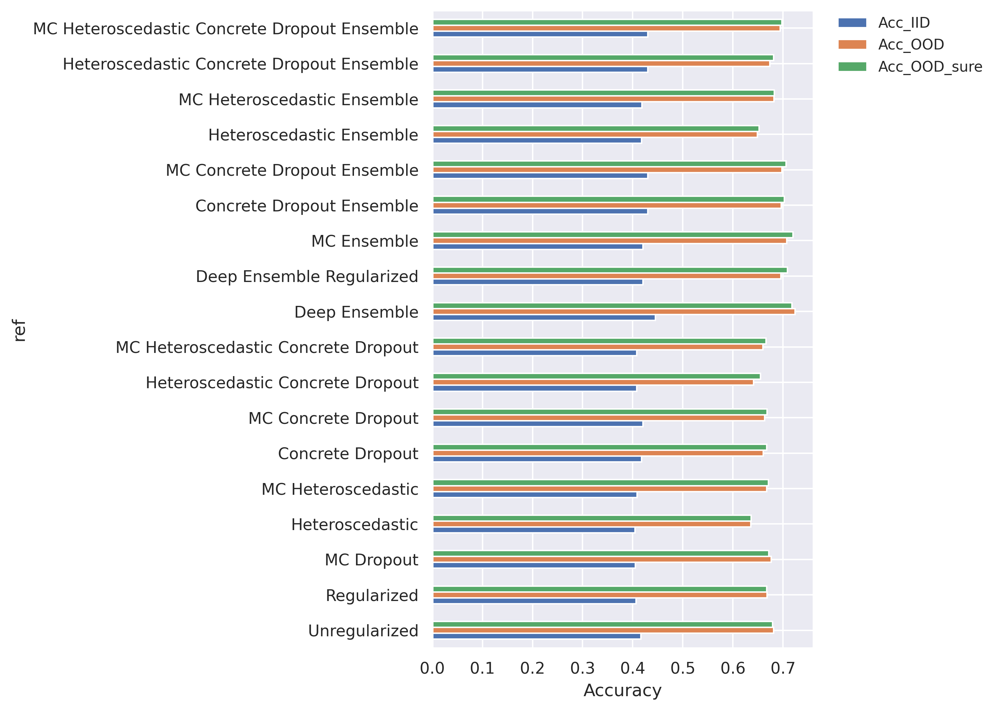

In [3]:
plt.rcParams['figure.figsize'] = [10, 7]
plt.rcParams['figure.dpi'] = 300
data.plot(x="ref",y=["Acc_IID","Acc_OOD","Acc_OOD_sure"],kind="barh", legend="upperleft")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False,fontsize="small")
plt.xlabel("Accuracy")
plt.tight_layout()
plt.savefig("imdb_OOD_"+dataset+".png")


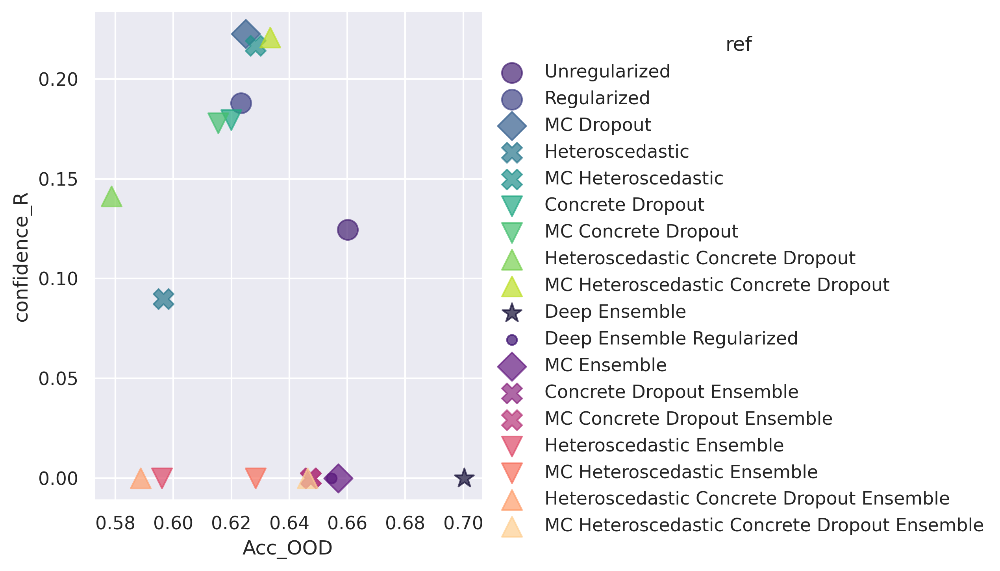

In [43]:
metric = "confidence_R"
measure = "Acc_OOD"
sns.lmplot(data=data[['AUPR','AUROC','ref',measure, metric]],x=measure, y=metric, hue="ref", markers=markers,palette=palette, scatter=True,legend=True,scatter_kws={"s": 150, "alpha":0.7})

# Amazon reviews: cross-domain generalization & detection

In [52]:
def open_all_amazon_reviews(evaluate_full=True):
    def open_source_target(source,target):
        data = pd.read_excel("/mnt/lerna/models/"+source+"_benchmark_"+target+"_ood.xlsx")
        assert len(data["ref"].unique()) == 18
        data["methodref"] = data["ref"].apply(lambda x: refs.index(x))
        data = data.sort_values(by=["methodref"],ascending=True)
        data.fillna(0,inplace=True)
        data["index"] = list(range(len(data)))
        data["source"] = source
        data["target"] = target
        return data 
    
    sources = "amazon_reviews-kitchen amazon_reviews-electronics amazon_reviews-dvd amazon_reviews-books".split()
    targets = [x if not evaluate_full else x+'_full' for x in reversed(sources)]
    
    ds = []
    for source in sources:
        for target in targets:
            if source in target: 
                continue
            d = open_source_target(source,target)
            ds.append(d)
    
        df = pd.concat(tuple(ds), axis=0)
    return df

df = open_all_amazon_reviews()
print(df)

     Acc_OOD                                            version      AUPR  \
0   0.670363  amazon_reviews-kitchen_nodropoutamazon_reviews...  0.534924   
1   0.638105  amazon_reviews-kitchen_baselineamazon_reviews-...  0.528996   
2   0.640121  amazon_reviews-kitchen_baselineamazon_reviews-...  0.529907   
3   0.638105  amazon_reviews-kitchen_aleatoricsamazon_review...  0.529278   
4   0.635585  amazon_reviews-kitchen_aleatoricsamazon_review...  0.529246   
..       ...                                                ...       ...   
13  0.712198  amazon_reviews-books_baseline_M5_concreteamazo...  0.513804   
14  0.697581  amazon_reviews-books_aleatorics_M5amazon_revie...  0.505049   
15  0.691532  amazon_reviews-books_aleatorics_M5amazon_revie...  0.506883   
16  0.709173  amazon_reviews-books_aleatorics_M5_concreteama...  0.508412   
17  0.712702  amazon_reviews-books_aleatorics_M5_concreteama...  0.514417   

       AUROC  FPRat95(↓)   Acc_IID  confidence_R confidence_p  aleatorics_R

In [53]:
def open_ood_amazon_reviews():
    def open_source(source):
        data = pd.read_excel("/mnt/lerna/models/"+source+"_benchmark_M.xlsx")
        assert len(data["ref"].unique()) == 18
        data = data.groupby(["ref","dataset"],as_index=False).mean()#.reset_index()
        data["methodref"] = data["ref"].apply(lambda x: refs.index(x))
        data = data.sort_values(by=["methodref"],ascending=True)
        data.fillna(0,inplace=True)
        data["index"] = list(range(len(data)))
        data["source"] = source
        return data 
    
    sources = "amazon_reviews-kitchen amazon_reviews-electronics amazon_reviews-dvd amazon_reviews-books".split()    
    ds = []
    for source in sources:
        d = open_source(source)
        ds.append(d)
        
        
    df = pd.concat(tuple(ds), axis=0)
    return df

ddf = open_ood_amazon_reviews()

In [54]:
source = "amazon_reviews-books"
target = "amazon_reviews-dvd_full"
data = pd.read_excel("/mnt/lerna/models/"+source+"_benchmark_"+target+"_ood.xlsx")
data.head()

data["methodref"] = data["ref"].apply(lambda x: refs.index(x))
data = data.sort_values(by=["methodref"],ascending=True)
data.fillna(0,inplace=True)
data["index"] = list(range(len(data)))

assert len(data["ref"].unique()) == 18

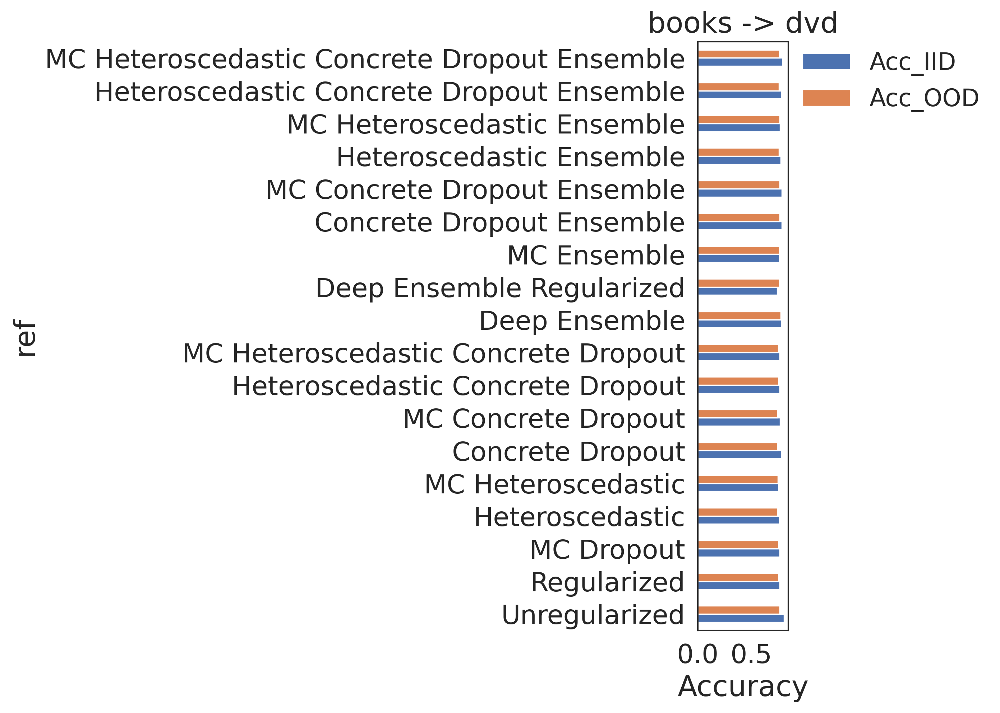

In [55]:
plt.rcParams['figure.figsize'] = [10, 7]
plt.rcParams['figure.dpi'] = 300
data.plot(x="ref",y=["Acc_IID","Acc_OOD"],kind="barh", legend="upperleft", stacked=False) #yerr=[df.mean()-df.min(), df.max()-df.mean()]
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False,fontsize="small")
plt.xlabel("Accuracy")
plt.title(source.split("amazon_reviews-")[-1]+" -> "+target.split("amazon_reviews-")[-1].replace("_full",""))
plt.tight_layout()
#plt.savefig("OOD-generalization_"+source.split("amazon_reviews-")[-1]+" - "+target.split("amazon_reviews-")[-1]+".png")

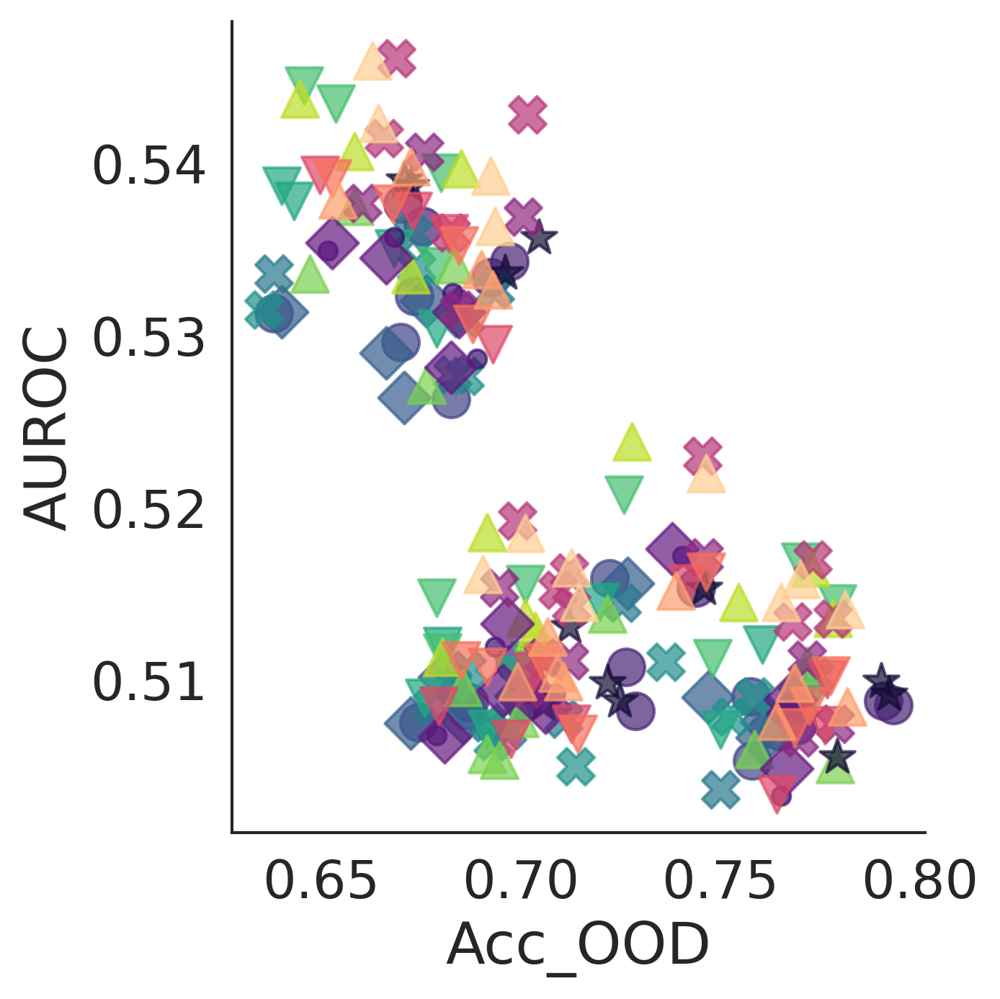

In [56]:
metric = "AUROC"
measure = "Acc_OOD"
ndf = df[(df["source"] == "amazon_reviews-electronics") & (df["target"] == "amazon_reviews-dvd_full")]
#books as source = centered around 51
#dvd around 51
#kitchen & electronics = split group around 54 -> books & dvd
sns.lmplot(data=df[['ref',measure, metric]],x=measure, y=metric, hue="ref", markers=markers,palette=palette, scatter=True,legend=False,scatter_kws={"s": 150, "alpha":0.7},fit_reg=False)

In [57]:
df["AUROC"]

0     0.537644
1     0.531261
2     0.531362
3     0.533594
4     0.531485
        ...   
13    0.516242
14    0.506581
15    0.510748
16    0.510411
17    0.516523
Name: AUROC, Length: 216, dtype: float64

Index(['Acc_OOD', 'version', 'AUPR', 'AUROC', 'FPRat95(↓)', 'Acc_IID',
       'confidence_R', 'confidence_p', 'aleatorics_R', 'aleatorics_p',
       'epistemics_R', 'epistemics_p', 'entropy_R', 'entropy_p',
       'mutual_information_R', 'mutual_information_p', 'dataset', 'base',
       'sampling', 'use_aleatorics', 'concrete_dropout', 'ensemble', 'ood',
       'arx', 'ref', 'num_layers', 'distribution', 'event_shape',
       'sigma_scaler', 'methodref', 'index', 'source', 'target'],
      dtype='object')
Forcing Nemenyi Critical difference


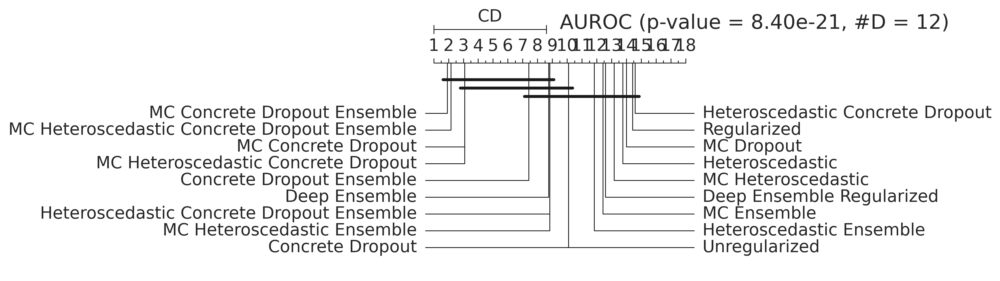

In [58]:
# import scikit_posthocs as sp
# pc = sp.posthoc_nemenyi_friedman(df.pivot_table(index=['source'], columns=["ref"], values="Acc_OOD", aggfunc=np.mean).values)
# heatmap_args = {'linewidths': 0.25, 'linecolor': '0.5', 'clip_on': False, 'square': True, 'cbar_ax_bbox': [0.80, 0.35, 0.04, 0.3]}
# sp.sign_plot(pc, **heatmap_args)
from scipy.stats import rankdata
from pycalib.stats import compute_friedmanchisquare
from pycalib.visualisations import plot_critical_difference
print(df.columns)
df["Ggap"] = df.apply(lambda row: row["Acc_IID"] - row["Acc_OOD"], axis=1)
measure = "AUROC"
df["st"] = df.apply(lambda row: row["source"].split("amazon_reviews-")[-1]+" -> "+row["target"].split("amazon_reviews-")[-1].replace("_full",""),axis=1)
#data = data.sort_values(by=["methodref"],ascending=True) 

table = df.pivot_table(index=['st'],
                           columns=["ref"],#["base","concrete_dropout", "ensemble"],
                           values=[measure],
                           aggfunc=np.mean)

# activate if higher is better
table *= -1

ranking_table = table.apply(rankdata, axis=1).mean()
#print(ranking_table)
#print(table)
ftest = compute_friedmanchisquare(table)
#print(ftest)
#from pycalib.stats import plot_critical_difference

#plt.rcParams["figure.figsize"] = (50,100)
sns.set_context("paper", font_scale=1.5)

_ = plot_critical_difference(avranks=ranking_table,
                           num_datasets=table.shape[0],
                           names=table.columns.levels[1],
                           title='{} (p-value = {:.2e}, #D = {})'.format(measure, 
                                                                        ftest.pvalue, table.shape[0]))

{'kitchen -> books': 'MC Concrete Dropout Ensemble', 'kitchen -> dvd': 'MC Concrete Dropout Ensemble', 'kitchen -> electronics': 'Deep Ensemble', 'electronics -> books': 'Regularized', 'electronics -> dvd': 'Regularized', 'electronics -> kitchen': 'Unregularized', 'dvd -> books': 'MC Concrete Dropout Ensemble', 'dvd -> electronics': 'MC Heteroscedastic', 'dvd -> kitchen': 'MC Heteroscedastic', 'books -> dvd': 'Deep Ensemble Regularized', 'books -> electronics': 'Deep Ensemble Regularized', 'books -> kitchen': 'Deep Ensemble Regularized'}


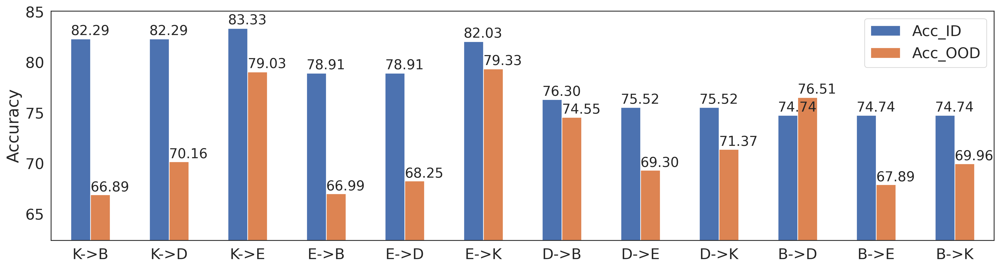

In [66]:
df["ST"] = df.apply(lambda row: row["st"].upper()[0] + "->" + row["st"].split("-> ")[-1][0].upper(),axis=1)

d = {}
new_dfs = []
for c in df["st"].unique():
    now = df[(df["st"] == c)]
    best = now[now["Ggap"] == now["Ggap"].min()]
    d[c] = best["ref"].item()
    new_dfs.append(best)
new_df = pd.concat(tuple(new_dfs),axis=0)

print(d)

sns.set_context("paper", font_scale=2)
#if we find the best per target, THEN we need to calculate mean and std, followed by standard error to plot bars
plt.rcParams['figure.figsize'] = [20, 5]
plt.rcParams['figure.dpi'] = 300

new_df["Acc_IID"] *= 100
new_df["Acc_OOD"] *= 100
new_df["Acc_ID"] = new_df["Acc_IID"]

ax = new_df.plot(x="ST",y=["Acc_ID","Acc_OOD"],kind="bar", stacked=False, rot=0)
plt.legend(loc="upper right")
ax.set_xlabel("")
ax.set_ylabel("Accuracy")
ax.set_ylim([new_df["Acc_OOD"].min()-new_df["Acc_OOD"].std(), new_df["Acc_IID"].max()+new_df["Acc_IID"].std()/2])

for p in ax.patches:         ax.annotate('{:.2f}'.format(p.get_height()), (p.get_x() * 1.00, p.get_height() * 1.005), size="small")

#plt.tight_layout()
#df[df["ref"].isin(["Unregularized", "Deep Ensemble", "Concrete Dropout Ensemble"])]
#for each source-target combination -> best IID or best OOD, then report IID/OOD as is | lowest generalization gap?

In [22]:
import scipy.stats as sp # for calculating standard error

df["st"] = df.apply(lambda row: row["source"].split("amazon_reviews-")[-1]+" -> "+row["target"].split("amazon_reviews-")[-1].replace("_full",""),axis=1)
df["ST"] = df.apply(lambda row: row["st"].upper()[0] + "->" + row["st"].split("-> ")[-1][0].upper(),axis=1)

def double_std(array):
 return np.std(array) * 2

# d = {}
# new_dfs = []
# for c in df["st"].unique():
#     now = df[(df["st"] == c)]
#     best = now[now["Ggap"] == now["Ggap"].min()]
#     d[c] = best["ref"].item()
#     new_dfs.append(best)
# new_df = pd.concat(tuple(new_dfs),axis=0)

#if we find the best per target, THEN we need to calculate mean and std, followed by standard error to plot bars
plt.rcParams['figure.figsize'] = [20, 5]
plt.rcParams['figure.dpi'] = 300

if df["Acc_IID"].max() < 1:
    df["Acc_IID"] *= 100
    df["Acc_OOD"] *= 100
meandf = df.groupby("ST").agg([np.mean, double_std, sp.sem])
#print(meandf)
# meandf = meandf["Acc_OOD"]

# meandf["ST"] = meandf.index.tolist()

# ax = meandf.plot(x="ST",y="mean",kind="bar", stacked=False, rot=0, yerr="double_std")
 
print(meandf)#.xs("Acc_OOD"))
    
ax = meandf.unstack(level=0).plot(kind='bar', subplots=True)
#https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.xs.html
"""
plt.legend(loc="lower center")
plt.xlabel("")
plt.ylabel("Accuracy")
for p in ax.patches:         ax.annotate('{:.2f}'.format(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

for key, spine in ax.spines.items():
    spine.set_visible(False)
ax.tick_params(bottom = False, left = False)
ax.errorbar(meandf["mean"], meandf.index, xerr = meandf["double_std"], 
            linewidth = 1.5, color = "black", alpha = 0.4, capsize = 4)
"""

        Acc_OOD                           AUPR                          AUROC  \
           mean double_std       sem      mean double_std       sem      mean   
ST                                                                              
B->D  76.178875   1.631051  0.197794  0.506822   0.006536  0.000793  0.507554   
B->E  68.713598   2.298939  0.278787  0.506714   0.005268  0.000639  0.509625   
B->K  70.203293   2.341385  0.283935  0.508186   0.006150  0.000746  0.510618   
D->B  73.552307   1.919388  0.232760  0.515850   0.006528  0.000792  0.516911   
D->E  69.461246   1.862387  0.225848  0.509716   0.007466  0.000905  0.512369   
D->K  70.830533   1.769084  0.214533  0.508235   0.005724  0.000694  0.509322   
E->B  66.406250   1.827923  0.221668  0.538470   0.007782  0.000944  0.536856   
E->D  68.464382   1.442155  0.174887  0.531009   0.007896  0.000958  0.530751   
E->K  77.447357   2.246630  0.272444  0.508494   0.005857  0.000710  0.509907   
K->B  65.381384   2.624251  

TypeError: no numeric data to plot

In [47]:
                                    ftest.pvalue, table.shape[0]))

#ddf["Ggap"] = ddf.apply(lambda row: row["Acc_IID"] - row["Acc_OOD"], axis=1)
# ddf["st"] = ddf.apply(lambda row: row["source"].split("amazon_reviews-")[-1]+" -> "+row["target"].split("amazon_reviews-")[-1].replace("_full",""),axis=1)
# ddf["ST"] = ddf.apply(lambda row: row["st"].upper()[0] + "->" + row["st"].split("-> ")[-1][0].upper(),axis=1)
# ax = ddf.plot(x="ST",y=["Acc_IID","Acc_OOD"],kind="boxen", stacked=False, rot=0)

KeyError: 'Acc_IID'

[[<AxesSubplot:> <AxesSubplot:> <AxesSubplot:>]
 [<AxesSubplot:> <AxesSubplot:> <AxesSubplot:>]
 [<AxesSubplot:> <AxesSubplot:> <AxesSubplot:>]
 [<AxesSubplot:> <AxesSubplot:> <AxesSubplot:>]]














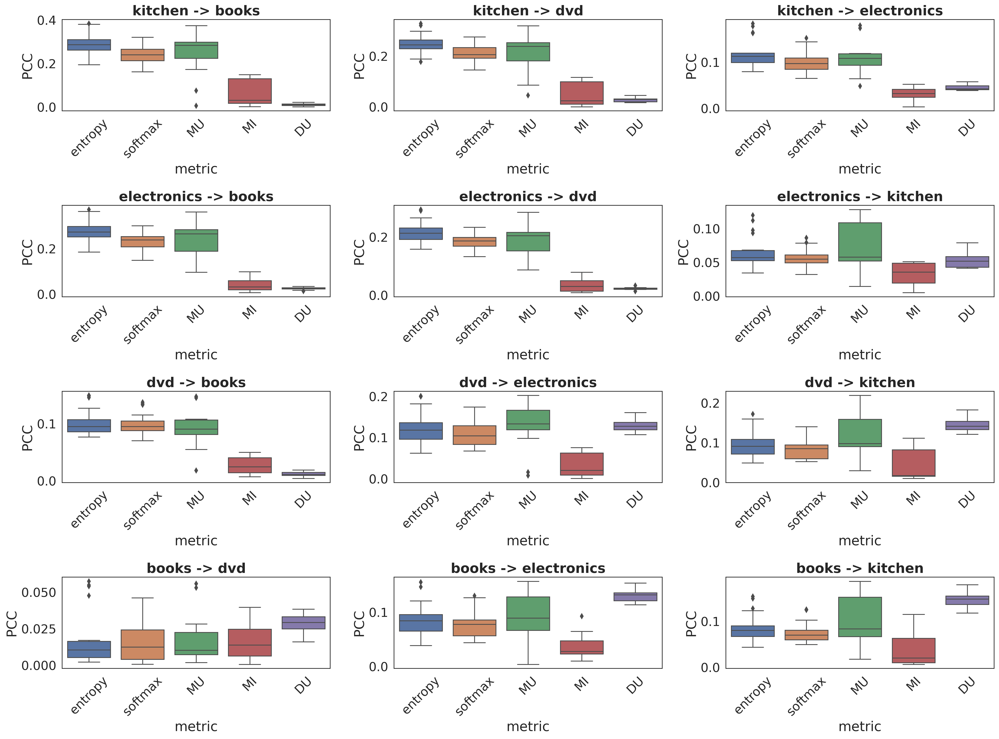

In [25]:
# how about uncertainty correlations? between them

from scipy.stats import rankdata
from collections import OrderedDict

replacer = {"entropy_R":"entropy", "confidence_R": "softmax", "aleatorics_R":"DU", "epistemics_R":"MU", "mutual_information_R":"MI"}

def ranker(df):
    metrics = [x + "_R" for x in ["entropy","confidence", "aleatorics", "epistemics", "mutual_information"]]
    ranks = OrderedDict()
    metricz = []
    version = []
    for i,row in df.iterrows():
        for metric in metrics:
            v = abs(row[metric])
            if not v:
                continue
            ranks[row["ref"] + "_" + metric] = v
            metricz.append(metric)
            version.append(row["ref"])
    
    new = pd.DataFrame(list(ranks.values()),columns=["abs"])
    new["metric"] = [replacer[x] for x in metricz]
    new["rank"] = rankdata(new["abs"])
    #new["st"] = df["st"].unique()[0]
    new["version"] = version
    return new
    
def largest_divisor(num):
    for i in range(2, num):
        #3
        if num % i == 0:
            #4
            largest_divisor = i 
    return largest_divisor

plt.rcParams['figure.figsize'] = [20,15]
sns.set_context("paper", font_scale=2)
#plt.rcParams['figure.dpi'] = 300

# rows = largest_divisor(len(df["st"].unique()))
# columns = int(len(df["st"].unique())/rows)
fig, ax = plt.subplots(4,3)
print(ax)
for i, source in enumerate(df["source"].unique()): #4
    discount = 0
    for j, target in enumerate(df["target"].unique()): #3
        if source == target.replace("_full",""):
            discount += 1
            continue
        f = df.loc[(df["source"] == source) & (df["target"] == target)]
        ranked = ranker(f)#.sort_values(by=["abs"],ascending=False)
        #ranked.to_csv(ranked["dataset"].unique()[0] + "_ranks.csv",index=False)
#         print(ranked.head())
        print()
    #     axes = tuple([abs(int(rows-i)),int(rows-i>=1)])
        j = j - discount
        ranked["PCC"] = ranked["abs"]
        g = sns.boxplot(x="metric",y="PCC",data=ranked, ax=ax[i,j])
        ax[i,j].tick_params(axis='x', labelrotation=45)
        ax[i,j].set_title(f["st"].unique()[0], fontweight='bold')
plt.tight_layout()

                                        ECE                            \
ref                        Concrete Dropout Concrete Dropout Ensemble   
source                                                                  
amazon_reviews-books               0.039283                    0.0378   
amazon_reviews-dvd                 0.033033                    0.0285   
amazon_reviews-electronics         0.032667                    0.0451   
amazon_reviews-kitchen             0.031050                    0.0258   

                                                                    \
ref                        Deep Ensemble Deep Ensemble Regularized   
source                                                               
amazon_reviews-books              0.0456                    0.0604   
amazon_reviews-dvd                0.0419                    0.0448   
amazon_reviews-electronics        0.0242                    0.0445   
amazon_reviews-kitchen            0.0510                    0.0400  

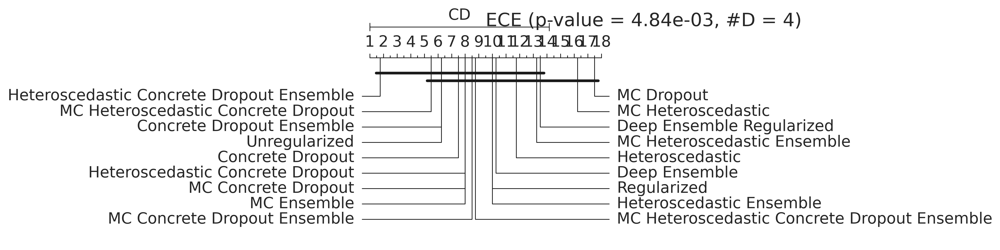

In [27]:
# import scikit_posthocs as sp
# pc = sp.posthoc_nemenyi_friedman(df.pivot_table(index=['source'], columns=["ref"], values="Acc_OOD", aggfunc=np.mean).values)
# heatmap_args = {'linewidths': 0.25, 'linecolor': '0.5', 'clip_on': False, 'square': True, 'cbar_ax_bbox': [0.80, 0.35, 0.04, 0.3]}
# sp.sign_plot(pc, **heatmap_args)
from scipy.stats import rankdata
from pycalib.stats import compute_friedmanchisquare
from pycalib.visualisations import plot_critical_difference

ddf.columns = [col.replace("(↓)","") for col in ddf.columns]

measure = "ECE"
#data = data.sort_values(by=["methodref"],ascending=True) 

table = ddf.pivot_table(index=['source'],
                           columns=["ref"],#["base","concrete_dropout", "ensemble"],
                           values=[measure],
                           aggfunc=np.mean)

# activate if higher is better
#table *= -1

ranking_table = table.apply(rankdata, axis=1).mean()
#print(ranking_table)
print(table)
ftest = compute_friedmanchisquare(table)
#print(ftest)
#plt.rcParams["figure.figsize"] = (50,100)
_ = plot_critical_difference(avranks=ranking_table,
                           num_datasets=table.shape[0],
                           names=table.columns.levels[1],
                           title='{} (p-value = {:.2e}, #D = {})'.format(measure, 
                                                                        ftest.pvalue, table.shape[0]))

In [5]:
data.groupby(["ref","dataset"],as_index=False).mean()

NameError: name 'data' is not defined

In [2]:
import pycalib

ModuleNotFoundError: No module named 'pycalib'

# OOD plotting

In [ ]:
# path = "/mnt/lerna/models/Reuters_multilabel_benchmark_ood.xlsx"
# #path = "/mnt/lerna/models/20news_ood.xlsx"
# df = pd.read_excel(path)
# df.replace(str(np.NaN),np.NaN, inplace=True)
# df.replace(np.NaN,"", inplace=True)

df = oodf

# fig, ax = plt.subplots(1,1, figsize=(20,15))
# fig.tight_layout(pad=0)

y = "AUROC"#'epistemics_R'#"AUB"#['NLL(↓)', 'AUB']£
x = "ref"

g = sns.catplot(x=x, y=y, hue="ref", data=df.sort_values(by=[y],ascending=False),legend_out=False,kind="boxen")
g.add_legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False)
g.ax.tick_params(axis='x', labelrotation=90)
#should add text to the dot :) 


In [ ]:
### Confidence-accuracy curves

In [ ]:
path = "Reuters_ood.xlsx"
df = pd.read_excel(path)
df.replace(str(np.NaN),np.NaN, inplace=True)
df.replace(np.NaN,"", inplace=True)

df.head()

In [ ]:
y = 'AUPR' #AUPR    -> concrete dropout kills confidence!
x = "ensemble"

plt.xticks(rotation=90)
g = sns.catplot(x=list(range(len(df))), y=y, hue="ref", data=df.sort_values(by=[y, x],ascending=False),legend_out=False)
g.tick_params(axis='x', labelrotation=90)
g.add_legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)


In [14]:
import matplotlib._color_data as mcd
from cycler import cycler

def surface_area(x, y):
    from sklearn.metrics import auc
    curve_auc = auc(x, y)
    return curve_auc

def plot_multiples(list_of_stats, title="", labels=""):
    import seaborn as sns
    sns.set(color_codes=True)
    cycle = sns.color_palette("Paired",len(list_of_stats))
#    color_cycle = cycler(color=sns.color_palette("hls", 4))
    ls_cycle = cycler(linestyle=['-', '--', '-.', ':'])
#     lw_cycle = cycler('lw', [0.25,0.5,1,1.5])
#     cc = ls_cycle * (color_cycle + lw_cycle)
    cc = ls_cycle()
    #cycle = sorted([name for name in mcd.CSS4_COLORS])
    #cycle = plt.rcParams['axes.prop_cycle'].by_key()['color']
    for i, stats in enumerate(list_of_stats):
        threshes = list(range(0, 101))
        x = sorted([stats[t]["fp"] for t in threshes],reverse=True)
        y = sorted([stats[t]["uof"] for t in threshes],reverse=True)
        plt.xlabel('FP')
        plt.ylabel('Unopened Field')
        plt.plot(x, y, label=labels[i], **next(cc), color=cycle[i])
    if title:
        plt.title(title)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False)
    plt.show()
"""
import ast
path = "/mnt/lerna/models/NL-UW-before.xlsx"
df = pd.read_excel(path)#,dtype={"unopened_field": object})

df["unopened_field"] = df["unopened_field"].apply(lambda x: ast.literal_eval(x))
#print(type(df["unopened_field"].loc[0][0]["uof"]))

#print(df["unopened_field"].values[0]["uof"])
df.replace(str(np.NaN),np.NaN, inplace=True)
df.replace(np.NaN,"", inplace=True)
df = df.sort_values(by=["AUB"],ascending=False)

df.head()
"""

'\nimport ast\npath = "/mnt/lerna/models/NL-UW-before.xlsx"\ndf = pd.read_excel(path)#,dtype={"unopened_field": object})\n\ndf["unopened_field"] = df["unopened_field"].apply(lambda x: ast.literal_eval(x))\n#print(type(df["unopened_field"].loc[0][0]["uof"]))\n\n#print(df["unopened_field"].values[0]["uof"])\ndf.replace(str(np.NaN),np.NaN, inplace=True)\ndf.replace(np.NaN,"", inplace=True)\ndf = df.sort_values(by=["AUB"],ascending=False)\n\ndf.head()\n'

In [8]:
from cycler import cycler
cc = (cycler(color=sns.color_palette("hls", 5), linestyle=['-', '--', '-.', '.', ':','  ']))

for d in cc:
    print(d)

ValueError: Can only add equal length cycles, not 5 and 6

In [9]:
p = sns.color_palette("Paired",50)
len(p)

50

['Heteroscedastic Ensemble-15.2795', 'Regularized-15.7093', 'Heteroscedastic-15.8199', 'Heteroscedastic Concrete Dropout-15.929', 'MC Heteroscedastic Ensemble-16.7594', 'Unregularized-16.7778', 'MC Heteroscedastic Concrete Dropout-16.9521', 'MC Heteroscedastic-18.7386', 'MC Dropout-19.0042']
9


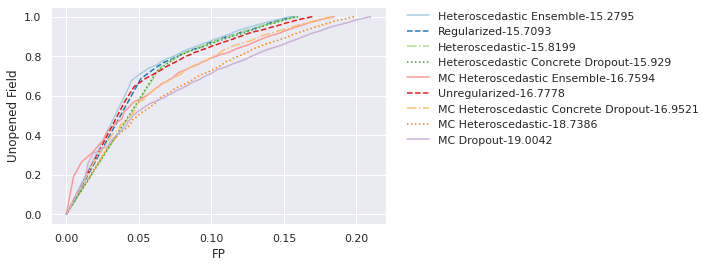

In [19]:
labels = ["-".join([str(y) for y in x]) for x in zip(df["ref"],df["AUB"])]
print(labels)
print(len(labels))
plot_multiples(df["unopened_field"], labels=labels)

['NL-UW_HAN100_0_mc-21.1451', 'NL-UW_HAN100_0_nonbayesian-21.0718', 'NL-UW_HAN_v2_30K_mc-20.9682', 'NL-UW_HAN_v2_30K_nonbayesian-20.9045', '200707-152052_NL-UW_nonbayesian-20.8511', 'NL-UW_HAN200_0_mc-20.7526', 'NL-UW_HAN200_0_nonbayesian-20.7526', '200817-095523_NL-UW_nonbayesian-20.6784', 'NL-UW_HAN300_0_nonbayesian-20.5788', 'NL-UW_HAN300_0_mc-20.5788', 'NL-UW_HAN250_0_nonbayesian-20.575', 'NL-UW_HAN250_0_mc-20.575', '200707-152052_NL-UW_mc-20.5506', 'NL-UW_HAN_150base_nonbayesian-20.4178', '200807-153133_NL-UW_mc-20.2949', '200807-143802_NL-UW_mc-20.2949', 'NL-UW_HAN_lowlr_nonbayesian-20.2558', 'cnn_word_aleatoric_NL-UW_mc-20.2328', '200817-095523_NL-UW_mc-20.2195', 'cnn_word_aleatoric_NL-UW_nonbayesian-18.9437', '200807-153133_NL-UW_nonbayesian-18.7928', '200807-143802_NL-UW_nonbayesian-18.7928', '200807-142626_NL-UW_mc-14.5697', '200807-142626_NL-UW_nonbayesian-9.8429']
24


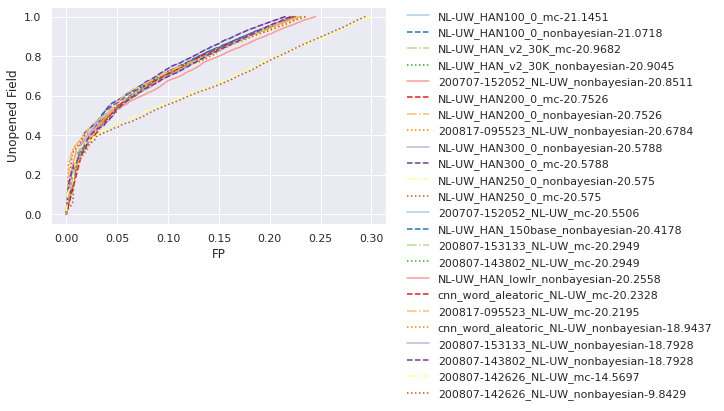

In [16]:
import ast
path = "/mnt/lerna/models/NL-UW.xlsx"
df = pd.read_excel(path)#,dtype={"unopened_field": object})

df["unopened_field"] = df["unopened_field"].apply(lambda x: ast.literal_eval(x))
#print(type(df["unopened_field"].loc[0][0]["uof"]))

#print(df["unopened_field"].values[0]["uof"])
df.replace(str(np.NaN),np.NaN, inplace=True)
df.replace(np.NaN,"", inplace=True)
df = df.sort_values(by=["AUB"],ascending=False)

labels = ["-".join([str(y) for y in x]) for x in zip(df["version"],df["AUB"])]
print(labels)
print(len(labels))
plot_multiples(df["unopened_field"], labels=labels)

['20news_aleatorics_concrete_nonbayesian-16.9983', '20news_aleatorics_mc-16.9538', '20news_baseline_concrete_nonbayesian-16.7746', '20news_nodropout_nonbayesian-16.7744', '20news_baseline_mc-16.2816', '20news_baseline_concrete_mc-15.9408', '20news_aleatorics_concrete_mc-15.8317', '20news_aleatorics_nonbayesian-15.6887', '20news_nodropout_M5_nonbayesian-15.1337', '20news_aleatorics_M5_concrete_nonbayesian-14.9589', '20news_baseline_M5_concrete_nonbayesian-14.9517', '20news_baseline_M5_mc-14.7467', '20news_aleatorics_M5_mc-14.7375', '20news_baseline_nonbayesian-14.7335', '20news_baseline_M5_concrete_mc-14.1492', '20news_aleatorics_M5_concrete_mc-14.0057', '20news_aleatorics_M5_nonbayesian-13.7672', '20news_baseline_M5_nonbayesian-13.5447']
18


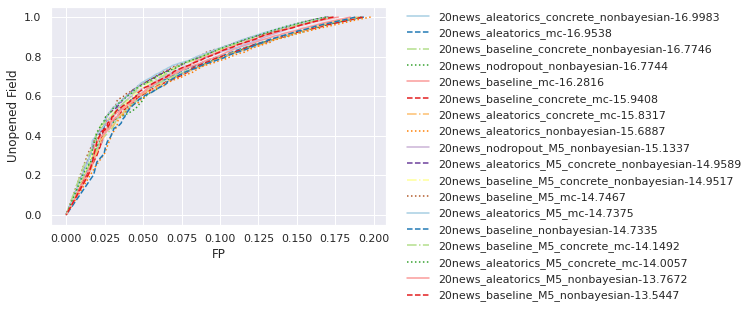

In [17]:
import ast
path = "/mnt/lerna/models/20news_benchmark.xlsx"
df = pd.read_excel(path)#,dtype={"unopened_field": object})

df["unopened_field"] = df["unopened_field"].apply(lambda x: ast.literal_eval(x))
#print(type(df["unopened_field"].loc[0][0]["uof"]))

#print(df["unopened_field"].values[0]["uof"])
df.replace(str(np.NaN),np.NaN, inplace=True)
df.replace(np.NaN,"", inplace=True)
df = df.sort_values(by=["AUB"],ascending=False)

labels = ["-".join([str(y) for y in x]) for x in zip(df["version"],df["AUB"])]
print(labels)
print(len(labels))
plot_multiples(df["unopened_field"], labels=labels)

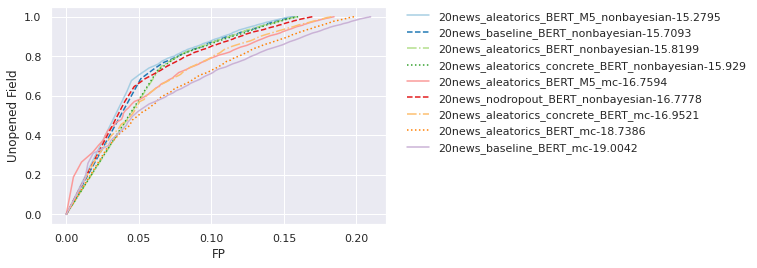

In [18]:
import ast
path = "/mnt/lerna/models/20news.xlsx"
df = pd.read_excel(path)#,dtype={"unopened_field": object})
#df=df[df["dataset"] == "CLINC150"].reset_index(drop=True)
df=df[df["version"].str.contains("BERT",regex=True)].reset_index(drop=True)

df["unopened_field"] = df["unopened_field"].apply(lambda x: ast.literal_eval(x))

df.replace(str(np.NaN),np.NaN, inplace=True)
df.replace(np.NaN,"", inplace=True)
df = df.sort_values(by=["AUB"],ascending=True)

labels = ["-".join([str(y) for y in x]) for x in zip(df["version"],df["AUB"])]
plot_multiples(df["unopened_field"], labels=labels)

In [ ]:
path = "/mnt/lerna/models/CLI.xlsx"
df = pd.read_excel(path)

y = 'NLL(↓)'#'Acc'
x = "sampling"

g = sns.catplot(x=x, y=y, hue="version", data=df.sort_values(by=[y, x],ascending=False),legend_out=False)
g.add_legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False)
g.ax.tick_params(axis='x', labelrotation=90)

# BEST per model

In [ ]:
best = {
"20news":"20news_aleatorics_M5", #aleatorics [non concrete] OR heteroscedastic ensemble
"imdb":"imdb_baseline_M5", #YET MC  
"CLINC150":"CLINC150_aleatorics_M5_concrete", #full combination
"Reuters_multilabel":"Reuters_multilabel_baseline_M5_concrete", 
"AAPD":"AAPD_nodropout_M5"
}
sampling = {
"20news":"nonbayesian", #aleatorics [non concrete] OR heteroscedastic ensemble
"imdb":"mc", #YET MC  
"CLINC150":"mc", #full combination
"Reuters_multilabel":"nonbayesian", 
"AAPD":"nonbayesian"
}

for dataset, model in best.items():
#     if dataset not in ["Reuters_multilabel","AAPD"]:
#         continue
    print(dataset)
    abl = pd.read_csv("/mnt/lerna/models/"+model+"_ood/"+sampling[dataset]+"oov-doclen.csv")
    #print(abl.head())
    abl = abl[abl["known"] == 1].reset_index(drop=True)
    abl["doclen_norm"] = abl["doclen"].apply(lambda x: (x- abl["doclen"].min()) / (abl["doclen"].max() - abl["doclen"].min()))
    abl["oov_norm"] = abl["oov"].apply(lambda x: (x- abl["oov"].min()) / (abl["oov"].max() - abl["oov"].min()))
    
    ys = ["entropy", "confidence", "epistemics",  "mutual_information"]
    if "aleatorics" in model:
        ys.append("aleatorics")
    color = ["green" if abl["y"].iloc[i] else "purple" if not abl["known"].iloc[i] else "red" for i in range(len(abl))]
    #marker = ["+" if abl["y"].iloc[i] else "*" if not abl["known"].iloc[i] else "x" for i in range(len(abl))]
    xax = "doclen_norm"
    for y in ys:
        ax = abl.plot(y=y,x=xax,kind="scatter",color=color, marker="+")
        from scipy.stats import pointbiserialr, pearsonr
        correlation, p = pointbiserialr(abl[y], abl[xax])
        print(f"{xax} {y}: {correlation} {p}")
        correlation = round(correlation,4)
        p = "***" if p <= 0.001 else "**" if p <= 0.01 else "*" if p <= 0.05 else ""
        plt.text(0.9, 0.9,f"{correlation} {p}", horizontalalignment='center',verticalalignment='center',transform = ax.transAxes)
        #plt.show()
    
        if "cardinality" in abl:
            ax = abl.plot(y=y,x="cardinality",kind="scatter",color=color, marker="+")
            from scipy.stats import pointbiserialr, pearsonr
            correlation, p = pointbiserialr(abl[y], abl["cardinality"])
            print(f"cardinality {y}: {correlation} {p}")
            correlation = round(correlation,4)
            p = "***" if p <= 0.001 else "**" if p <= 0.01 else "*" if p <= 0.05 else ""
            plt.text(0.9, 0.9,f"{correlation} {p}", horizontalalignment='center',verticalalignment='center',transform = ax.transAxes)      

        if "density" in abl:
            ax = abl.plot(y=y,x="density",kind="scatter",color=color, marker="+")
            from scipy.stats import pointbiserialr, pearsonr
            correlation, p = pointbiserialr(abl[y], abl["density"])
            print(f"density {y}: {correlation} {p}")
            correlation = round(correlation,4)
            p = "***" if p <= 0.001 else "**" if p <= 0.01 else "*" if p <= 0.05 else ""
            plt.text(0.9, 0.9,f"{correlation} {p}", horizontalalignment='center',verticalalignment='center',transform = ax.transAxes)      

            
# DO FOR THE BEST MODELS?
            
# /mnt/lerna/models/20news_aleatorics_M5
# /mnt/lerna/models/20news_aleatorics_M5_ood
# /mnt/lerna/models/imdb_baseline_M5
# /mnt/lerna/models/imdb_baseline_M5_ood
# /mnt/lerna/models/CLINC150_aleatorics_M5_concrete
# /mnt/lerna/models/CLINC150_aleatorics_M5_concrete_ood
# /mnt/lerna/models/Reuters_multilabel_baseline_M5_concrete
# /mnt/lerna/models/Reuters_multilabel_baseline_M5_concrete_ood
# /mnt/lerna/models/AAPD_nodropout_M5
# /mnt/lerna/models/AAPD_nodropout_M5_ood

#density is fully 1???

In [ ]:
def select_quality(abl, uncertainty, quality="low",s=5):
    from scipy.stats import rankdata
    higher_is_better = False
    if uncertainty in ["confidence", "epistemics"]:
        higher_is_better = True
    #cherrypick
    abl["sorted"] = rankdata(abl[uncertainty])
    abl_sort = abl.sort_values(by=["sorted"],ascending=False if quality == "low" and not higher_is_better else True)
    for i in range(s):
        print(abl_sort["document"].iloc[i], abl_sort[uncertainty].iloc[i], abl_sort["gold"].iloc[i], abl_sort["predicted"].iloc[i])
    print()

for dataset, model in best.items():
    print(dataset+": "+model)
    abl = pd.read_csv("/mnt/lerna/models/"+model+"_ood/"+sampling[dataset]+"oov-doclen.csv")
    abl = abl[abl["known"] == 1].reset_index(drop=True)
    select_quality(abl, "aleatorics", quality="low",s=20)

In [ ]:
def threed(df, uncertainty, alternate="confidence", identifier=None, path="", plot=False):
    from mpl_toolkits.mplot3d import Axes3D

    fig = plt.figure(figsize=(30, 20))
    fig.suptitle(str(uncertainty) + " projection")
    ax = fig.add_subplot(111, projection='3d')

    df = df.sort_values(by=["known"])

    from sklearn.preprocessing import MinMaxScaler

    df[uncertainty] = MinMaxScaler().fit_transform(df[[uncertainty]])

    for correctness in [True, False]:
        for known in [0, 1]:
            label = ""
            color = "black"
            if correctness and known:
                color = "green"
                label = "correct_IID"
            # if correctness and not known:
            #     color = "blue"
            #     label = "correct_unknown"
            if not correctness and known:
                color = "red"
                label = "incorrect_IID"
            if not correctness and not known:
                color = "purple"
                label = "incorrect_OOD"

            data = df[(df["known"] == known) & (df["y"] == correctness)]

            xs = data.index.values
            ys = data[alternate]
            zs = data[uncertainty]
            marker = "+" if correctness else "*"

            ax.scatter(xs, ys, zs, marker=marker, label=label, color=color)

    ax.set_xlabel('index')
    ax.set_ylabel(alternate)
    ax.set_zlabel(uncertainty)
threed(abl, "epistemics", alternate="oov_norm")

# Timings

In [66]:
import regex as re
import numpy as np
import pandas as pd
import matplotlib
%matplotlib inline
from matplotlib import pyplot as plt
# plt.rcParams['figure.figsize'] = [12, 8]
# plt.rcParams['figure.dpi'] = 100
import seaborn as sns
plt.tight_layout()
sns.set(color_codes=True)
sns.set_style('white')
sns.set_context("paper", font_scale = 2)

<Figure size 432x288 with 0 Axes>

In [67]:
train_timings = pd.read_csv("scripts/train-timings.csv", sep=",") 
timings = pd.read_csv("scripts/timings.csv", sep=",") 

In [68]:
train_timings

,model,methods,architecture,train time/epoch,epoch finished,train runtime
0,CLINC150_nodropout,Unregularized,TextCNN,32,8,256
1,CLINC150_baseline,Regularized,TextCNN,32,28,896
2,CLINC150_aleatorics,Heteroscedastic,TextCNN,59,17,1003
3,CLINC150_baseline_concrete,Concrete Dropout,TextCNN,35,12,420
4,CLINC150_aleatorics_concrete,Heteroscedastic Concrete Dropout,TextCNN,58,10,580
5,CLINC150_nodropout_BERT,Unregularized,BERT,420,5,2100
6,CLINC150_baseline_BERT,Regularized,BERT,691,11,7601
7,CLINC150_aleatorics_BERT,Heteroscedastic,BERT,710,16,11360
8,CLINC150_baseline_concrete_BERT,Concrete Dropout,BERT,679,9,6111
9,CLINC150_aleatorics_concrete_BERT,Heteroscedastic Concrete Dropout,BERT,707,16,11312


In [75]:
translator = {
    "nodropout": "Unregularized",  # 1
    "baseline": "Regularized",  # 1
    "aleatorics_concrete": "Heteroscedastic Concrete Dropout",  # 2
    "aleatorics": "Heteroscedastic",  # 1
    "baseline_concrete": "Concrete Dropout"  # 1
}

def translate_method(x):
    for key, value in translator.items():
        if x.endswith(key) or x.endswith(key+"_BERT"):
            return value

timings["method"] = timings["model"].apply(lambda x : translate_method(x))

print(timings)
#for i, row in df.iterrows():
    

# "MC Dropout",  # 1
# "MC Heteroscedastic",  # 2
# "MC Concrete Dropout",  # 2
# "MC Heteroscedastic Concrete Dropout",  # 3

                                model architecture device     batch  sample  \
0        CLINC150_aleatorics_concrete      TextCNN    gpu  0.001322     NaN   
1          CLINC150_baseline_concrete      TextCNN    gpu  0.015023     NaN   
2                 CLINC150_aleatorics      TextCNN    gpu  0.001443     NaN   
3                   CLINC150_baseline      TextCNN    gpu  0.014989     NaN   
4                  CLINC150_nodropout      TextCNN    gpu  0.016920     NaN   
5   CLINC150_aleatorics_concrete_BERT         BERT    gpu  0.146576     NaN   
6     CLINC150_baseline_concrete_BERT         BERT    gpu  0.130386     NaN   
7            CLINC150_aleatorics_BERT         BERT    gpu  0.098301     NaN   
8              CLINC150_baseline_BERT         BERT    gpu  0.104425     NaN   
9             CLINC150_nodropout_BERT         BERT    gpu  0.143151     NaN   
10       CLINC150_aleatorics_concrete      TextCNN    cpu  0.003138     NaN   
11         CLINC150_baseline_concrete      TextCNN  

\begin{tabular}{llrrrr}
\toprule
architecture &                               method &  batch/s (gpu) &  sample/s (gpu) &  batch/s (cpu) &  sample/s (cpu) \\
\midrule
     TextCNN &                        Unregularized &           59.0 &            1891 &           63.0 &            2043 \\
     TextCNN &                          Regularized &           66.0 &            2134 &           60.0 &            1922 \\
     TextCNN &                           MC Dropout &           53.0 &            1708 &           32.0 &            1050 \\
     TextCNN &                      Heteroscedastic &          693.0 &           22176 &          482.0 &           15444 \\
     TextCNN &                   MC Heteroscedastic &           47.0 &            1525 &           38.0 &            1216 \\
     TextCNN &                     Concrete Dropout &           66.0 &            2130 &           40.0 &            1293 \\
     TextCNN &                  MC Concrete Dropout &           48.0 &            1

<AxesSubplot:>

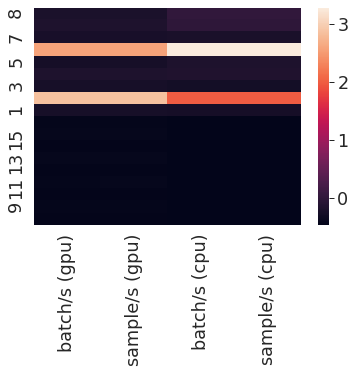

In [80]:
from copy import deepcopy

refs = ["Unregularized",
"Regularized",
"MC Dropout",
"Heteroscedastic",
"MC Heteroscedastic",
"Concrete Dropout",
"MC Concrete Dropout",
"Heteroscedastic Concrete Dropout",
"MC Heteroscedastic Concrete Dropout"]

collector = []
for i, row in timings.iterrows():
    batch_size = 32 #16 if row["architecture"] == "BERT" else 32
    temp = deepcopy(row.to_dict())
    device = row["device"]
    
    # 1: 
    no_samples = deepcopy(temp)
    no_samples["batch_mc"]
    no_samples[f"batch/s ({device})"] = no_samples["batch"]
    no_samples[f"sample/s ({device})"] = no_samples["batch"] / batch_size
    no_samples.pop("batch")
    no_samples.pop("sample")
    no_samples.pop("batch_mc")
    no_samples.pop("sample_mc")
    no_samples.pop("model")
    no_samples.pop("device")

    collector.append(no_samples)
    
    # 2:
    if row["method"] == "Unregularized":
        continue
    samples = deepcopy(temp)
    samples[f"batch/s ({device})"] = samples["batch_mc"]
    samples[f"sample/s ({device})"] = samples["sample_mc"] #samples["batch_mc"] / batch_size
    if row["method"] == "Regularized":
        samples["method"] = "MC Dropout"
    else:
        samples["method"] = "MC " + samples["method"]

    samples.pop("batch")
    samples.pop("sample")
    samples.pop("batch_mc")
    samples.pop("sample_mc")
    samples.pop("model")
    samples.pop("device")

    collector.append(samples)

new_timing = pd.DataFrame(collector)
#new_timing["arx-method"] = new_timing.apply(lambda row: row["architecture"] + "-" + row["method"], axis=1)

gpu_timings = new_timing.loc[new_timing["batch/s (cpu)"].isnull()].reset_index(drop=True)
cpu_timings = new_timing.loc[~new_timing["batch/s (cpu)"].isnull()].reset_index(drop=True)

gpu_timings["sample/s (cpu)"] = cpu_timings["sample/s (cpu)"]
gpu_timings["batch/s (cpu)"] = cpu_timings["batch/s (cpu)"]

gpu_timings["methodref"] = gpu_timings["method"].apply(lambda x: refs.index(x))
gpu_timings = gpu_timings.sort_values(by=["architecture","methodref"],ascending=[False, True])
gpu_timings.pop("methodref")

float_cols = [col for col in gpu_timings.columns if "/s" in col]
for col in float_cols:
    gpu_timings[col] = gpu_timings[col].apply(lambda x: round(1/x, 1) if 1/x < 1 else int(1/x))

gpu_timings.rename({
    "sample/s (cpu)": "samples/s (cpu)",
    "sample/s (gpu)": "samples/s (gpu)"    
},axis=1)
    
gpu_timings.to_csv("scripts/CLINC-timings.csv", index=False, float_format="%.5f")

print(gpu_timings.to_latex(index=False)) #, float_format="%.5f"

gpu_timings = gpu_timings[[col for col in gpu_timings.columns if "/s" in col]]



gpu_timings=(gpu_timings-gpu_timings.mean())/gpu_timings.std()
print(gpu_timings)
sns.heatmap(gpu_timings, annot=False)


# it/s
        

print(train_timings)

## Aggregate results (composite scoring) 

In [1]:
import regex as re
import numpy as np
import pandas as pd
import matplotlib
%matplotlib inline
from matplotlib import pyplot as plt
# plt.rcParams['figure.figsize'] = [12, 8]
# plt.rcParams['figure.dpi'] = 100
import seaborn as sns
sns.set(color_codes=True)
markers = ["o"]*2 + ["D"] + ["X"]*2 + ["v"]*2 + ["^"]*2 + ["*", ".", "D", "X", "X", "v", "v", "^", "^"] 
palette = sns.color_palette("viridis", 9) + sns.color_palette("magma", 9)
ROOT = "/mnt/lerna/models/"

refs = ["Unregularized",
"Regularized",
"MC Dropout",
"Heteroscedastic",
"MC Heteroscedastic",
"Concrete Dropout",
"MC Concrete Dropout",
"Heteroscedastic Concrete Dropout",
"MC Heteroscedastic Concrete Dropout",
"Deep Ensemble",
"Deep Ensemble Regularized",
"MC Ensemble",
"Concrete Dropout Ensemble",
"MC Concrete Dropout Ensemble",
"Heteroscedastic Ensemble",
"MC Heteroscedastic Ensemble",
"Heteroscedastic Concrete Dropout Ensemble",
"MC Heteroscedastic Concrete Dropout Ensemble"]

order = {"20news":0, "imdb":1, "CLINC150":2, "Reuters_multilabel":3, "AAPD":4}
replacer = {"entropy_R":"Entropy", "confidence_R": "Softmax", "aleatorics_R":"DU", "epistemics_R":"MU", "mutual_information_R":"MI"}

#54
def searcher(row):
    m = re.search("(?:M)([0,1,2,3,4])", row["version"])
    if not m: 
        return "5"
    if m:
        return m.group(1)
    
def translate(text, args_dict):
    for key in args_dict.keys():
        text = text.replace(key, str(args_dict[key]))
    return text

def sort_by_method(df):
    df["methodref"] = df["ref"].apply(lambda x: refs.index(x))
    if "dataset" in df.columns:
        df["order"] = df["dataset"].apply(lambda x: order[x])
        df = df.sort_values(by=["order", "methodref"],ascending=True)
    else:
        df = df.sort_values(by=["methodref"],ascending=True)
    return df

def average_over(df, avg_over):
    if avg_over == "dataset":
        df = df.groupby(["ref","dataset"],as_index=False).mean()
    else: #runs 
        df["nodata-version"] = df.apply(lambda row: str(row["ref"]) + searcher(row), axis=1)
        #df["nodata-version"] = df["version"].apply(lambda x:  ) #"".join(x.split("_")[1:])
        df = df.groupby(["nodata-version","ref"], as_index=False).mean()  
    return df

def id_datasets(avg_over="dataset"):
    ds = []
    for d in "CLINC150|20news|imdb|Reuters_multilabel|AAPD".split("|"): 
        df = pd.read_excel(ROOT+d+"_benchmark_M.xlsx")
        df.replace(str(np.NaN),np.NaN, inplace=True)
        df.replace(np.NaN,"", inplace=True)
        ds.append(df)

    df = pd.concat(tuple(ds), axis=0)
    df = average_over(df, avg_over)
    df = sort_by_method(df)
    return df

def ood_datasets(avg_over="dataset"):
    ds = []
    for d in "CLINC150|20news|Reuters_multilabel|imdb|AAPD".split("|"): 
        df = pd.read_excel(ROOT+d+"_benchmark_M_ood.xlsx")
        df.replace(str(np.NaN),np.NaN, inplace=True)
        df.replace(np.NaN,"", inplace=True)
        ds.append(df)

    oodf = pd.concat(tuple(ds), axis=0)
    oodf = average_over(oodf, avg_over)
    oodf = sort_by_method(oodf)
    oodf.columns = [translate(col,replacer) for col in oodf.columns]
    return oodf

def BERT_OOD():
    ds = [] #|AAPD
    for d in "CLINC150|20news|imdb|Reuters_multilabel".split("|"): 
        df = pd.read_excel(ROOT+d+"_BERT_ood.xlsx")
        if d == "20news":
            df = df[~df["ref"].isin(["Concrete Dropout","MC Concrete Dropout", "Regularized", "MC Dropout","Heteroscedastic","MC Heteroscedastic"])].reset_index(drop=True)
        #df = df.groupby(["ref","dataset"],as_index=False).mean()#.reset_index()
        df.replace(str(np.NaN),np.NaN, inplace=True)
        df.replace(np.NaN,"", inplace=True)
        ds.append(df)
    df = pd.concat(tuple(ds), axis=0)
    df = sort_by_method(df)
    df.columns = [translate(col,replacer) for col in df.columns]
    return df

def open_ood_amazon_reviews(evaluate_full=True, avg_over="dataset"):
    def open_source_target(source,target):
        data = pd.read_excel("/mnt/lerna/models/"+source+"_benchmark_"+target+"_ood.xlsx")
        assert len(data["ref"].unique()) == 18
        data["methodref"] = data["ref"].apply(lambda x: refs.index(x))
        data = data.sort_values(by=["methodref"],ascending=True)
        data.fillna(0,inplace=True)
        data["index"] = list(range(len(data)))
        data["source"] = source
        data["target"] = target
        return data 
    
    sources = "amazon_reviews-kitchen amazon_reviews-electronics amazon_reviews-dvd amazon_reviews-books".split()
    targets = [x if not evaluate_full else x+'_full' for x in reversed(sources)]
    
    ds = []
    for source in sources:
        for target in targets:
            if source in target: 
                continue
            d = open_source_target(source,target)
            ds.append(d)
    
    df = pd.concat(tuple(ds), axis=0)    
    df.columns = [translate(col,replacer) for col in df.columns]
    df["Ggap"] = df.apply(lambda row: row["Acc_IID"] - row["Acc_OOD"], axis=1)
    df["st"] = df.apply(lambda row: row["source"].split("amazon_reviews-")[-1]+" -> "+row["target"].split("amazon_reviews-")[-1].replace("_full",""),axis=1)
    df = average_over(df, avg_over)
    return df

def open_id_amazon_reviews(avg_over="dataset"):
    def open_source(source):
        data = pd.read_excel("/mnt/lerna/models/"+source+"_benchmark_M.xlsx")
        assert len(data["ref"].unique()) == 18
        #ata = data.groupby(["ref","dataset"],as_index=False).mean()#.reset_index()
        data["methodref"] = data["ref"].apply(lambda x: refs.index(x))
        data = data.sort_values(by=["methodref"],ascending=True)
        data.fillna(0,inplace=True)
        data["index"] = list(range(len(data)))
        data["source"] = source
        return data 
    
    sources = "amazon_reviews-kitchen amazon_reviews-electronics amazon_reviews-dvd amazon_reviews-books".split()    
    ds = [] 
    for source in sources:
        d = open_source(source)
        ds.append(d)

    df = pd.concat(tuple(ds), axis=0)
    df = average_over(df, avg_over)
    return df


def SNGP_datasets(ood=False):
    ds = []
    o = "_ood" if ood else ""
    for d in "CLINC150|20news|Reuters".split("|"): 
        df = pd.read_excel(ROOT+"2D_"+d+o+".xlsx")
        df.replace(str(np.NaN),np.NaN, inplace=True)
        df.replace(np.NaN,"", inplace=True)
        ds.append(df)

    df = pd.concat(tuple(ds), axis=0)
    #df = average_over(df, avg_over)
    #df = sort_by_method(df)
    return df

# df = id_datasets()
# oodf = ood_datasets()
# bert_df = BERT_OOD()
# id_adaptation_df = open_id_amazon_reviews()
# ood_adaptation_df = open_ood_amazon_reviews()

In [71]:
def mean_std_metrics(df, metrics, over="dataset", keep=["ref"]):
    keep_cols = [over] + keep + metrics
    df.drop([col for col in df.columns if col not in keep_cols], axis=1, inplace=True)
    df.reindex(keep_cols, axis=1)
    df = df.groupby(keep, as_index=True).agg([np.mean, np.std])
    df = df.reindex(refs)
    df.columns = ['_'.join(col).strip() for col in df.columns.values]
    df.fillna(0, inplace=True)
    return df

def style_and_collapse(df):
    def combine_row(row, col, bare):
        start = str(row[col])
        if float(row[col]) == 0:
            return "0"
        if float(row[bare+"_std"]) == 0:
            pass
            #start += " ± 0"
        else:
            start += " ± " + str(row[bare+"_std"])
        return start 
    
    mean_cols = [col for col in df.columns if "mean" in col]
    #df = make_style(df)
    for col in mean_cols:
        df[col] = df[col].map('{:.3f}'.format)
        bare = col.replace("_mean", "")
        df[bare+"_std"] = df[bare+"_std"].map('{:.3f}'.format)
        df[bare] = df.apply(lambda row: combine_row(row, col, bare), axis=1) #"$\pm$
    df.drop([col for col in df.columns if "std" in col or "mean" in col], axis=1, inplace=True) #or "mean" in col
    #df.rename({"ref": "Method"},axis=1)
    df.index = df.index.rename("Method")
    return df

def bold_extreme_values(data, format_string="%.3f", max_=True):
    def bold_mean(x):
        splitted = x.split()
        start = "\\textbf{"+str(splitted[0])+"}"
        return " ".join([start]+splitted[1:])
        
    d = data.apply(lambda x: float(x.split()[0]))
    if max_:
        extrema = d != d.max()
    else:
        extrema = d != d.min()
    bolded = data.apply(lambda x : bold_mean(x))
    #formatted = data.apply(lambda x : format_string % x)
    return data.where(extrema, bolded)

def latexify(df, caption):
    def replace_latex_chars(df):
        replacer = {
            #±": "$\pm$",
            "(↓)" : " $\downarrow$",
            "(μ)" : " $\mu$",
            "_" : " "
        }            
        df.columns = [translate(col,replacer) for col in df.columns]
        df = df.replace("±", "$\pm$", regex=True)
        return df
    
    # Styler to latex functionality does not exist yet! 
    keep = ["Method"]
    lower_better_cols = [col for col in df.columns if "↓" in col and not "µ" in col and col not in keep] #df.dtypes[col] not in ["object"] and
    higher_better_cols = [col for col in df.columns if not "↓" in col and not "µ" in col and col not in keep] #df.dtypes[col] not in ["object"] and 
    df[lower_better_cols] = df[lower_better_cols].apply(lambda col: bold_extreme_values(col,max_=False))
    df[higher_better_cols] = df[higher_better_cols].apply(lambda col: bold_extreme_values(col,max_=True))
    df = replace_latex_chars(df)
    df.replace(np.NaN,"", inplace=True)
    return "\n".join([
        "\\begin{table}[h]",
        "\\resizebox{1\columnwidth}{!}{",
            df.to_latex(escape=False, index=True, column_format="l"+("c"*len(df.columns))),
            "}\caption{"+caption+"}",
            "\end{table}"
            ""
        ])

def average_metrics_to_latex(df, metrics, over="dataset", keep=["ref"], caption=""):
    mean_df = mean_std_metrics(df, metrics, over=over, keep=keep)
    final_df = style_and_collapse(mean_df)
    caption += " Results presented as mean $\pm$ std. dev. across " 
    if over == "dataset":
        caption += "datasets."
    else:
        caption +=  "5 runs for non-ensembles."
    latexed = latexify(final_df, caption=caption)
    return latexed 

# add rank as subscript?
"""
from scipy.stats import rankdata
measure = ['NLL']
#condition = df["dataset"].isin(["20news", "CLINC150", "imdb"]) #df["dataset"].isin(["Reuters_multilabel", "AAPD"])
#[~condition]
table = df.pivot_table(index=['dataset'], columns=["ref"], values=measure, aggfunc=np.mean)
#table *= -1
ranking_table = table.apply(rankdata, axis=1).mean()
"""

'\nfrom scipy.stats import rankdata\nmeasure = [\'NLL\']\n#condition = df["dataset"].isin(["20news", "CLINC150", "imdb"]) #df["dataset"].isin(["Reuters_multilabel", "AAPD"])\n#[~condition]\ntable = df.pivot_table(index=[\'dataset\'], columns=["ref"], values=measure, aggfunc=np.mean)\n#table *= -1\nranking_table = table.apply(rankdata, axis=1).mean()\n'

In [11]:
#column with std; first; use style to bold; then lambda to merge +-; add rank too? 
## first average over datasets and refs?
### then average over runs, keep std for that [however not applicable for ensembles?]

## alternatively, report summed std over datasets
### what's the formula?
metrics = ['Acc', 'NLL(↓)', 'ECE(↓)','Brier(↓)', 'Entropy(μ)', 'Softmax(μ)', 'MU(μ)', 'DU(μ)'] #'MSE(↓)', 'F1(m)', 'F1(M)', 'AUC',
ood_metrics = ['AUROC', 'AUPR', 'Entropy', 'Softmax', 'MU', 'DU', 'MI'] #'Acc_IID', 
"""
id_latexed = average_metrics_to_latex(df, metrics, over="dataset", keep=["ref"], caption="Comparison over in-domain setup for TextCNN models.")
ood_latexed = average_metrics_to_latex(oodf, ood_metrics, over="dataset", keep=["ref"], caption="Comparison over novelty detection setup for TextCNN models.")
bert_ood_latexed = average_metrics_to_latex(bert_df, ood_metrics, over="dataset", keep=["ref"], caption="Comparison over novelty detection setup for BERT models.")
amazon_latexed = average_metrics_to_latex(ood_adaptation_df, ['Acc_IID','Acc_OOD']+ood_metrics, over="dataset", keep=["ref"], caption="Comparison over Amazon cross-domain setup for TextCNN models.")


print(id_latexed)
print(ood_latexed)
print(bert_ood_latexed)
print(amazon_latexed)
"""

"""
Don't have multiple runs for BERT
"""
print()
df = id_datasets(avg_over="runs")
oodf = ood_datasets(avg_over="runs")
ood_adaptation_df = open_ood_amazon_reviews(avg_over="runs")
id_latexed = average_metrics_to_latex(df, metrics, over="nodata-version", keep=["ref"], caption="Comparison over in-domain setup for TextCNN models.")
ood_latexed = average_metrics_to_latex(oodf, ood_metrics, over="nodata-version", keep=["ref"], caption="Comparison over novelty detection setup for TextCNN models.")
amazon_latexed = average_metrics_to_latex(ood_adaptation_df, ['Acc_IID','Acc_OOD']+ood_metrics, over="nodata-version", keep=["ref"], caption="Comparison over Amazon cross-domain setup for TextCNN models.")

print(id_latexed)
print(ood_latexed)
print(amazon_latexed)


\begin{table}[h]
\resizebox{1\columnwidth}{!}{
\begin{tabular}{lcccccccc}
\toprule
{} &                     Acc &        NLL $\downarrow$ &        ECE $\downarrow$ &      Brier $\downarrow$ &               Softmax $\mu$ &           Entropy $\mu$ &                    MU $\mu$ &                    DU $\mu$ \\
Method                                       &                         &                         &                         &                         &                             &                         &                             &                             \\
\midrule
Unregularized                                &       0.643 $\pm$ 0.006 &       1.729 $\pm$ 0.017 &       0.110 $\pm$ 0.005 &       0.508 $\pm$ 0.007 &  \textbf{0.767} $\pm$ 0.004 &       1.107 $\pm$ 0.039 &                           0 &                           0 \\
Regularized                                  &       0.645 $\pm$ 0.001 &       1.826 $\pm$ 0.006 &       0.075 $\pm$ 0.005 &       0.533 $\pm$ 0.

In [9]:
#df = id_datasets(avg_over="runs")
#df["nodata-version"].unique()
#id_latexed = average_metrics_to_latex(df, metrics, over="nodata-version", keep=["ref"], caption="Comparison over in-domain setup for TextCNN models.")

array(['Unregularized5', 'Unregularized3', 'Unregularized2',
       'Unregularized1', 'Unregularized0', 'Unregularized4',
       'Regularized0', 'Regularized1', 'Regularized2', 'Regularized4',
       'Regularized5', 'Regularized3', 'MC Dropout5', 'MC Dropout4',
       'MC Dropout3', 'MC Dropout2', 'MC Dropout0', 'MC Dropout1',
       'Heteroscedastic1', 'Heteroscedastic2', 'Heteroscedastic3',
       'Heteroscedastic4', 'Heteroscedastic5', 'Heteroscedastic0',
       'MC Heteroscedastic0', 'MC Heteroscedastic3',
       'MC Heteroscedastic4', 'MC Heteroscedastic5',
       'MC Heteroscedastic1', 'MC Heteroscedastic2', 'Concrete Dropout1',
       'Concrete Dropout0', 'Concrete Dropout5', 'Concrete Dropout3',
       'Concrete Dropout2', 'Concrete Dropout4', 'MC Concrete Dropout5',
       'MC Concrete Dropout4', 'MC Concrete Dropout3',
       'MC Concrete Dropout2', 'MC Concrete Dropout1',
       'MC Concrete Dropout0', 'Heteroscedastic Concrete Dropout2',
       'Heteroscedastic Concrete Dro

### 

In [130]:
def searcher(row):
    m = re.search("(?:M)([0,1,2,3,4])", row["version"])
    if not m: 
        return 5
    if m:
        return m.group(1)
    
#id_alt["trial"] = id_alt.apply(lambda row: searcher(row), axis=1)
id_alt["nodata-version"] = id_alt["version"].apply(lambda x: "".join(x.split("_")[1:]) )
id_alt2 = id_alt.groupby(["nodata-version","ref"],as_index=False).mean()#.reset_index()

id2 = average_metrics_to_latex(id_alt2, metrics, over="nodata-version", keep=["ref"], caption="Comparison over in-domain setup for TextCNN models.")
print(id2)

altdf = id_datasets(avg_over="runs")
alt2 = average_metrics_to_latex(altdf, metrics, over="nodata-version", keep=["ref"], caption="Comparison over in-domain setup for TextCNN models.")

print(alt2)


#version without dataset
#id_alt[["Acc"]].transform("std")

\begin{table}[h]
\resizebox{1\columnwidth}{!}{
\begin{tabular}{lcccccccc}
\toprule
{} &                         Acc &            NLL $\downarrow$ &            ECE $\downarrow$ &          Brier $\downarrow$ &               Softmax $\mu$ &               Entropy $\mu$ &                    MU $\mu$ &                    DU $\mu$ \\
Method                                       &                             &                             &                             &                             &                             &                             &                             &                             \\
\midrule
Unregularized                                &           0.694 $\pm$ 0.090 &           1.595 $\pm$ 0.234 &           0.102 $\pm$ 0.015 &           0.453 $\pm$ 0.096 &  \textbf{0.802} $\pm$ 0.060 &           0.945 $\pm$ 0.284 &                           0 &                           0 \\
Regularized                                  &           0.705 $\pm$ 0.105 &          

### BERT composite

In [5]:
bert_df = BERT_OOD()
bert_df

,version,AUPR,AUROC,Acc_IID,confidence_R,confidence_p,aleatorics_R,aleatorics_p,epistemics_R,epistemics_p,...,ood,arx,ref,num_layers,distribution,event_shape,sigma_scaler,FPRat95(↓),order,methodref
5,20news_nodropout_BERT_ood_nonbayesian,0.603385,0.650805,0.885211,0.304342,***,0.000000,,0.000000,,...,"['comp.graphics', 'comp.sys.ibm.pc.hardware', ...",BERT_dense,Unregularized,,,,,NaN,0,0
2,20news_aleatorics_concrete_BERT_ood_nonbayesian,0.601420,0.646854,0.894020,0.276410,***,0.272978,***,0.000000,,...,"['comp.graphics', 'comp.sys.ibm.pc.hardware', ...",BERT_dense,Heteroscedastic Concrete Dropout,2,normal,,exp0.5,NaN,0,7
3,20news_aleatorics_concrete_BERT_ood_mc,0.583082,0.610509,0.864122,0.292355,***,0.178991,***,0.161962,***,...,"['comp.graphics', 'comp.sys.ibm.pc.hardware', ...",BERT_dense,MC Heteroscedastic Concrete Dropout,2,normal,,exp0.5,NaN,0,8
4,20news_nodropout_BERT_M5_ood_nonbayesian,0.605683,0.653083,0.898025,0.345203,***,0.000000,,0.376651,***,...,"['comp.graphics', 'comp.sys.ibm.pc.hardware', ...",BERT_dense,Deep Ensemble,,,,,NaN,0,9
0,20news_aleatorics_concrete_BERT_M5_ood_nonbaye...,0.605938,0.656620,0.895622,0.342242,***,0.236984,***,0.379275,***,...,"['comp.graphics', 'comp.sys.ibm.pc.hardware', ...",BERT_dense,Heteroscedastic Concrete Dropout Ensemble,2,normal,,exp0.5,NaN,0,16
1,20news_aleatorics_concrete_BERT_M5_ood_mc,0.590016,0.625638,0.873999,0.342661,***,0.207143,***,0.383629,***,...,"['comp.graphics', 'comp.sys.ibm.pc.hardware', ...",BERT_dense,MC Heteroscedastic Concrete Dropout Ensemble,2,normal,,exp0.5,NaN,0,17
5,imdb_nodropout_BERT_ood_nonbayesian,0.579577,0.595358,0.450209,0.108780,***,0.000000,,0.000000,,...,5,BERT_dense,Unregularized,,,,,0.918429,1,0
2,imdb_aleatorics_concrete_BERT_ood_nonbayesian,0.568976,0.572195,0.443262,0.093285,***,0.033864,***,0.000000,,...,5,BERT_dense,Heteroscedastic Concrete Dropout,2,normal,,exp0.5,0.926737,1,7
3,imdb_aleatorics_concrete_BERT_ood_mc,0.621225,0.686144,0.425353,0.170480,***,0.036572,***,0.018810,***,...,5,BERT_dense,MC Heteroscedastic Concrete Dropout,2,normal,,exp0.5,0.900680,1,8
4,imdb_nodropout_BERT_M5_ood_nonbayesian,0.569483,0.574865,0.459259,0.092677,***,0.000000,,0.099718,***,...,5,BERT_dense,Deep Ensemble,,,,,0.916541,1,9


### Amazon reviews composite

In [7]:
id_adaptation_df = open_id_amazon_reviews()
ood_adaptation_df = open_ood_amazon_reviews()

In [ ]:
"""
def make_style(df, absolute=False):
    def highlight_max(s):
        '''
        highlight the maximum in a Series.
        '''
        s = s.apply(lambda x: float(x.split()[0]))
        is_max = s == s.max()
        return [
            ";".join(["font-weight: bold", "text-decoration: underline"]) if v and s[i] != 0 else ''
            for i, v in enumerate(is_max)
        ]

    def highlight_min(s):
        '''
        highlight the minimum in a Series.
        '''
        s = s.apply(lambda x: float(x.split()[0]))
        is_min = s == s.min()  # 'background-color: green',
        return [
            ";".join(["font-weight: bold", "text-decoration: underline"]) if v and s[i] != 0 else ''
            for i, v in enumerate(is_min)
        ]
    # softmax-> difference colouring?
    lower_better_cols = [col for col in df.columns if "↓" in col] #df.dtypes[col] not in ["object"] and
    higher_better_cols = [col for col in df.columns if not "↓" in col] #df.dtypes[col] not in ["object"] and 
    if absolute:
        for col in higher_better_cols:
            df[col] = df[col].apply(lambda x: abs(x))
    palette = "RdYlGn"
    #style = df.style.background_gradient(cmap=palette, subset=higher_better_cols)
    style = (
        df.style#.background_gradient("RdYlGn" + "_r", subset=lower_better_cols)
        .apply(highlight_max, subset=higher_better_cols)
        .apply(highlight_min, subset=lower_better_cols)
        # .set_na_rep("-")
    )
    #style = style.format("{:.3}")
    return style
"""

# SNGP

In [93]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
sns.set(color_codes=True)
sns.set_style('white')
sns.set_context("paper", font_scale = 2)
# plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 300

markers = ["o"]*2 + ["D"] + ["X"]*2 + ["*", ".", "D", "X", "X"] + ["v"]*5 + ["^"]*5 
#+ ["v"]*2 + ["^"]*2 + ["*", ".", "D", "X", "X", "v", "v", "^", "^"] 
palette = sns.color_palette("viridis", 5) + sns.color_palette("magma", 5) + sns.color_palette("dark", 5) + sns.color_palette("dark", 5) # + sns.color_palette("magma", 5)
refs = [
"Unregularized",
"Regularized",
"MC Dropout",
"Concrete Dropout",
"MC Concrete Dropout",

"Deep Ensemble",
"Deep Ensemble Regularized",
"MC Ensemble",
"Concrete Dropout Ensemble",
"MC Concrete Dropout Ensemble",
    
"SNGP",
"Regularized SNGP",
"MC Dropout SNGP",
"Concrete Dropout SNGP",
"MC Concrete Dropout SNGP",
"Deep Ensemble SNGP",
"Deep Ensemble Regularized SNGP",
"MC Ensemble SNGP",
"Concrete Dropout Ensemble SNGP",
"MC Concrete Dropout Ensemble SNGP"
]

ROOT="/mnt/lerna/models/"

def find_else(string):
    if not "-" in string or "2DCNN" in string:
        return 0
    return int(re.search("-(\d+)",string).group(1))

def translate_SNGP_ref(df, short=False):
    def translater(row, short=False):
        tmp = row["ref"]
        if short:
            tmp = tmp.replace("Deep ","")
            tmp = tmp.replace("Ensemble","Ens")
            tmp = tmp.replace("Unregularized","Unreg")
            tmp = tmp.replace("Regularized","Reg")
            tmp = tmp.replace("MC Dropout","MCD")
            tmp = tmp.replace("Concrete Dropout","CD")
        
        if row["s"] == 0:
            return tmp
        
        tmp = tmp + " SNGP" # + "(" + str(row["s"]) + ")"

        if row["ref"] == "Unregularized":
            return "SNGP" #+ "(" + str(row["s"]) + ")"
        #with s or find best per dataset and base?
        return tmp
    
    df["method"] = df.apply(lambda row: translater(row, short=short), axis=1)
    return df


def searcher(row):
    m = re.search("(?:M)([0,1,2,3,4])", row["version"])
    if not m: 
        return "5"
    if m:
        return m.group(1)

def sort_by_method(df):
    df["methodref"] = df["ref"].apply(lambda x: refs.index(x))
    if "dataset" in df.columns:
        df["order"] = df["dataset"].apply(lambda x: order[x])
        df = df.sort_values(by=["order", "methodref"],ascending=True)
    else:
        df = df.sort_values(by=["methodref"],ascending=True)
    return df

def average_over(df, avg_over, uniq="method"):
    if avg_over == "dataset":
        df = df.groupby([uniq,"dataset"],as_index=False).mean()
    else: #runs 
        df["nodata-version"] = df.apply(lambda row: str(row[uniq]) + searcher(row), axis=1)
        #df["nodata-version"] = df["version"].apply(lambda x:  ) #"".join(x.split("_")[1:])
        df = df.groupby(["nodata-version",uniq], as_index=False).mean()  
    return df


def SNGP_datasets(ood=True, avg=False, max_norm=True, boxing=False):
    def clean_df(df, short=False):
        df.replace(str(np.NaN),np.NaN, inplace=True)
        df.replace(np.NaN,"", inplace=True)
        df.replace({"Reuters_multilabel":"Reuters"}, inplace=True)
        df = df[~df["version"].str.contains("0.5")]
        df["s"] = df["version"].apply(lambda x: find_else(x))
        df = df[df["s"] <= 15]
        df = df[~df["version"].str.contains("2DSNGP-3_M5")]
        df = translate_SNGP_ref(df, short=short)
        return df
    
    ds = []
    o = "_ood" if ood else ""
    m = "_M" if (avg or boxing) else ""
    for d in "CLINC|20news|Reuters|imdb|AAPD".split("|"): 
        df = pd.read_excel(ROOT+"2D_"+d+m+o+".xlsx")
        df = clean_df(df)
        if max_norm:
            df = df.groupby(["method","dataset"],as_index=False).mean()
            #df["nodata-version"] = df.apply(lambda row: str(row["method"]) + str(row["s"]), axis=1)
        ds.append(df)

    df = pd.concat(tuple(ds), axis=0)
    #df = sort_by_method(df)
    #df = df[~df["method"].isin(["Deep Ensemble Regularized SNGP(3)","MC Ensemble SNGP(3)","Deep Ensemble SNGP(3)"])]
    if avg and not boxing:
        df = average_over(df, "dataset", uniq="method")
    df["methodref"] = df["method"].apply(lambda x: refs.index(x))
    df = df.sort_values(by=["methodref","s"],ascending=True)
    #df = df.sort_values(by=["method"])
    
    return df

def shorten_legend(df):
    def shorten(tmp):
        return tmp.replace("Deep ","").replace("Ensemble","Ens").replace("Unregularized","Unreg").replace("Regularized","Reg").replace("MC Dropout","MCD").replace("Concrete Dropout","CD")
    df["method"] = df["method"].apply(lambda x: shorten(x))
    return df


In [43]:
for dataset in ["imdb", "AAPD"]:
    for ood in [True, False]:
        df = SNGP_datasets(ood=ood, avg=False, boxing=True, max_norm=False)
        print((df[df["dataset"] == dataset]["method"]).value_counts())
# def uniquer(x):
#     return x.replace("_nonbayesian","").replace("_mc", "")# if "M5" in x else ""
# sorted(df[df["dataset"] == "AAPD"]["version"].apply(lambda x: uniquer(x)).unique())

MC Dropout SNGP                      10
SNGP                                 10
Regularized SNGP                     10
Regularized                           6
Unregularized                         6
Concrete Dropout SNGP                 6
MC Concrete Dropout                   6
MC Concrete Dropout SNGP              6
MC Dropout                            6
Concrete Dropout                      6
MC Concrete Dropout Ensemble          1
MC Ensemble                           1
Deep Ensemble Regularized SNGP        1
Deep Ensemble SNGP                    1
Deep Ensemble Regularized             1
MC Ensemble SNGP                      1
MC Concrete Dropout Ensemble SNGP     1
Concrete Dropout Ensemble SNGP        1
Deep Ensemble                         1
Concrete Dropout Ensemble             1
Name: method, dtype: int64


/home/jordy/.virtualenvs/arkham/lib/python3.6/site-packages/ipykernel_launcher.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


MC Dropout SNGP                      10
SNGP                                 10
Regularized SNGP                     10
Regularized                           6
Unregularized                         6
Concrete Dropout SNGP                 6
MC Concrete Dropout                   6
MC Concrete Dropout SNGP              6
MC Dropout                            6
Concrete Dropout                      6
MC Concrete Dropout Ensemble          1
MC Ensemble                           1
Deep Ensemble Regularized SNGP        1
Deep Ensemble SNGP                    1
Deep Ensemble Regularized             1
MC Ensemble SNGP                      1
MC Concrete Dropout Ensemble SNGP     1
Concrete Dropout Ensemble SNGP        1
Deep Ensemble                         1
Concrete Dropout Ensemble             1
Name: method, dtype: int64
MC Dropout SNGP                      10
SNGP                                 10
Regularized SNGP                     10
Regularized                           6
Unregularized

/home/jordy/.virtualenvs/arkham/lib/python3.6/site-packages/ipykernel_launcher.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [5]:
df = SNGP_datasets(ood=True, avg=False, boxing=False, max_norm=False)
oodf = shorten_legend(df)
df["dataset"].value_counts()
df["method"].value_counts()
def uniquer(x):
    return x.replace("_nonbayesian","").replace("_mc", "") if "M5" in x else ""
    
" ".join(df[df["dataset"] == "20news"]["version"].apply(lambda x: uniquer(x)).unique())

' 20news_nodropout_2DCNN_M5_ood 20news_baseline_2DCNN_M5_ood 20news_baseline_concrete_2DCNN_M5_ood 20news_nodropout_2DSNGP-15_M5_ood 20news_baseline_2DSNGP-15_M5_ood 20news_baseline_concrete_2DSNGP-15_M5_ood'

In [ ]:
df = SNGP_datasets(ood=False, avg=False, boxing=True, max_norm=False)


In [21]:
df = SNGP_datasets(ood=True, avg=False, boxing=True, max_norm=False)
df["AUROC"]

65    0.920314
66    0.920368
67    0.932009
68    0.923538
69    0.927355
        ...   
62    0.683398
50    0.788528
51    0.920886
63    0.690417
51    0.773718
Name: AUROC, Length: 246, dtype: float64

                                              version      AUPR     AUROC  \
65     CLINC150_nodropout_2DCNN_M5_oodM0__nonbayesian  0.683394  0.920314   
66     CLINC150_nodropout_2DCNN_M5_oodM1__nonbayesian  0.683501  0.920368   
67     CLINC150_nodropout_2DCNN_M5_oodM2__nonbayesian  0.685167  0.932009   
68     CLINC150_nodropout_2DCNN_M5_oodM3__nonbayesian  0.683975  0.923538   
69     CLINC150_nodropout_2DCNN_M5_oodM4__nonbayesian  0.684290  0.927355   
..                                                ...       ...       ...   
51     CLINC150_baseline_concrete_2DSNGP-15_M5_ood_mc  0.684159  0.920886   
63       20news_baseline_concrete_2DSNGP-15_M5_ood_mc  0.623242  0.690417   
51  Reuters_multilabel_baseline_concrete_2DSNGP-15...  0.649902  0.773718   
53         imdb_baseline_concrete_2DSNGP-15_M5_ood_mc  0.602290  0.641088   
51         AAPD_baseline_concrete_2DSNGP-15_M5_ood_mc  0.563939  0.619836   

    FPRat95(↓)   Acc_IID  confidence_R confidence_p  aleatorics_R  \
65    

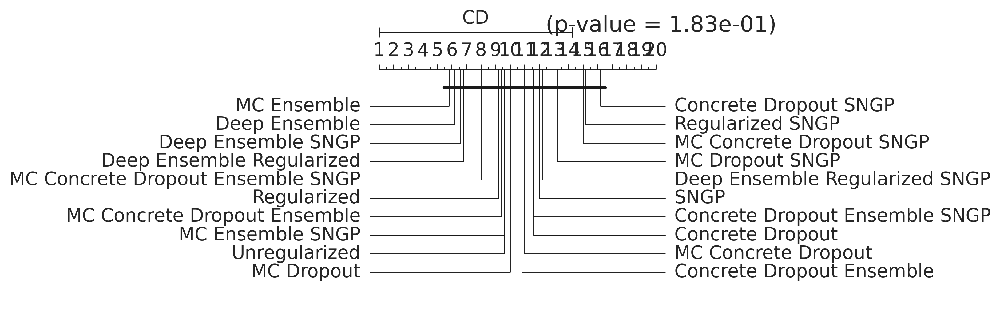

In [94]:
#df = SNGP_datasets(ood=True, avg=False, boxing=True, max_norm=False)
#df["dataset"].value_counts()
#df["method"].value_counts()
#oodf = df #shorten_legend(df)
#metric = "AUROC" #"NLL(↓)"

#df = SNGP_datasets(ood=True, avg=False, boxing=True, max_norm=False)
df = SNGP_datasets(ood=True, avg=False, boxing=True, max_norm=False)
metric = "AUROC"#"NLL(↓)"
print(df)

def boxplot_metric_dataset(ddf, metric, dataset):
    sns.set_context("paper", font_scale = 1.2)

    df = ddf[ddf["dataset"] == dataset]
    df["range"] = np.arange(len(df))
    
    std_df = df.groupby(["method","dataset"],as_index=False).sem() #error bars or std?
    std_df["methodref"] = std_df["method"].apply(lambda x: refs.index(x))
    std_df = std_df.sort_values(by=["methodref","s"],ascending=False)#.reset_index(drop=True)
    
    errors = std_df[metric].fillna(0)
    
    mean_df = df.groupby(["method","dataset"],as_index=False).mean()
    mean_df["methodref"] = mean_df["method"].apply(lambda x: refs.index(x))
    mean_df = mean_df.sort_values(by=["methodref","s"],ascending=False)#.reset_index(drop=True)
    mean_df = shorten_legend(mean_df)
    g = mean_df.plot(x="method",y=metric, xerr=errors.tolist(), kind="barh", legend=False, color=palette)
    
    g.set_xlabel(str(metric))
    #g.set_xlim([mean_df[metric].min()-mean_df[metric].std(), mean_df[metric].max()+mean_df[metric].sem()])

    #g.set_xlim([mean_df[metric].min()-mean_df[metric].std(), mean_df[metric].max()+mean_df[metric].sem()])
    g.set_title(f"SNGP - {d}",fontweight="bold")
    #plt.gca().invert_yaxis()
    #plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,frameon=False,fontsize="small")

    plt.tight_layout()
    plt.savefig("SNGP-errorbars"+dataset+"_"+metric+".png")
    #lm = sns.lmplot(data=df[[metric,'method','dataset', "range"]],x="range", y=metric, hue="method", markers=markers,palette=palette, scatter=True,legend=True,scatter_kws={"s": 150, "alpha":0.7})


def plot_metric_dataset(ddf, metric, dataset):
    df = ddf[ddf["dataset"] == dataset]
#     vmin, vmax = df["metric"].min(), df["metric"].max()
#     norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax)
#     cmap = matplotlib.cm.get_cmap('GnBu') # green to blue color way
    #g = sns.boxplot(x="method", y=metric, hue="method", data=df, palette=palette)
    #g = sns.scatterplot(x="method", y=metric, hue="method", data=df, palette=palette, markers=markers, s=150,alpha=0.7, legend=False)
    #g = sns.catplot(x="method", y=metric, hue="method", data=df,legend_out=True, kind="box")
    df["range"] = np.arange(len(df))
    #bp = df[df["dataset"] == dataset].boxplot(column=metric, by='method', grid=False)
    lm = sns.lmplot(data=df[[metric,'method','dataset', "range"]],x="range", y=metric, hue="method", markers=markers,palette=palette, scatter=True,legend=True,scatter_kws={"s": 150, "alpha":0.7})
    lm.set(xticklabels=[]) #should remove tick labels. ...
    lm.set(xlabel=None)
    #g = sns.catplot(x="method", y=metric, hue="method", data=df[df["dataset"] == dataset],legend_out=True)

def stats_analysis(df, measure):
    """
    std_df = df.groupby(["method","dataset"],as_index=False).sem() #error bars or std?
    std_df["methodref"] = std_df["method"].apply(lambda x: refs.index(x))
    std_df = std_df.sort_values(by=["methodref","s"],ascending=False)#.reset_index(drop=True)
    
    errors = std_df[metric].fillna(0)
    
    mean_df = df.groupby(["method","dataset"],as_index=False).mean()
    mean_df["methodref"] = mean_df["method"].apply(lambda x: refs.index(x))
    mean_df = mean_df.sort_values(by=["methodref","s"],ascending=False)#.reset_index(drop=True)
    mean_df = shorten_legend(mean_df)
    """
    
    #df = df.groupby(["method","dataset"],as_index=False)
    #df = df.groupby(["method","dataset"],as_index=False).mean(numeric_only=True)

    """
    if "↓" in measure:
        df = df.min(numeric_only=True)
    else:
        df = df.max(numeric_only=True)
    """
        
    sns.set_context("paper",font_scale=1.5)

    #oodf = oodf[~oodf["dataset"].isin(["20news", "CLINC150", "imdb"])]
    table = df.pivot_table(index=['dataset'],
                               columns=['method'],
                               values=[measure],
                               aggfunc=np.mean)
    print(table)
    #table = table[~table.isna().any(axis=1)]
    #if max_is_better:
    #if not "↓" in measure:
    table *= -1 #lower is better

    #We first compute the average rank of every method
    from scipy.stats import rankdata
    ranking_table = table.apply(rankdata, axis=1).mean()
    print(ranking_table)

    from pycalib.stats import compute_friedmanchisquare

    ftest = compute_friedmanchisquare(table)
    print(ftest) #barely significant

    from pycalib.visualisations import plot_critical_difference

    _ = plot_critical_difference(avranks=ranking_table,
                               num_datasets=table.shape[0],
                               names=table.columns.levels[1],
                               title='{}    (p-value = {:.2e})'.format("", 
                                                                            ftest.pvalue)) #5datasets

def wins_and_losses(df,measure):
    """
    df = df.groupby(["method","dataset"],as_index=False)
    if "↓" in measure:
        df = df.min(numeric_only=True)
    else:
    df = df.max(numeric_only=True)
    """
 
    from collections import Counter
    wins = []
    draws = []
    losses = []
    rf = "method"
    for metric in [measure]: #, 'ECE(↓)'
        for dataset in df["dataset"].unique():
            for baseline in df[rf].unique():
                vs = df[(df["dataset"] == dataset) & (df[rf] == baseline)][metric]
                if len(vs) == 1:
                    vs = vs.item()
                else:
                    vs = vs.agg("mean")
                    #print(vs, baseline,dataset)
                    #continue
                vs = np.round(vs,3)
                for ref in df[rf].unique():
                    if ref == baseline:
                        continue
                    condition = (df["dataset"] == dataset) & (df[rf] == ref)
                    v = df[condition][metric]

                    if len(v) == 1:
                        v = v.item()
                        v = np.round(v,3)
                    else:
                        v = v.agg("mean")
                        #print(vs, ref, dataset)
                        #continue
                    if v > vs: 
                        wins.append(ref)
                    elif v == vs:
                        draws.append(ref)
                    else:
                        losses.append(ref)

    cw = Counter(wins)
    cd = Counter(draws)
    cl = Counter(losses)

    new_df = pd.DataFrame(refs, columns=["ref"]) 
    new_df["wins"] = [cw.get(ref, 0) for ref in refs]
    new_df["draws"] = [cd.get(ref, 0) for ref in refs]
    new_df["losses"] = [cl.get(ref, 0) for ref in refs]
    scores = new_df.sort_values(by=["wins", "draws","ref"], ascending=False)
    #print(scores)

    print("\n".join([
    "\\begin{table}[h]",
    "\\resizebox{1\columnwidth}{!}{",
        scores.to_latex(index=False),
        "}\caption{}",
        "\end{table}"
    ]))

def score_over_norm(df, metric):
    ensemble_filter = ~df["version"].apply(lambda x: "M5" in x)
    base_filter = df["version"].apply(lambda x: "nodropout" in x)
    without_ensemble = df[ensemble_filter]
    base = df[ensemble_filter & base_filter]
    baseline = df[ensemble_filter & ~base_filter]
    cutoff = len(without_ensemble["method"].unique())
    new_markers = markers[:5] + markers[-5:]
    print(new_markers)
    new_pal =  palette[:5] + palette[-5:]
    lm = sns.lmplot(data=without_ensemble[[metric,'method','dataset', "s"]],x="s", y=metric, hue="method",markers=new_markers,palette=new_pal,scatter=True,legend=True,scatter_kws={"s": 150, "alpha":0.7})
    lm.set(xlim=(-1, 16))
    
stats_analysis(df, metric)
wins_and_losses(df, metric)
#print(df[metric])
#score_over_norm(df, metric)
for d in "CLINC150|20news|Reuters|imdb|AAPD".split("|"): 
    #lm = sns.lmplot(data=df[[metric,'method','dataset', "s"]],x="s", y=metric, hue="method", markers=markers,palette=palette, scatter=True,legend=True,scatter_kws={"s": 150, "alpha":0.7})
    #plot_metric_dataset(df,metric,d)
    #boxplot_metric_dataset(df,metric,d)
    pass
    #plt.legend([],[], frameon=False)
    #plt.title(f"SNGP - {d}")    

    

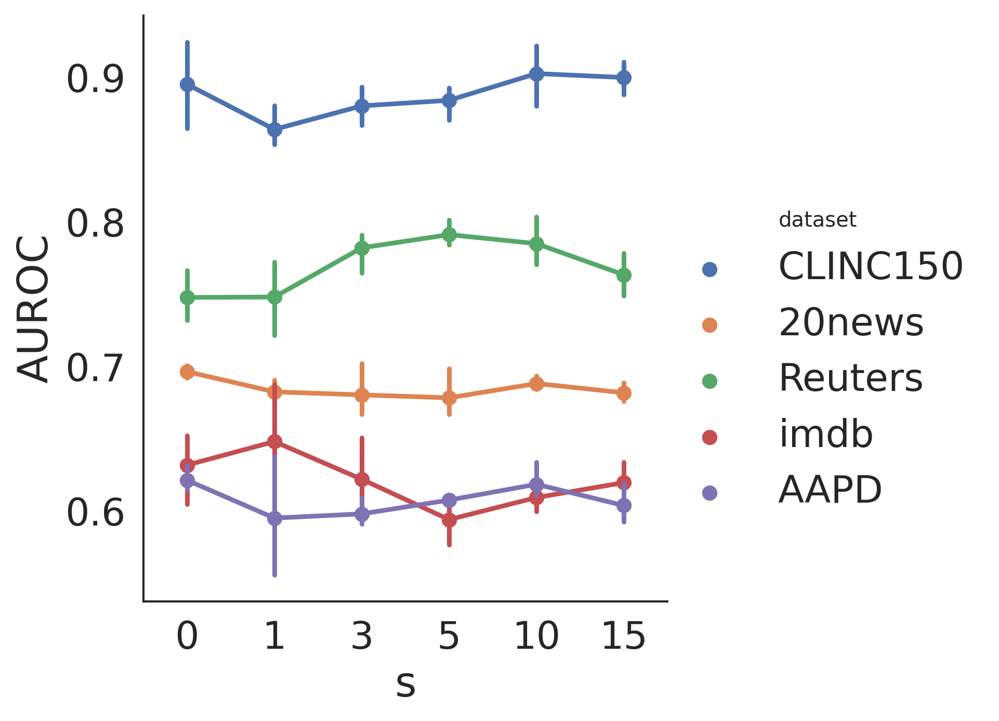

In [48]:
sns.set_context("paper", font_scale = 2)

df = SNGP_datasets(ood=True, avg=False, boxing=True, max_norm=False)

ensemble_filter = ~df["version"].apply(lambda x: "M5" in x)
base_filter = df["version"].apply(lambda x: "nodropout" in x)
without_ensemble = df[ensemble_filter]
base = df[ensemble_filter & base_filter]
baseline = df[ensemble_filter & ~base_filter]
#metric = "NLL(↓)"
metric = "AUROC"
#g = sns.lmplot(x="s", y=metric, hue="dataset", data=without_ensemble,legend_out=True)#,kind="point")

g = sns.catplot(x="s", y=metric, hue="dataset", data=without_ensemble,legend_out=True,kind="point")

In [353]:
import seaborn as sns
sns.set(color_codes=True)
sns.set_style('white')
sns.set_context("paper", font_scale = 2)
df = SNGP_datasets(ood=False)
df = df[~df["version"].str.contains("0.5")]
df["s"] = df["version"].apply(lambda x: find_else(x))
df = df[df["s"] <= 15]

ddf = translate_SNGP_ref(df)

ensemble_filter = ~df["version"].apply(lambda x: "M5" in x)
base_filter = df["version"].apply(lambda x: "nodropout" in x)
without_ensemble = df[ensemble_filter]
base = df[ensemble_filter & base_filter]
baseline = df[ensemble_filter & ~base_filter]

metric = "AUROC" #"NLL(↓)"

#g = sns.catplot(x="s", y=metric, hue="dataset", data=base,legend_out=True,kind="point")

/home/jordy/.virtualenvs/arkham/lib/python3.6/site-packages/ipykernel_launcher.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


KeyError: 'version'

In [42]:
df[["ref", "s"]]

,ref,s
0,Deep Ensemble Regularized,0
1,MC Ensemble,0
2,Regularized,0
3,MC Dropout,0
4,Regularized,10
...,...,...
23,Deep Ensemble,15
24,Unregularized,15
25,Unregularized,1
26,Unregularized,3


In [ ]:
g = sns.catplot(x="s", y=metric, hue="dataset", data=df,legend_out=True)

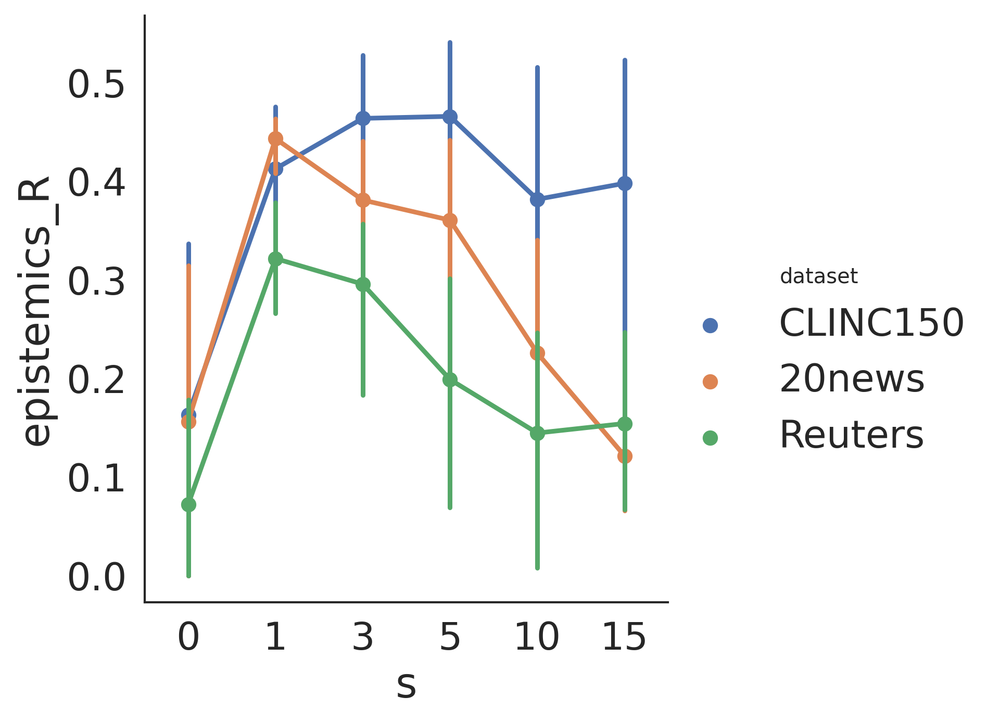

In [352]:
metric = "epistemics_R"
g = sns.catplot(x="s", y=metric, hue="dataset", data=without_ensemble,legend_out=True,kind="point")

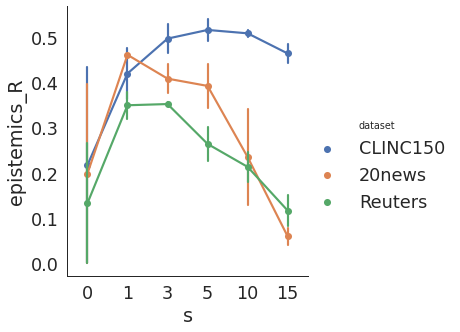

In [31]:
metric = "epistemics_R"
g = sns.catplot(x="s", y=metric, hue="dataset", data=baseline,legend_out=True,kind="point")

## Absolute number results SNGP

In [74]:
replacer = {"entropy_R":"Entropy", "confidence_R": "Softmax", "aleatorics_R":"DU", "epistemics_R":"MU", "mutual_information_R":"MI"}

def translate(text, args_dict):
    for key in args_dict.keys():
        text = text.replace(key, str(args_dict[key]))
    return text

metrics = ['Acc', 'NLL(↓)', 'ECE(↓)','Brier(↓)', 'Entropy(μ)', 'Softmax(μ)', 'MU(μ)', 'DU(μ)'] #'MSE(↓)', 'F1(m)', 'F1(M)', 'AUC',
ood_metrics = ['AUROC', 'AUPR', 'Entropy', 'Softmax', 'MU', 'DU', 'MI'] #'Acc_IID', 

df = SNGP_datasets(ood=False, avg=False, boxing=True, max_norm=False)
oodf = SNGP_datasets(ood=True, avg=False, boxing=True, max_norm=False)
oodf.columns = [translate(col,replacer) for col in oodf.columns]

id_latexed = average_metrics_to_latex(df, metrics, over="dataset", keep=["method"], caption="Comparison over in-domain setup for SNGP TextCNNv2 models.")
ood_latexed = average_metrics_to_latex(oodf, ood_metrics, over="dataset", keep=["method"], caption="Comparison over novelty detection setup for SNGP TextCNNv2 models.")

/home/jordy/.virtualenvs/arkham/lib/python3.6/site-packages/ipykernel_launcher.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [75]:
print(id_latexed)
print(ood_latexed)

\begin{table}[h]
\resizebox{1\columnwidth}{!}{
\begin{tabular}{lcccccccc}
\toprule
{} &                         Acc &            NLL $\downarrow$ &            ECE $\downarrow$ &          Brier $\downarrow$ &               Softmax $\mu$ &               Entropy $\mu$ &                    MU $\mu$ &    DU $\mu$ \\
Method                            &                             &                             &                             &                             &                             &                             &                             &             \\
\midrule
Unregularized                     &           0.644 $\pm$ 0.237 &           1.735 $\pm$ 1.539 &           0.128 $\pm$ 0.149 &           0.507 $\pm$ 0.332 &           0.775 $\pm$ 0.178 &           1.054 $\pm$ 0.734 &                           0 &  \textbf{0} \\
Regularized                       &           0.640 $\pm$ 0.249 &           1.843 $\pm$ 1.677 &           0.102 $\pm$ 0.107 &           0.531 $\pm$ 0.363 & 